# Modelisation
## Auteur Linda MARTIN

Aprés la restructuration des données, on peut étudier les différents metaparamètres des modéles utilisables pour effectuer l'apprentissage des données. Comme nos données sont en fonction du temps, elles ne peuvent pas être mélangées. Pour ce type de problème,  les modèles sont de type RNN (réseau neuronal récurrent) car l'apprentissage se fait par séquence de temps et la sortie doit restituer cette séquence. Les 2 modèles que je vais expérimenter sont GRU (Gated Recurrent Unit) et LSTM (Long Short Term Memory) qui drivent de RNN.

In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import lightgbm as lgb
import warnings
import pathlib as pl
from typing import Tuple
from typing import List
warnings.filterwarnings("ignore")

In [3]:
class DataLoader:
    """Charge des fichiers de données"""
    def __init__(self, data_path: str="../data/"):
        self.datapath = data_path
        self.train_path = pl.Path(data_path) / "train.csv"
        self.test_path = pl.Path(data_path) / "test.csv"
        self.train_labels_path = pl.Path(data_path) / "train_labels.csv"
        self.target_pairs_path = pl.Path(data_path) / "target_pairs.csv"
        
    def load_data(self) -> Tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame]:
        train_df = pd.read_csv(self.train_path, index_col='date_id')
        test_df = pd.read_csv(self.test_path, index_col='date_id')
        train_labels_df = pd.read_csv(self.train_labels_path, index_col='date_id')
        target_pairs_df = pd.read_csv(self.target_pairs_path)
        return train_df, test_df, train_labels_df, target_pairs_df

class PreProcess:
    """PreProcess - regroupement des données par catégory"""
    def __init__(self):
        pass

    def get_train_info(self, df):
        """ Construction d'une data des entêtes de colonnes.
        Args:
            df (pd.DataFrame): Input dataframe d'entrainement.
        Returns:
            pd.DataFrame: Détail des informations de chaque colonne.
        """
        df_names = df.columns
        # Fonction pour nettoyer et split les noms
        def clean_and_split(name):
            name = name.replace("open_interest", "open interest")
            name = name.replace("settlement_price", "settlement price")
            name = name.replace("US_Stock", "US Stock")
            name = name.replace("adj_close", "Close")
            name = name.replace("adj_", "adjusted ")
            name = name.replace("-", "_")
            return name.split("_")

        # Création du DataFrame d'infos
        df_info = pd.DataFrame(
            {
            'Column': df_names,
            'Split': [clean_and_split(name) for name in df_names]
        })

        df_info['Category'] = df_info['Split'].apply(lambda x: x[0])    
        df_info['Ticker'] = df_info['Split'].apply(
        lambda x: "_".join(x[1:-1]) if len(x) > 2 else x[-1] if len(x) == 2 else ""
        )
        df_info['Type'] = df_info['Split'].apply(lambda x: x[-1])

        # Nettoyage final
        df_info['Ticker'] = df_info.apply(
            lambda row: row['Type'] if row['Ticker'] == "" else row['Ticker'], axis=1
        )
        df_info['Column_Id'] = df_info.index + 1

        # Sélection des colonnes finales
        df_info = df_info[['Column_Id', 'Column', 'Category', 'Ticker', 'Type']]    
        return df_info
    
    def get_preprocess_data(self, df, cond):
        # Fonction pour obtenir les données prétraitées en fonction de la condition
        if cond.Column.size > 0:
            return df[cond.Column.values[0]]
        else:
            return None
        
    def preprocess(self, df: pd.DataFrame) -> pd.DataFrame:
        df_processed = df.copy()
        df_processed = df_processed.drop(columns=['is_score'], errors='ignore')
        df_info = self.get_train_info(df_processed)


        df_processed.reset_index(inplace=True)
        # On renomme la date_id en date
        df_processed = df_processed.rename({'date_id': 'date'}, axis='columns')
        # Initialisation du DataFrame résultat
        result = pd.DataFrame(columns=['date', 'id', 'close', 'open', 'high', 'low', 'volume', 'sprice', 'interest'])
        
        for  Category  in df_info.groupby('Category').groups.keys():
            txtCategory=Category.replace(' ','_')
            for label in df_info[(df_info.Category==Category)].groupby('Ticker').groups.keys():
                temp_df = pd.DataFrame()
                temp_df['date'] = df_processed['date']
                temp_df['id'] = f'{txtCategory}_{label}'

                if Category in ['FX','LME']:
                    temp_df['close'] = df_processed[df_info[(df_info.Category==Category) & (df_info.Ticker==label)].Column.values[0]]
                    temp_df['open'] = None
                    temp_df['high'] = None
                    temp_df['low'] = None
                    temp_df['volume'] = None
                    temp_df['sprice'] = None
                    temp_df['interest'] = None
                else:
                    temp_df['close'] = self.get_preprocess_data(df_processed,df_info[(df_info.Category==Category) & (df_info.Ticker==label) & (df_info.Type.isin(['Close', 'adjusted close']))])
                    temp_df['open'] = self.get_preprocess_data(df_processed,df_info[(df_info.Category==Category) & (df_info.Ticker==label) & (df_info.Type.isin(['Open','adjusted open']))])
                    temp_df['high'] = self.get_preprocess_data(df_processed,df_info[(df_info.Category==Category) & (df_info.Ticker==label) & (df_info.Type.isin(['High','adjusted high']))])
                    temp_df['low'] = self.get_preprocess_data(df_processed,df_info[(df_info.Category==Category) & (df_info.Ticker==label) & (df_info.Type.isin(['Low','adjusted low']))])
                    temp_df['volume'] = self.get_preprocess_data(df_processed,df_info[(df_info.Category==Category) & (df_info.Ticker==label) & (df_info.Type.isin(['Volume', 'adjusted volume']))])
                    temp_df['sprice'] = self.get_preprocess_data(df_processed,df_info[(df_info.Category==Category) & (df_info.Ticker==label) & (df_info.Type.isin(['settlement price','adjusted settlement price']))])
                    temp_df['interest'] = self.get_preprocess_data(df_processed,df_info[(df_info.Category==Category) & (df_info.Ticker==label) & (df_info.Type.isin(['open interest','adjusted open interest']))])
                result = pd.concat([result, temp_df], ignore_index=True)
        
        # Réinitialiser l'index
        result = result.reset_index(drop=True)
        
        # Trier par date et id 
        result = result.sort_values(['date', 'id']).reset_index(drop=True)
        
        return result  
    
class FeatureEngineer:
    """Creation des fonctions """
    def __init__(self):
        pass

    def add_lag_features(self,
        df: pd.DataFrame, 
        lags: List[int], 
        date_col: str = 'date'
        ) -> pd.DataFrame:
        """
        Add lag features for specified columns and lags.
        """
        df = df.sort_values(date_col)
        cols = set(df.columns)
        cols.remove('id')
        cols.remove('date')
        for col in cols:
            for lag in lags:
                df[f'{col}_lag{lag}'] = df.groupby('id')[col].shift(lag)
        return df
    
    def add_rolling_features(self,
        df: pd.DataFrame,
        windows: List[int],
        date_col: str = 'date') -> pd.DataFrame:
        """ 
        Add rolling mean and std features for specified columns and windows.
        """
        df = df.sort_values(date_col)
        cols = set(df.columns)
        cols.remove('id')
        cols.remove('date')
        for col in cols:
            for window in windows:
                df[f'{col}_rollmean{window}'] = df.groupby('id')[col].transform(lambda x: x.rolling(window, min_periods=1).mean())
                df[f'{col}_rollstd{window}'] = df.groupby('id')[col].transform(lambda x: x.rolling(window, min_periods=1).std())
                df[f'{col}_rollmin{window}'] = df.groupby('id')[col].transform(lambda x: x.rolling(window, min_periods=1).min())
                df[f'{col}_rollmax{window}'] = df.groupby('id')[col].transform(lambda x: x.rolling(window, min_periods=1).max())
        return df
    
    def prepare_features(self, df: pd.DataFrame) ->pd.DataFrame:
        """Engineer features for training and testing data"""
        try:
            # add lag
            df_result = df.copy()
            df_result = self.add_lag_features(df_result, lags=[1, 2, 3, 5, 7])  
            # Add rolling features
            df_result = self.add_rolling_features(df_result, windows=[5, 10, 15])
            # Handle missing values
            df_result = df_result.fillna(method='ffill').fillna(method='bfill').fillna(0)

            return df_result
        except Exception as e:
            print(f"Feature preparation failed: {e}")
            raise

In [4]:
    
class FeatureTarget:
    """Class to handle target feature engineering"""
    def __init__(self):
        pass
    
    def prepare_targets(self, train_labels_df: pd.DataFrame) -> pd.DataFrame:
        """Prepare target information from pairs DataFrame.
        Args:
            pairs (pd.DataFrame): DataFrame containing 'pair' column.   
        Returns:
            pd.DataFrame: DataFrame with target information including price_1, price_2, and is_pair.
        """
        target_cols = [col for col in train_labels_df.columns if col not in ['timestamp', 'id']]
        display(target_cols)
        target_values = train_labels_df[target_cols]
        return target_values, target_cols
    
    def prepare_targets_info(self, pairs: pd.DataFrame) -> pd.DataFrame:
        """Prepare target information from pairs DataFrame.
        Args:
            pairs (pd.DataFrame): DataFrame containing 'pair' column.
        Returns:
            pd.DataFrame: DataFrame with target information including price_1, price_2, and is_pair.
        """

        target_definitions = pairs["pair"].str.split(" - ", expand=True)
        target_info = pairs.copy()

        # Colonnes price_1 et price_2 (équivalent aux colonnes [,1] et [,2])
        target_info["price_1"] = target_definitions[0]
        target_info["price_2"] = target_definitions[1]

        # is.pair = second élément non vide
        target_info['is_pair'] = target_info['price_2'].apply(lambda x:x is not None)

        # Retirer la colonne "pair"
        target_info = target_info.drop(columns=["pair"])
        return target_info

In [5]:
dataLoader = DataLoader()
featureTarget = FeatureTarget()
featureEngineer = FeatureEngineer()
preProcess = PreProcess()

In [6]:
train_df, test_df, train_labels_df, target_pairs_df = dataLoader.load_data()
train_df_process = preProcess.preprocess(train_df)
test_df_process = preProcess.preprocess(test_df)



Données d'entrainnement

In [7]:
display(train_df_process)

,date,id,close,open,high,low,volume,sprice,interest
0,0,FX_AUDCAD,0.979601,NaN,NaN,NaN,NaN,NaN,NaN
1,0,FX_AUDCHF,0.761027,NaN,NaN,NaN,NaN,NaN,NaN
2,0,FX_AUDJPY,87.933498,NaN,NaN,NaN,NaN,NaN,NaN
3,0,FX_AUDNZD,1.103011,NaN,NaN,NaN,NaN,NaN,NaN
4,0,FX_AUDUSD,0.783393,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
274126,1916,US_Stock_X,52.010000,44.250,54.000,43.75,54155188.0,NaN,NaN
274127,1916,US_Stock_XLB,85.700000,85.220,86.010,85.06,3671594.0,NaN,NaN
274128,1916,US_Stock_XLE,81.990000,81.010,82.195,80.98,11755456.0,NaN,NaN
274129,1916,US_Stock_XOM,103.030000,102.595,103.470,102.07,12061606.0,NaN,NaN


Creation des fonctions

In [8]:
train_df_feature = featureEngineer.prepare_features(train_df_process)
test_df_feature = featureEngineer.prepare_features(test_df_process)
display(train_df_feature)

,date,id,close,open,high,low,volume,sprice,interest,open_lag1,...,interest_lag7_rollmin5,interest_lag7_rollmax5,interest_lag7_rollmean10,interest_lag7_rollstd10,interest_lag7_rollmin10,interest_lag7_rollmax10,interest_lag7_rollmean15,interest_lag7_rollstd15,interest_lag7_rollmin15,interest_lag7_rollmax15
0,0,FX_AUDCAD,0.979601,23.9998,24.5242,23.8900,2464147.0,4730.0,1768.0,57.3474,...,1768.0,1768.0,1768.000000,182.433550,1768.0,1768.0,1768.000000,182.433550,1768.0,1768.0
2,0,FX_AUDJPY,87.933498,23.9998,24.5242,23.8900,2464147.0,4730.0,1768.0,57.3474,...,1768.0,1768.0,1768.000000,182.433550,1768.0,1768.0,1768.000000,182.433550,1768.0,1768.0
3,0,FX_AUDNZD,1.103011,23.9998,24.5242,23.8900,2464147.0,4730.0,1768.0,57.3474,...,1768.0,1768.0,1768.000000,182.433550,1768.0,1768.0,1768.000000,182.433550,1768.0,1768.0
4,0,FX_AUDUSD,0.783393,23.9998,24.5242,23.8900,2464147.0,4730.0,1768.0,57.3474,...,1768.0,1768.0,1768.000000,182.433550,1768.0,1768.0,1768.000000,182.433550,1768.0,1768.0
5,0,FX_CADCHF,0.776874,23.9998,24.5242,23.8900,2464147.0,4730.0,1768.0,57.3474,...,1768.0,1768.0,1768.000000,182.433550,1768.0,1768.0,1768.000000,182.433550,1768.0,1768.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
274060,1916,US_Stock_EOG,110.180000,109.3100,110.6000,109.3100,1993261.0,320.0,1763.0,110.4100,...,1044.0,1478.0,1206.333333,155.875752,1044.0,1478.0,1322.153846,221.330765,1044.0,1600.0
274122,1916,US_Stock_VXUS,66.750000,66.2200,66.8800,66.1600,8117893.0,320.0,1763.0,66.4200,...,1044.0,1478.0,1206.333333,155.875752,1044.0,1478.0,1322.153846,221.330765,1044.0,1600.0
274113,1916,US_Stock_VCSH,78.484200,78.5340,78.5539,78.4344,1837493.0,320.0,1763.0,78.3646,...,1044.0,1478.0,1206.333333,155.875752,1044.0,1478.0,1322.153846,221.330765,1044.0,1600.0
274023,1916,FX_ZARGBP,0.041404,78.5340,78.5539,78.4344,1837493.0,320.0,1763.0,78.3646,...,1044.0,1478.0,1206.333333,155.875752,1044.0,1478.0,1322.153846,221.330765,1044.0,1600.0


Prepa targets

In [9]:
target_values,target_cols = featureTarget.prepare_targets(train_labels_df)
display(target_values)

['target_0',
 'target_1',
 'target_2',
 'target_3',
 'target_4',
 'target_5',
 'target_6',
 'target_7',
 'target_8',
 'target_9',
 'target_10',
 'target_11',
 'target_12',
 'target_13',
 'target_14',
 'target_15',
 'target_16',
 'target_17',
 'target_18',
 'target_19',
 'target_20',
 'target_21',
 'target_22',
 'target_23',
 'target_24',
 'target_25',
 'target_26',
 'target_27',
 'target_28',
 'target_29',
 'target_30',
 'target_31',
 'target_32',
 'target_33',
 'target_34',
 'target_35',
 'target_36',
 'target_37',
 'target_38',
 'target_39',
 'target_40',
 'target_41',
 'target_42',
 'target_43',
 'target_44',
 'target_45',
 'target_46',
 'target_47',
 'target_48',
 'target_49',
 'target_50',
 'target_51',
 'target_52',
 'target_53',
 'target_54',
 'target_55',
 'target_56',
 'target_57',
 'target_58',
 'target_59',
 'target_60',
 'target_61',
 'target_62',
 'target_63',
 'target_64',
 'target_65',
 'target_66',
 'target_67',
 'target_68',
 'target_69',
 'target_70',
 'target_71',
 '

,target_0,target_1,target_2,target_3,target_4,target_5,target_6,target_7,target_8,target_9,...,target_414,target_415,target_416,target_417,target_418,target_419,target_420,target_421,target_422,target_423
date_id,,,,,,,,,,,,,,,,,,,,,
0,0.005948,-0.002851,-0.004675,-0.000639,NaN,NaN,-0.006729,0.006066,NaN,0.003446,...,NaN,0.021239,-0.005595,NaN,-0.004628,0.033793,NaN,0.038234,NaN,0.027310
1,0.005783,-0.024118,-0.007052,-0.018955,-0.031852,-0.019452,0.003002,-0.006876,-0.002042,0.021284,...,0.003377,0.021372,-0.001517,0.012846,0.010547,0.030527,-0.000764,0.025021,0.003548,0.020940
2,0.001048,0.023836,-0.008934,-0.022060,NaN,NaN,0.037449,0.007658,NaN,-0.026844,...,-0.006712,0.009308,0.001857,-0.012761,-0.002345,0.017529,-0.005394,0.004835,-0.009075,0.001706
3,0.001700,-0.024618,0.011943,0.004778,NaN,NaN,-0.012519,-0.016896,NaN,0.014843,...,NaN,0.036880,-0.015189,NaN,0.008118,0.001079,NaN,-0.015102,NaN,-0.033010
4,-0.003272,0.005234,0.006856,0.013312,0.023953,0.010681,-0.011649,0.002019,0.003897,-0.008985,...,NaN,0.004937,NaN,-0.006673,-0.016105,-0.004885,NaN,NaN,0.009514,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1912,-0.012596,0.009309,0.007947,0.006477,-0.026216,-0.029487,-0.003287,0.011751,-0.027610,0.000665,...,NaN,NaN,NaN,0.042052,NaN,NaN,NaN,NaN,0.031006,NaN
1913,-0.000736,-0.001292,-0.005137,-0.007961,-0.008494,-0.011547,0.004263,0.005670,-0.004822,-0.000875,...,-0.012992,-0.003349,0.010912,0.006198,-0.009216,-0.003038,-0.026082,-0.008057,-0.002069,-0.141053
1914,-0.002294,0.012898,0.009978,0.001567,0.002596,-0.007373,0.007554,0.002661,0.004083,-0.006220,...,-0.005240,0.004044,0.004459,0.002619,0.001308,-0.006772,-0.019918,-0.013304,-0.005527,-0.127688


In [10]:
target_info = featureTarget.prepare_targets_info(target_pairs_df)
# train target values
def convert_to_colname(colname:str)-> str:
    if colname is None:
        return None
    if colname.startswith("FX_"):
        return colname
    colname = colname.replace("_adj","")
    colname = colname.rsplit('_', 1)[0]
    return colname

def getnameprice(indexe_target:int):
    target_name = target_info.loc[indexe_target,'target']
    target_col1 = convert_to_colname(target_info.loc[indexe_target,'price_1'])
    target_col2 = convert_to_colname(target_info.loc[indexe_target,'price_2'])
    return  target_name, target_col1, target_col2

def train_features_build(target_col1,target_col2):
# Filter for the two targets
    if target_col2 is not None:
        df_target2 = train_df_feature[train_df_feature['id'] == target_col2]
        df_target1 = train_df_feature[train_df_feature['id'] == target_col1]
        
        # Concatenate the two DataFrames side by side (axis=1)
        result = df_target2.merge(
    df_target1,
    on='date',
    how='left',   # ou 'left'
    suffixes=('_t2', '_t1'))
        result = result.reset_index()
        result = result.drop(['id_t2', 'date_t2','id_t1', 'date_t1', 'index', 'date'], axis=1, errors='ignore')
        
        return result
    else:
    
        df_target1 = train_df_feature[train_df_feature['id'] == target_col1]
        # Concatenate the two DataFrames side by side (axis=1)
        result = df_target1
        result = result.reset_index()
        result = result.drop(['id', 'date', 'index'], axis=1, errors='ignore')
        
        return result



## creation des models

In [30]:
### import libraries
import torch
import torch.nn as nn
import numpy as np

class LSTMModel(nn.Module):
  """LSTM model for time series prediction"""
  def __init__(self,input_size,hidden_size=128,num_layers=2, dropout=0.2):
    super().__init__()

    # store parameters
    self.input_size = input_size
    self.hidden_size = hidden_size
    self.num_layers = num_layers

    # RNN Layer (notation: LSTM \in RNN)
    self.lstm = nn.LSTM(
      input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            dropout=dropout if num_layers > 1 else 0,
            batch_first=True
            )
    
    self.dropout = nn.Dropout(dropout)
    # linear layer for output
    self.fc = nn.Linear(hidden_size, 1)
    self.name = "LSTMModel"
    
  def forward(self,x):
    lstm_out, _ = self.lstm(x)
    last_output = lstm_out[:, -1, :]
    out = self.dropout(last_output)
    out = self.fc(out)
    return out
  

class GRUModel(nn.Module):
    """GRU model for time series prediction"""
    def __init__(self, input_size, hidden_size=128, num_layers=2, dropout=0.2):
        super(GRUModel, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        
        self.gru = nn.GRU(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            dropout=dropout if num_layers > 1 else 0,
            batch_first=True
        )
        
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_size, 1)
        self.name = "GRUModel"
        
    def forward(self, x):
        gru_out, _ = self.gru(x)
        last_output = gru_out[:, -1, :]
        out = self.dropout(last_output)
        out = self.fc(out)
        return out

## Entrainement du modele

In [12]:
from torch.utils.data import Dataset, DataLoader
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
import torch.optim as optim
import matplotlib.pyplot as plt

def plot_training_curves(train_losses, val_losses, target_name, model_name, save_path=None):
    """Plot training and validation loss curves"""
    plt.figure(figsize=(12, 5))
    
    epochs = range(len(train_losses))
    
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, 'b-', label='Training Loss', alpha=0.8)
    if val_losses:
        plt.plot(epochs, val_losses, 'r-', label='Validation Loss', alpha=0.8)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'{target_name} - {model_name}\nTraining Curves')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    if val_losses:
        plt.subplot(1, 2, 2)
        plt.plot(epochs, np.array(train_losses) - np.array(val_losses), 'g-', alpha=0.8)
        plt.xlabel('Epoch')
        plt.ylabel('Train Loss - Val Loss')
        plt.title(f'{target_name} - {model_name}\nLoss Difference')
        plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()
    
    return plt.gcf()

def plot_evaling_curves(val_lrs, val_mae, val_rmse, target_name, model_name, save_path=None):
    """Plot training and validation loss curves"""
    
    epochs = range(len(val_lrs))

    fig, ax = plt.subplots(1,3,figsize=(16, 6))
    ax[0].plot(epochs, val_lrs, 'b-', label='Rate learnning', alpha=0.8)
    ax[1].plot(epochs, val_mae, 'r-', label='MAE', alpha=0.8)
    ax[2].plot(epochs, val_rmse, 'g-', label='RMSE', alpha=0.8)

    ax[0].grid(True, alpha=0.3)
    ax[1].grid(True, alpha=0.3)
    ax[2].grid(True, alpha=0.3)
    
    ax[0].set_facecolor('#f0f0ff')
    ax[1].set_facecolor('#f0f0ff')
    ax[2].set_facecolor('#f0f0ff')

    ax[0].set_title("Rate learnning")
    ax[1].set_title("MAE")
    ax[2].set_title("RMSE")

    plt.suptitle(f'{target_name} - {model_name}\nEval')
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()
    
    return plt.gcf()

class TimeSeriesDataset(Dataset):
    """Custom Dataset for time series data"""
    def __init__(self, X, y, sequence_length=10):
        self.X = torch.FloatTensor(X)
        self.y = torch.FloatTensor(y)
        self.sequence_length = sequence_length
        
    def __len__(self):
        return len(self.X) - self.sequence_length
        
    def __getitem__(self, idx):
        return (
            self.X[idx:idx + self.sequence_length],
            self.y[idx + self.sequence_length]
        )
    
def prepare_data(X, y, sequence_length=10, batch_size=32):
        """Prepare data for training"""
        # Scale features

        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        
        # Create dataset and dataloader
        dataset = TimeSeriesDataset(X_scaled, y, sequence_length)
        dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
        
        return dataloader, X_scaled
        


In [13]:
def mae(y_pred, y_true):
    return torch.mean(torch.abs(y_pred - y_true))

def rmse(y_pred, y_true):
    return torch.sqrt(torch.mean((y_pred - y_true) ** 2))

def train_epoch(model, dataloader, optimizer, criterion):
    model.train()
    total_loss = 0

    for X, y in dataloader:
        batch_X, batch_y = X.to(device), y.to(device)
        optimizer.zero_grad()

        y_pred = model(batch_X)
        loss = criterion(y_pred.squeeze(), batch_y)

        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    return total_loss / len(dataloader)

def evaluate(model, dataloader, optimizer, criterion):
    model.eval()
    total_loss = 0
    y_preds, y_trues = [], []
    
    with torch.no_grad():
        for X, y in dataloader:
            batch_X, batch_y = X.to(device), y.to(device)
            optimizer.zero_grad()

            y_pred = model(batch_X)
            total_loss += criterion(y_pred.squeeze(), batch_y).item()
            y_preds.append(y_pred)
            y_trues.append(y)

            
    y_preds = torch.cat(y_preds)
    y_trues = torch.cat(y_trues)

    return (
        total_loss / len(dataloader),
        mae(y_preds, y_trues).item(),
        rmse(y_preds, y_trues).item()
    )

In [14]:
def train_models_for_target(
                p_target_values,
                target_col1:str,
                target_col2:str,
                model_type:str='LSTM',
                num_epochs:int=50,
                batch_size:int=32,
                learning_rate:float=0.001,
                patience:int=30):
    
    y = p_target_values
    mask = ~y.isna()
    X_all = train_features_build(target_col1,target_col2)
    
    X_valid = X_all.loc[mask]
    y_valid = y[mask]

    # Simple train/validation split (last 20% for validation)
    split_idx = int(len(X_valid) * 0.8)
    X_train = X_valid[:split_idx]
    y_train = y_valid[:split_idx]
    X_val = X_valid[split_idx:]
    y_val = y_valid[split_idx:]
    
    # Prepare data
    train_loader, X_scaled = prepare_data(
                    X_train, y_train.values, 
                    10, batch_size
                )
    val_loader, _  = prepare_data(
                    X_val, y_val.values, 
                    10, batch_size
                )
    
    # Initialize model
    input_size = X_train.shape[1]
    if model_type == 'LSTM':
        model = LSTMModel(input_size)
    elif model_type == 'GRU':
        model = GRUModel(input_size)
    else:
        raise ValueError("Invalid model type. Choose 'LSTM' or 'GRU'.")
    
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=patience/2, factor=0.5)
    best_val_loss = float('inf')
    patience_counter = 0

    train_losses = []
    val_losses = []
    val_maes = []
    val_rmses = []
    val_lrs = []
    # Training loop
    for epoch in range(num_epochs):
       
        train_loss = train_epoch(model, train_loader, optimizer, criterion)
        train_losses.append(train_loss)
        # Validation
        if val_loader is not None:

            val_loss, val_mae, val_rmse = evaluate(model, val_loader,optimizer,criterion )
            
            val_losses.append(val_loss)
            val_maes.append(val_mae)
            val_rmses.append(val_rmse)
            current_lr = optimizer.param_groups[0]["lr"]
            val_lrs.append(current_lr)
            # Learning rate scheduling
            scheduler.step(val_loss)
            
            # Early stopping
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                patience_counter = 0
            else:
                patience_counter += 1
            
            if patience_counter >= patience:
                print(f"Early stopping at epoch {epoch}")
                break
            
            
            if epoch % 2 == 0:
                print(
                    f"Epoch {epoch+1:02d} | "
                    f"LR: {current_lr:.1e} | "
                    f"Train Loss: {train_loss:.4f} | "
                    f"Val Loss: {val_loss:.4f} | "
                    f"MAE: {val_mae:.4f} | "
                    f"RMSE: {val_rmse:.4f}"
                )
                # print(f"Epoch {epoch}: Train Loss: {train_loss:.6f}, Val Loss: {val_loss:.6f}")
        else:
            if epoch % 2 == 0:
                print(f"Epoch {epoch}: Train Loss: {train_loss:.6f}")    
    

    
    return model, train_losses, val_losses , val_lrs, val_maes, val_rmses

In [15]:

idx:int = 0
tgt=target_cols[2]
y = target_values[tgt]
name,pric1,pric2 =getnameprice(idx)
model, train_losses, val_losses , val_lrs, val_maes, val_rmses = train_models_for_target(y,pric1,pric2)


Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0049 | Val Loss: 0.0017 | MAE: 0.0270 | RMSE: 0.0355
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0008 | Val Loss: 0.0006 | MAE: 0.0187 | RMSE: 0.0227
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0119 | RMSE: 0.0151
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0112 | RMSE: 0.0141
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0003 | MAE: 0.0143 | RMSE: 0.0176
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0113 | RMSE: 0.0142
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0001 | MAE: 0.0097 | RMSE: 0.0123
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0001 | MAE: 0.0097 | RMSE: 0.0123
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0098 | RMSE: 0.0124
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0108 | RMSE: 0.0135
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0116 | R

WindowsPath('../outputs/plots')

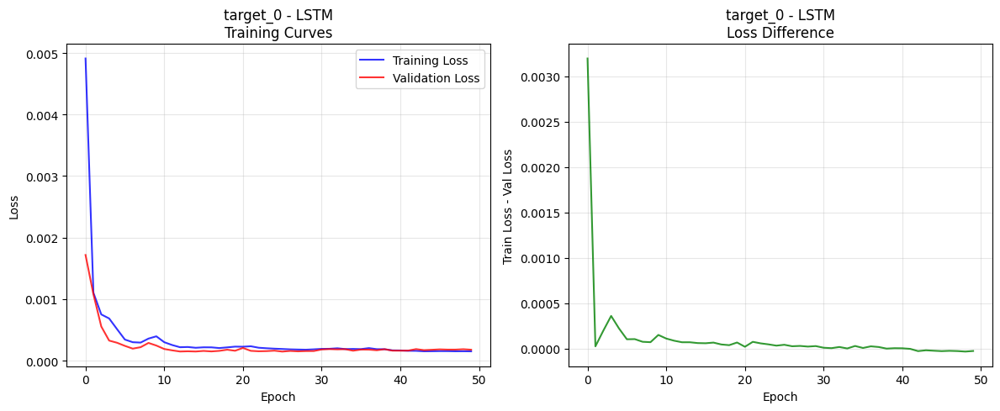

<Figure size 640x480 with 0 Axes>

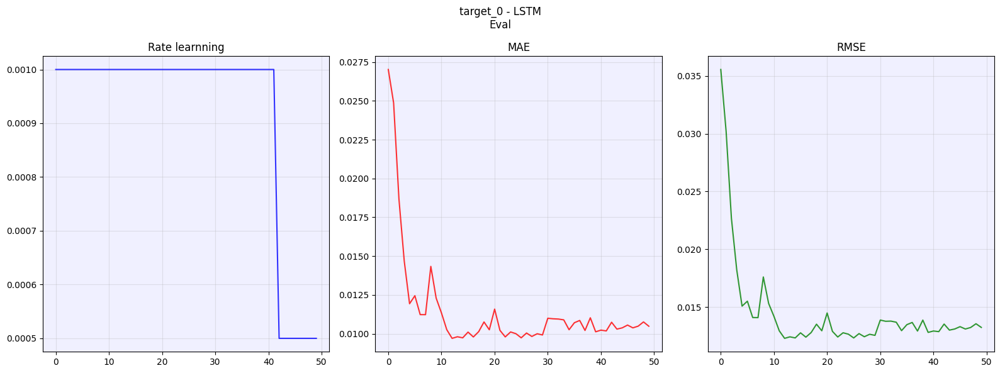

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [38]:
from pathlib import Path
 # Create plots directory
model_name:str = "LSTM"

plots_dir = Path('../outputs') / 'plots'
display(plots_dir)
plots_dir.mkdir(exist_ok=True)
train_plot_path = plots_dir /  f"{name}_{model_name}_training.png"
eval_plot_path = plots_dir /  f"{name}_{model_name}_eval.png"
plot_training_curves(train_losses, val_losses, name, model_name, save_path=train_plot_path) 
plot_evaling_curves(val_lrs, val_maes, val_rmses , name, model_name, save_path=eval_plot_path)

In [96]:
class PlotTest:
    def __init__(self, name, model_name =""):
        self.name = name
        self.model_name = model_name

        self.plots_dir = Path('../outputs') / 'plots'
        self.plots_dir.mkdir(exist_ok=True)

        self.plot_path =  plots_dir /  f"{name}_{model_name}.png"
        
        self.fig = None
        self.x = None
        
    def save(self, pathfile=None):
        if pathfile is None:
            pathfile = self.plot_path

        self.fig.tight_layout()
        self.fig.savefig(pathfile, dpi=300, bbox_inches='tight')
        plt.show()


class PlotTestTrain(PlotTest):
    def __init__(self, name, model_name=""):
        super().__init__(name, model_name)

        self.plot_path =  plots_dir /  f"{name}_{model_name}-train.png"
        
        self.fig, ax = plt.subplots(1,2,figsize=(16, 6))
        
        self.plt1 =  ax[0]
        self.plt2 =  ax[1]
    
    def save(self):
        self.plt1.legend()
        self.plt2.legend()
        
        super().save(self.plot_path)
        
    def __createplot(self):
        # ------------------
        # Plot 1 
        # ------------------
        self.plt1.set_xlabel('Epoch')
        self.plt1.set_ylabel('Loss')
        self.plt1.set_title(f' {self.model_name}\n{self.name}')
        self.plt1.grid(True, alpha=0.3)
        self.plt1.set_facecolor('#f0f0ff')
        # ------------------
        # Plot 2
        # ------------------
        self.plt2.set_xlabel('Epoch')
        self.plt2.set_ylabel('dif')
        self.plt2.set_title(f' {self.model_name}\nDifférence Curves')
        self.plt2.set_facecolor('#f0f0ff')
        self.plt2.grid(True, alpha=0.3)

    def addserie(self, name_serie,train_losses, val_losses):
        if self.x is None:
            self.x = range(len(train_losses))
            self.__createplot()
        self.plt1.plot(self.x, train_losses, label=f'{name_serie}-Training Loss', alpha=0.8)
        self.plt1.plot(self.x, val_losses, label=f'{name_serie}-valid Loss', alpha=0.8)

        self.plt2.plot(self.x, np.array(train_losses) - np.array(val_losses), label=f'{name_serie}', alpha=0.8)
        

class PlotTestEval(PlotTest):
    def __init__(self, name, modul_name=""):
        super().__init__(name, modul_name)

        self.plot_path =  plots_dir /  f"{name}_{modul_name}-eval.png"

        self.fig, ax = plt.subplots(1,3,figsize=(16, 6))
        
        self.plt1 =  ax[0]
        self.plt2 =  ax[1]
        self.plt3 =  ax[2]
    
    def save(self):

        self.plt1.legend()
        self.plt2.legend()
        self.plt3.legend()
        
        super().save(self.plot_path)

    def __createplot(self):
        # ------------------
        # Plot 1 
        # ------------------
        self.plt1.set_xlabel('Epoch')
        self.plt1.set_title(f' {self.model_name}\n{self.name}-LR')
        self.plt1.grid(True, alpha=0.3)
        self.plt1.set_facecolor('#f0f0ff')
        # ------------------
        # Plot 2
        # ------------------
        self.plt2.set_xlabel('Epoch')
        self.plt2.set_facecolor('#f0f0ff')
        self.plt2.set_title(f' {self.model_name}\n{self.name}-MAE')
        self.plt2.grid(True, alpha=0.3)

        # ------------------
        # Plot 3
        # ------------------
        self.plt3.set_xlabel('Epoch')
        self.plt3.set_facecolor('#f0f0ff')
        self.plt3.set_title(f' {self.model_name}\n{self.name}RMSE')
        self.plt3.grid(True, alpha=0.3)



    def addserie(self, name_serie, val_lrs, val_mae, val_rmse):
        if self.x is None:
            self.x = range(len(val_lrs))
            self.__createplot()

        self.plt1.plot(self.x, val_lrs, label=f'{name_serie}', alpha=0.8)
        self.plt2.plot(self.x, val_mae, label=f'{name_serie}', alpha=0.8)
        self.plt3.plot(self.x, val_rmse, label=f'{name_serie}', alpha=0.8)

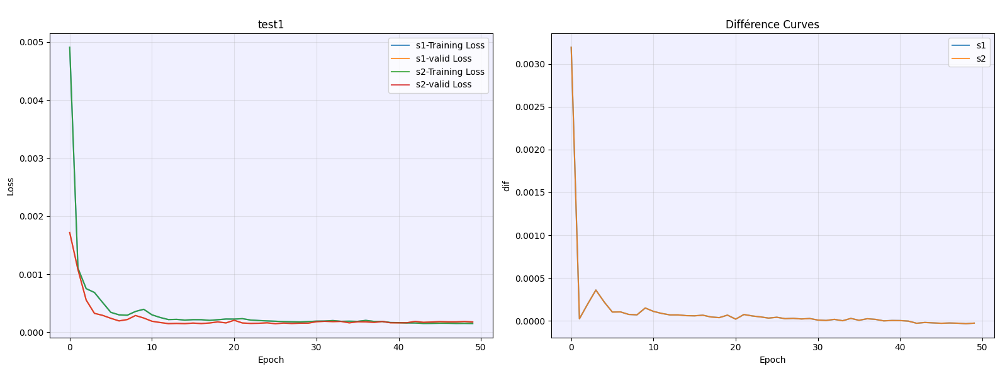

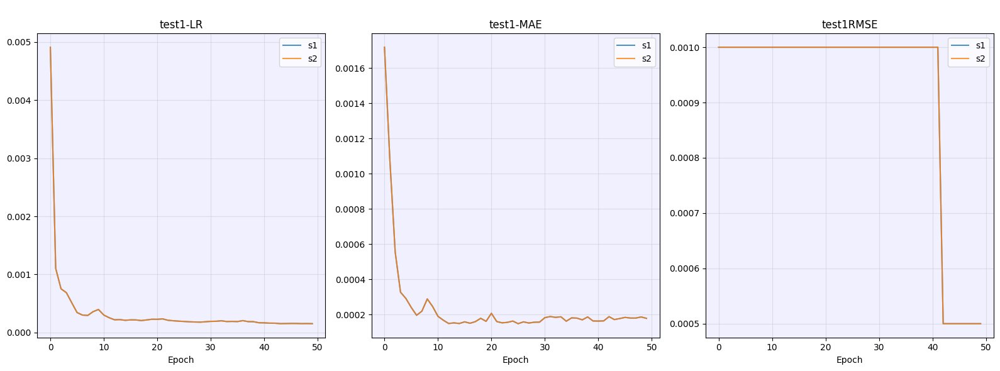

In [97]:
tt = PlotTestTrain("test1")
tt.addserie("s1",train_losses,val_losses)
tt.addserie("s2",train_losses,val_losses)
tt.save()

ts = PlotTestEval("test1")
ts.addserie("s1",train_losses,val_losses, val_lrs)
ts.addserie("s2",train_losses,val_losses, val_lrs)
ts.save()

In [ ]:
class ParamTest:
    def __init__(self):
        self.hidden_size:int = 128
        self.num_layers:int = 2
        self.dropout:float = 0.2
        self.learning_rate:float=0.001
        self.batch_size:int = 32
        self.sequence_length:int = 10
        self.weight_decay:float = 0.2

       
        
def test_model_params(params:ParamTest, model_type, X_train, y_train, X_val, y_val ,input_size, max_epochs, patience  ):
# Prepare data
    train_loader, X_scaled = prepare_data(
                    X_train, y_train, 
                    params.sequence_length, params.batch_size
                )
    val_loader, _  = prepare_data(
                    X_val, y_val, 
                    params.sequence_length, params.batch_size
                )
    
    # Initialize model
   
    if model_type == 'LSTM':
        model = LSTMModel(input_size, params.hidden_size,params.num_layers, params.dropout)
    elif model_type == 'GRU':
        model = GRUModel(input_size, params.hidden_size,params.num_layers, params.dropout)
    else:
        raise ValueError("Invalid model type. Choose 'LSTM' or 'GRU'.")
    
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=params.learning_rate)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=patience/2, factor=0.5)
    best_val_loss = float('inf')
    patience_counter = 0

    train_losses = []
    val_losses = []
    val_maes = []
    val_rmses = []
    val_lrs = []
    # Training loop
    for epoch in range(max_epochs):
       
        train_loss = train_epoch(model, train_loader, optimizer, criterion)
        train_losses.append(train_loss)
        # Validation
        if val_loader is not None:

            val_loss, val_mae, val_rmse = evaluate(model, val_loader,optimizer,criterion )
            
            val_losses.append(val_loss)
            val_maes.append(val_mae)
            val_rmses.append(val_rmse)
            current_lr = optimizer.param_groups[0]["lr"]
            val_lrs.append(current_lr)
            # Learning rate scheduling
            scheduler.step(val_loss)
            
            # Early stopping
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                patience_counter = 0
            else:
                patience_counter += 1
            
            # if patience_counter >= patience:
            #    print(f"Early stopping at epoch {epoch}")
            #     break
            
            
            if epoch % 2 == 0:
                print(
                    f"Epoch {epoch+1:02d} | "
                    f"LR: {current_lr:.1e} | "
                    f"Train Loss: {train_loss:.4f} | "
                    f"Val Loss: {val_loss:.4f} | "
                    f"MAE: {val_mae:.4f} | "
                    f"RMSE: {val_rmse:.4f}"
                )
                # print(f"Epoch {epoch}: Train Loss: {train_loss:.6f}, Val Loss: {val_loss:.6f}")
        else:
            if epoch % 2 == 0:
                print(f"Epoch {epoch}: Train Loss: {train_loss:.6f}")    

    return model, train_losses, val_losses, val_lrs, val_maes, val_rmses 
       
def test_model(name_target, model_type, X_train, y_train, X_val, y_val, 
                    input_size,max_epochs=50, patience=10):
    
    params_default = ParamTest()  
    params = ParamTest()
    # ----------------------------
    # Test des batchs_size
    # --------------------------
    plot_train = PlotTestTrain(f"{name_target}-batch_size", model_type)
    plot_evaling = PlotTestEval(f"{name_target}-batch_size", model_type)

    list_batch=[16, 32, 64, 128]  
    for size_batch in list_batch:
        params.batch_size = size_batch
        name = f"{name_target}: test batch_size{size_batch}"
        model, train_losses, val_losses, val_lrs, val_maes, val_rmses = test_model_params(params, model_type, X_train, y_train, X_val, y_val, 
                    input_size,max_epochs, patience)
        plot_train.addserie(f"{size_batch}",train_losses, val_losses)
        plot_evaling.addserie(f"{size_batch}",val_lrs, val_maes, val_rmses )
        
    plot_train.save()
    plot_evaling.save() 
    params.batch_size =  params_default.batch_size
    
    # ----------------------------
    # Test des num_layer
    # --------------------------
    plot_train = PlotTestTrain(f"{name_target}-num_layer", model_type)
    plot_evaling = PlotTestEval(f"{name_target}-num_layer", model_type)
    list_num_layers=[1, 2, 4, 8, 10]  
    for nb in list_num_layers:
        params.num_layers = nb
        name = f"{name_target}: test nb layer{nb}"
        model, train_losses, val_losses, val_lrs, val_maes, val_rmses = test_model_params(params, model_type, X_train, y_train, X_val, y_val, 
                    input_size,max_epochs, patience)
        plot_train.addserie(f"{nb}",train_losses, val_losses)
        plot_evaling.addserie(f"{nb}",val_lrs, val_maes, val_rmses )

    plot_train.save()
    plot_evaling.save()
    params.num_layers =  params_default.num_layers

    # ----------------------------
    # Test des hidden_size
    # --------------------------
    plot_train = PlotTestTrain(f"{name_target}-hidden_size", model_type)
    plot_evaling = PlotTestEval(f"{name_target}-hidden_size", model_type)
    list_hidden_size=[64, 128, 256, 512] 
    for nb in list_hidden_size:
        params.hidden_size = nb
        name = f"{name_target}: test hidden_size {nb}"
        model, train_losses, val_losses, val_lrs, val_maes, val_rmses = test_model_params(params, model_type, X_train, y_train, X_val, y_val, 
                    input_size,max_epochs, patience)
        plot_train.addserie(f"{nb}",train_losses, val_losses)
        plot_evaling.addserie(f"{nb}",val_lrs, val_maes, val_rmses )
    plot_train.save()
    plot_evaling.save()  
    params.hidden_size =  params_default.hidden_size
    # ----------------------------
    # Test des dropout
    # --------------------------
    plot_train = PlotTestTrain(f"{name_target}-dropout", model_type)
    plot_evaling = PlotTestEval(f"{name_target}-dropout", model_type)
    list_dropout = np.arange (0.1, 0.5, 0.1)
    for nb in list_dropout:
        params.dropout = nb
        name = f"{name_target}: test dropout {nb}"
        model, train_losses, val_losses, val_lrs, val_maes, val_rmses = test_model_params( params, model_type, X_train, y_train, X_val, y_val, 
                    input_size,max_epochs, patience)
        plot_train.addserie(f"{nb}",train_losses, val_losses)
        plot_evaling.addserie(f"{nb}",val_lrs, val_maes, val_rmses )

    plot_train.save()
    plot_evaling.save()
    params.dropout =  params_default.dropout
    # ----------------------------
    # Test des learning_rate
    # --------------------------
    list_learning_rate = [1e-4, 5e-3, 1e-3, 1e-2]
    plot_train = PlotTestTrain(f"{name_target}-learning_rate", model_type)
    plot_evaling = PlotTestEval(f"{name_target}-learning_rate", model_type)
    for nb in list_learning_rate:
        params.learning_rate = nb
        name = f"{name_target}: test learning_rate: {nb}"
        model, train_losses, val_losses, val_lrs, val_maes, val_rmses = test_model_params(params, model_type, X_train, y_train, X_val, y_val, 
                    input_size,max_epochs, patience)
        plot_train.addserie(f"{nb}",train_losses, val_losses)
        plot_evaling.addserie(f"{nb}",val_lrs, val_maes, val_rmses )

    plot_train.save()
    plot_evaling.save()
    params.learning_rate =  params_default.learning_rate
    # ----------------------------
    # Test des sequence_lengt
    # --------------------------
    list_sequence_length = np.arange (10, 30, 5)
    plot_train = PlotTestTrain(f"{name_target}-sequence_lengt", model_type)
    plot_evaling = PlotTestEval(f"{name_target}-sequence_lengt", model_type)
    for nb in list_sequence_length:
        params.sequence_length = nb
        name = f"{name_target}: test sequence_length: {nb}"
        model, train_losses, val_losses, val_lrs, val_maes, val_rmses = test_model_params(params, model_type, X_train, y_train, X_val, y_val, 
                    input_size,max_epochs, patience)
        plot_train.addserie(f"{nb}",train_losses, val_losses)
        plot_evaling.addserie(f"{nb}",val_lrs, val_maes, val_rmses )

    plot_train.save()
    plot_evaling.save()
    params.sequence_length =  params_default.sequence_length

            
def my_train_models_for_target(name,
                p_target_values,
                target_col1:str,
                target_col2:str,
                model_type:str='LSTM',
                num_epochs:int=50,
                patience:int=30):
    
    y = p_target_values
    mask = ~y.isna()
    X_all = train_features_build(target_col1,target_col2)
    
    X_valid = X_all.loc[mask]
    y_valid = y[mask]

    # Simple train/validation split (last 20% for validation)
    split_idx = int(len(X_valid) * 0.8)
    X_train = X_valid[:split_idx]
    y_train = y_valid[:split_idx]
    X_val = X_valid[split_idx:]
    y_val = y_valid[split_idx:]
    
    test_model(name, model_type, X_train, y_train.values, X_val, y_val.values,X_train.shape[1],num_epochs, patience)

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0293 | Val Loss: 0.0031 | MAE: 0.0450 | RMSE: 0.0551
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0042 | Val Loss: 0.0049 | MAE: 0.0571 | RMSE: 0.0705
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0018 | Val Loss: 0.0005 | MAE: 0.0172 | RMSE: 0.0228
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0012 | Val Loss: 0.0003 | MAE: 0.0131 | RMSE: 0.0176
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0008 | Val Loss: 0.0002 | MAE: 0.0100 | RMSE: 0.0135
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0004 | MAE: 0.0164 | RMSE: 0.0205
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0002 | MAE: 0.0094 | RMSE: 0.0128
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0002 | MAE: 0.0096 | RMSE: 0.0128
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0001 | MAE: 0.0084 | RMSE: 0.0117
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0001 | MAE: 0.0082 | RMSE: 0.0115
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0001 | MAE: 0.0082 | R

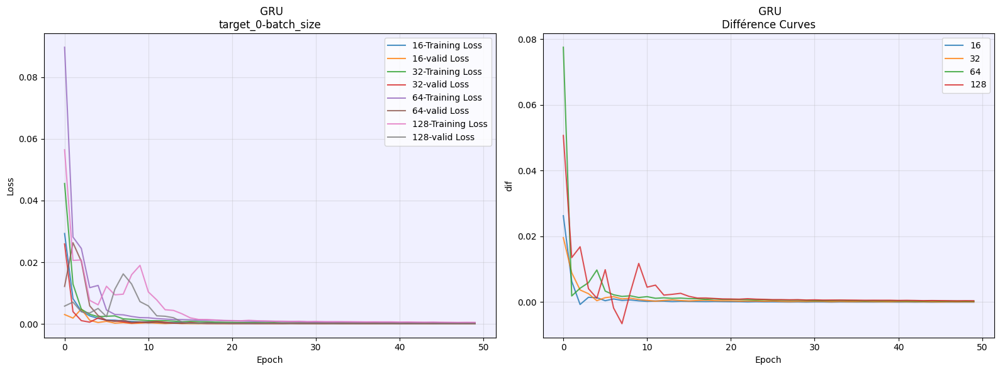

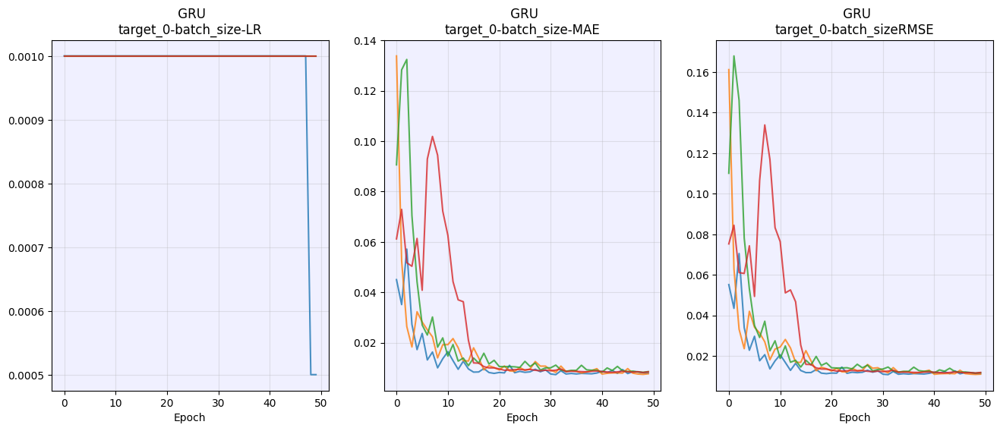

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.1877 | Val Loss: 0.2098 | MAE: 0.4045 | RMSE: 0.4581
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0705 | Val Loss: 0.0389 | MAE: 0.1530 | RMSE: 0.1956
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0338 | Val Loss: 0.0079 | MAE: 0.0745 | RMSE: 0.0894
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0183 | Val Loss: 0.0083 | MAE: 0.0766 | RMSE: 0.0918
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0227 | Val Loss: 0.0191 | MAE: 0.1061 | RMSE: 0.1385
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0103 | Val Loss: 0.0055 | MAE: 0.0627 | RMSE: 0.0748
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0111 | Val Loss: 0.0064 | MAE: 0.0619 | RMSE: 0.0810
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0066 | Val Loss: 0.0022 | MAE: 0.0377 | RMSE: 0.0474
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0042 | Val Loss: 0.0024 | MAE: 0.0394 | RMSE: 0.0493
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0037 | Val Loss: 0.0010 | MAE: 0.0252 | RMSE: 0.0319
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0023 | Val Loss: 0.0005 | MAE: 0.0169 | R

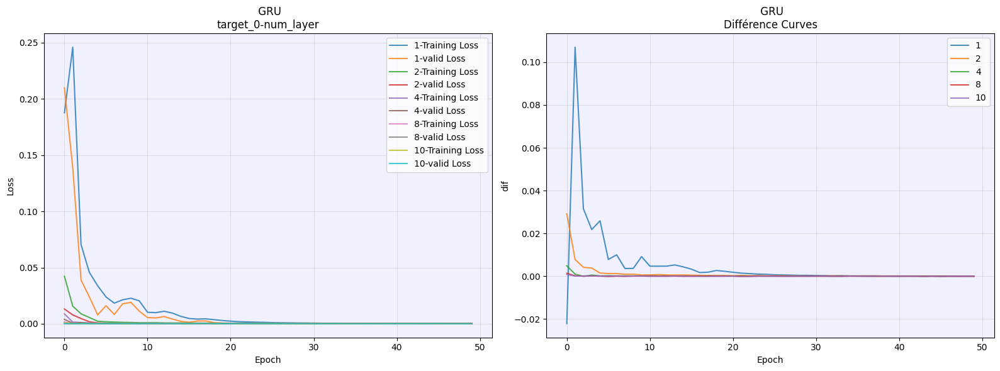

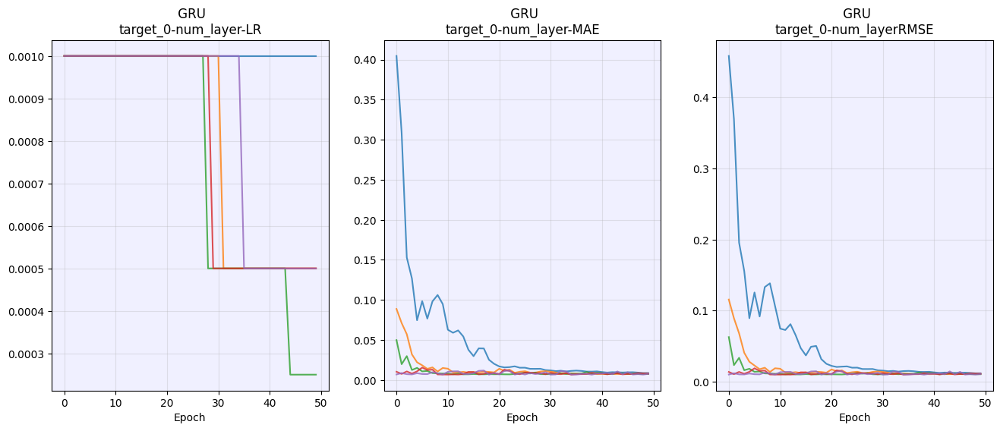

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0221 | Val Loss: 0.0200 | MAE: 0.1124 | RMSE: 0.1419
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0059 | Val Loss: 0.0021 | MAE: 0.0377 | RMSE: 0.0452
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0031 | Val Loss: 0.0018 | MAE: 0.0342 | RMSE: 0.0429
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0019 | Val Loss: 0.0005 | MAE: 0.0186 | RMSE: 0.0225
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0012 | Val Loss: 0.0004 | MAE: 0.0159 | RMSE: 0.0203
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0009 | Val Loss: 0.0002 | MAE: 0.0110 | RMSE: 0.0145
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0002 | MAE: 0.0123 | RMSE: 0.0160
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0002 | MAE: 0.0108 | RMSE: 0.0145
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0002 | MAE: 0.0089 | RMSE: 0.0123
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0002 | MAE: 0.0099 | RMSE: 0.0133
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0001 | MAE: 0.0085 | R

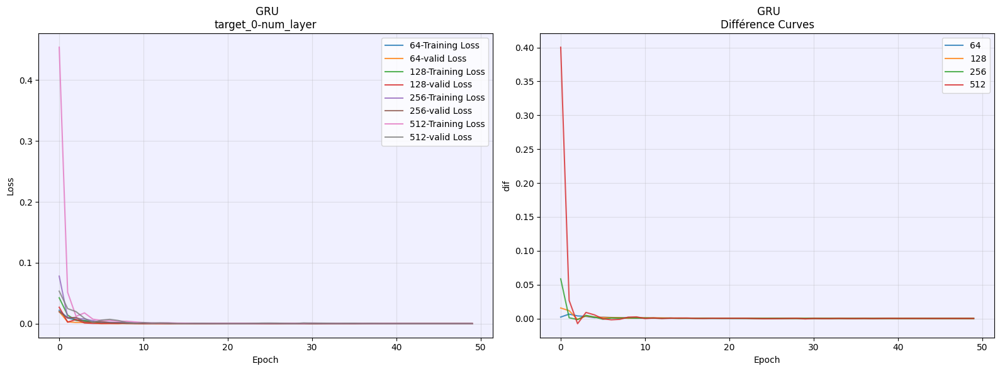

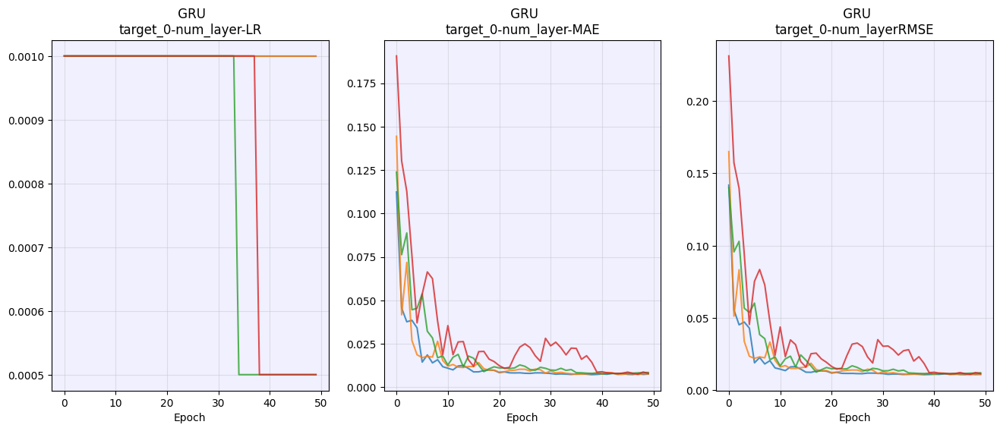

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0469 | Val Loss: 0.0167 | MAE: 0.1108 | RMSE: 0.1304
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0046 | Val Loss: 0.0041 | MAE: 0.0508 | RMSE: 0.0625
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0025 | Val Loss: 0.0020 | MAE: 0.0361 | RMSE: 0.0455
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0024 | Val Loss: 0.0017 | MAE: 0.0321 | RMSE: 0.0395
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0015 | Val Loss: 0.0008 | MAE: 0.0223 | RMSE: 0.0284
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0010 | Val Loss: 0.0003 | MAE: 0.0138 | RMSE: 0.0179
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0003 | MAE: 0.0126 | RMSE: 0.0164
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0003 | MAE: 0.0137 | RMSE: 0.0181
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0008 | Val Loss: 0.0009 | MAE: 0.0206 | RMSE: 0.0301
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0003 | MAE: 0.0122 | RMSE: 0.0160
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0003 | MAE: 0.0127 | R

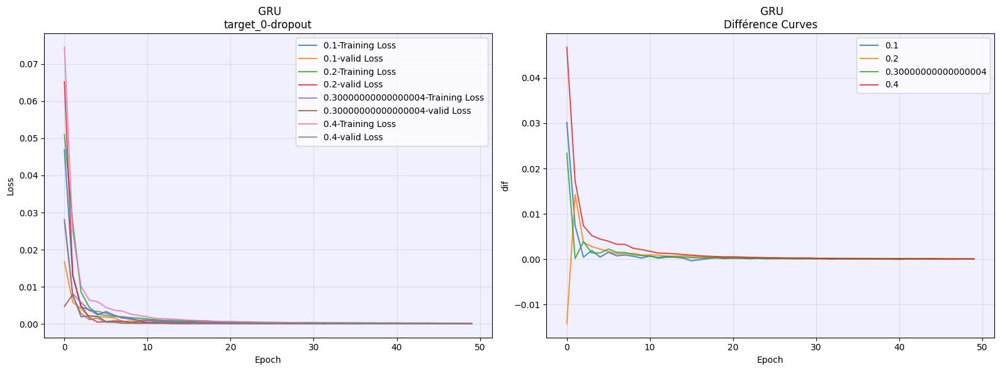

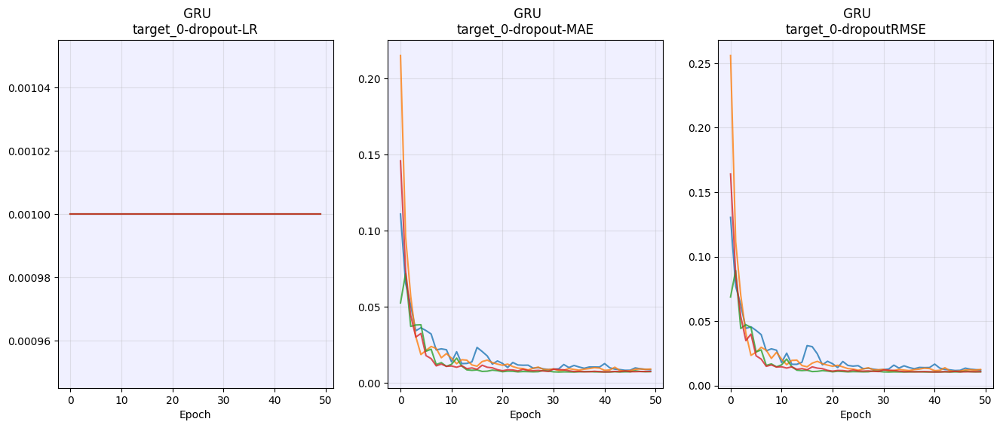

Epoch 01 | LR: 1.0e-04 | Train Loss: 0.0258 | Val Loss: 0.0053 | MAE: 0.0618 | RMSE: 0.0740
Epoch 03 | LR: 1.0e-04 | Train Loss: 0.0168 | Val Loss: 0.0165 | MAE: 0.1053 | RMSE: 0.1275
Epoch 05 | LR: 1.0e-04 | Train Loss: 0.0093 | Val Loss: 0.0042 | MAE: 0.0534 | RMSE: 0.0644
Epoch 07 | LR: 1.0e-04 | Train Loss: 0.0056 | Val Loss: 0.0022 | MAE: 0.0374 | RMSE: 0.0472
Epoch 09 | LR: 1.0e-04 | Train Loss: 0.0065 | Val Loss: 0.0068 | MAE: 0.0575 | RMSE: 0.0831
Epoch 11 | LR: 1.0e-04 | Train Loss: 0.0054 | Val Loss: 0.0033 | MAE: 0.0421 | RMSE: 0.0575
Epoch 13 | LR: 1.0e-04 | Train Loss: 0.0036 | Val Loss: 0.0013 | MAE: 0.0269 | RMSE: 0.0352
Epoch 15 | LR: 1.0e-04 | Train Loss: 0.0033 | Val Loss: 0.0010 | MAE: 0.0243 | RMSE: 0.0302
Epoch 17 | LR: 1.0e-04 | Train Loss: 0.0026 | Val Loss: 0.0009 | MAE: 0.0217 | RMSE: 0.0295
Epoch 19 | LR: 1.0e-04 | Train Loss: 0.0025 | Val Loss: 0.0011 | MAE: 0.0252 | RMSE: 0.0332
Epoch 21 | LR: 1.0e-04 | Train Loss: 0.0020 | Val Loss: 0.0006 | MAE: 0.0187 | R

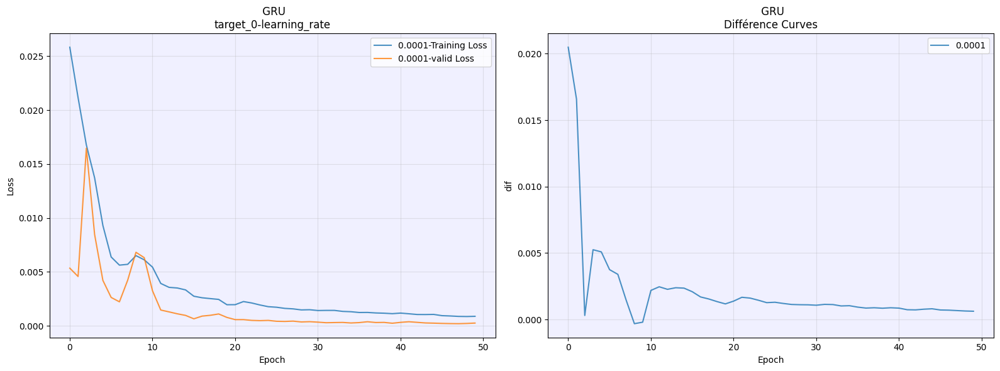

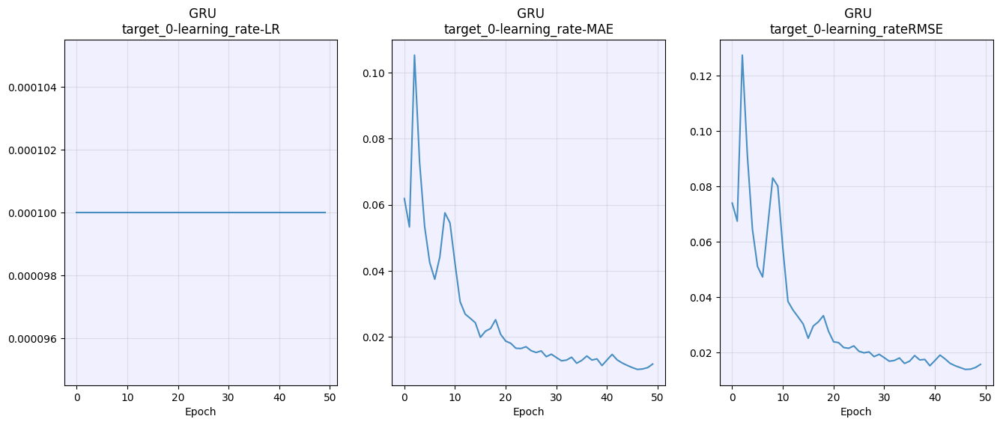

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0372 | Val Loss: 0.0364 | MAE: 0.1736 | RMSE: 0.1906
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0090 | Val Loss: 0.0076 | MAE: 0.0767 | RMSE: 0.0865
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0030 | Val Loss: 0.0010 | MAE: 0.0252 | RMSE: 0.0323
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0016 | Val Loss: 0.0009 | MAE: 0.0220 | RMSE: 0.0285
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0012 | Val Loss: 0.0003 | MAE: 0.0130 | RMSE: 0.0169
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0010 | Val Loss: 0.0003 | MAE: 0.0128 | RMSE: 0.0166
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0008 | Val Loss: 0.0002 | MAE: 0.0097 | RMSE: 0.0130
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0008 | Val Loss: 0.0002 | MAE: 0.0110 | RMSE: 0.0144
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0002 | MAE: 0.0101 | RMSE: 0.0137
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0002 | MAE: 0.0100 | RMSE: 0.0135
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0002 | MAE: 0.0098 | R

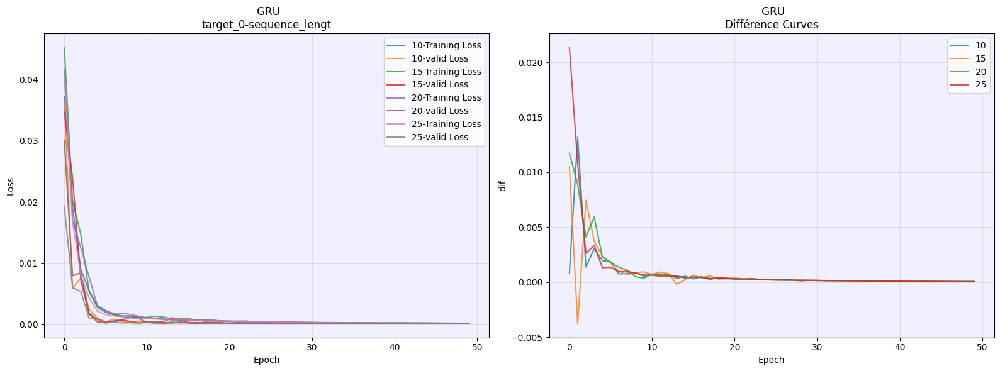

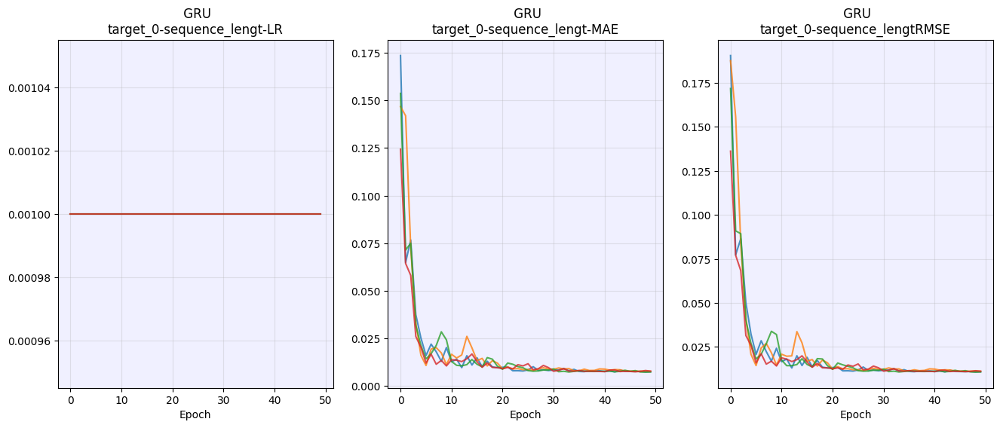

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0041 | Val Loss: 0.0011 | MAE: 0.0242 | RMSE: 0.0340
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0121 | RMSE: 0.0154
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0001 | MAE: 0.0081 | RMSE: 0.0114
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0100 | RMSE: 0.0136
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0001 | MAE: 0.0084 | RMSE: 0.0119
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0099 | RMSE: 0.0132
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0102 | RMSE: 0.0136
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0001 | MAE: 0.0079 | RMSE: 0.0113
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0089 | RMSE: 0.0122
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0001 | MAE: 0.0081 | RMSE: 0.0115
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0001 | Val Loss: 0.0002 | MAE: 0.0105 | R

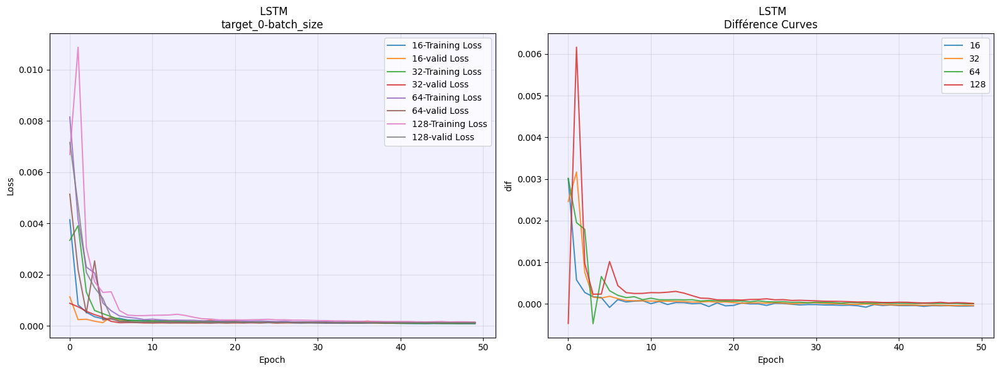

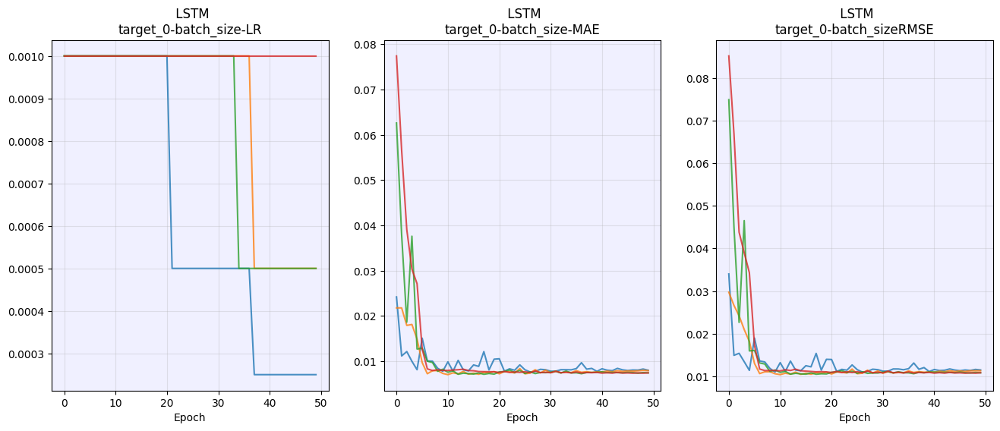

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0315 | Val Loss: 0.0245 | MAE: 0.1064 | RMSE: 0.1533
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0171 | Val Loss: 0.0097 | MAE: 0.0739 | RMSE: 0.0987
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0066 | Val Loss: 0.0058 | MAE: 0.0653 | RMSE: 0.0768
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0018 | Val Loss: 0.0006 | MAE: 0.0184 | RMSE: 0.0238
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0012 | Val Loss: 0.0008 | MAE: 0.0236 | RMSE: 0.0293
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0004 | MAE: 0.0156 | RMSE: 0.0208
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0004 | MAE: 0.0162 | RMSE: 0.0211
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0005 | MAE: 0.0166 | RMSE: 0.0216
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0004 | MAE: 0.0161 | RMSE: 0.0205
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0129 | RMSE: 0.0172
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0005 | MAE: 0.0164 | R

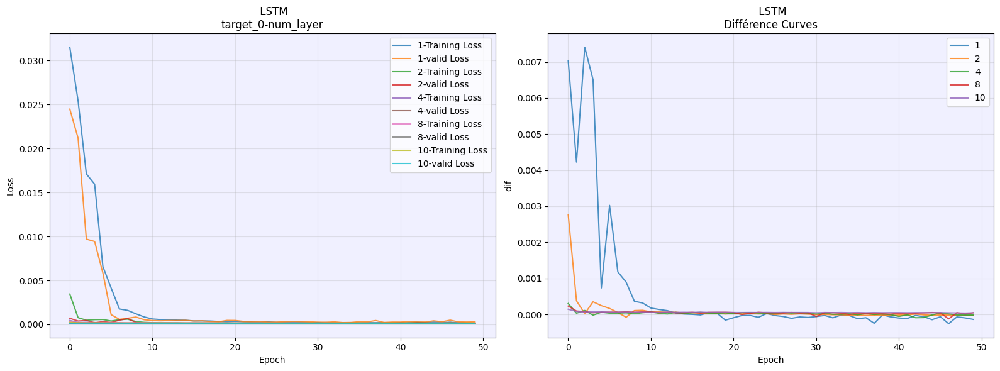

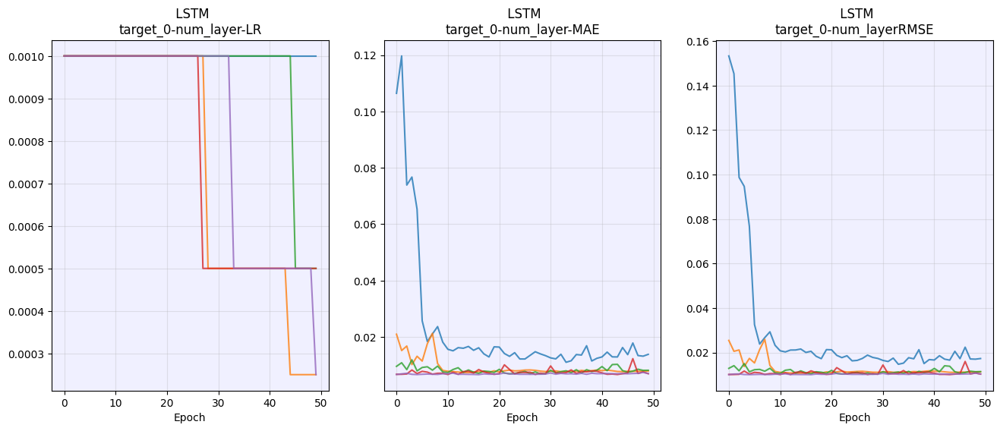

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0026 | Val Loss: 0.0005 | MAE: 0.0153 | RMSE: 0.0216
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0002 | MAE: 0.0097 | RMSE: 0.0134
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0002 | MAE: 0.0111 | RMSE: 0.0143
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0003 | MAE: 0.0140 | RMSE: 0.0173
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0151 | RMSE: 0.0186
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0097 | RMSE: 0.0129
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0105 | RMSE: 0.0136
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0098 | RMSE: 0.0130
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0001 | MAE: 0.0085 | RMSE: 0.0119
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0001 | MAE: 0.0076 | RMSE: 0.0110
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0001 | MAE: 0.0074 | R

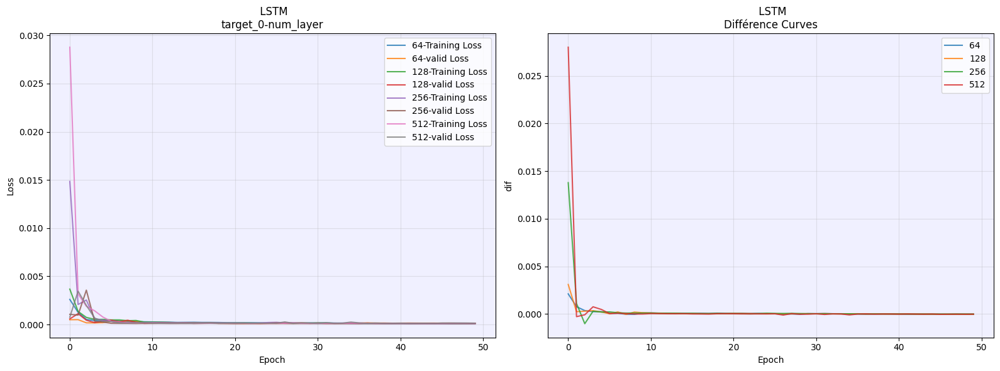

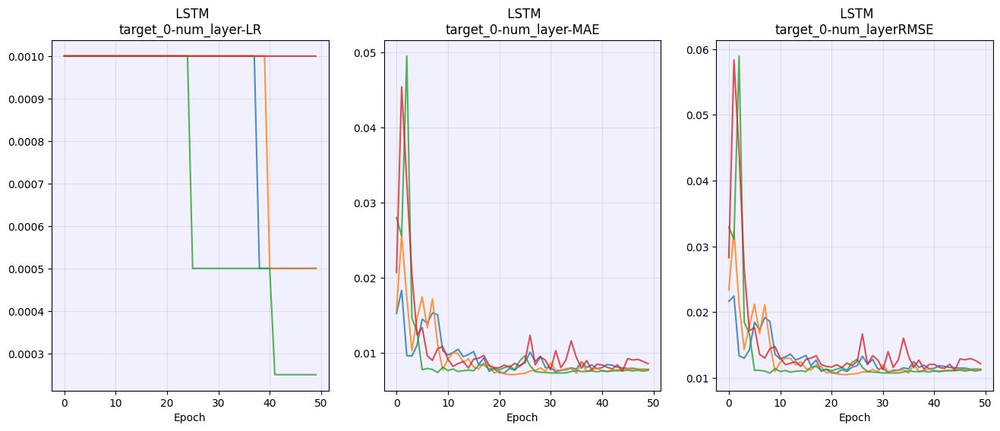

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0024 | Val Loss: 0.0011 | MAE: 0.0271 | RMSE: 0.0330
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0006 | MAE: 0.0221 | RMSE: 0.0256
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0010 | Val Loss: 0.0005 | MAE: 0.0186 | RMSE: 0.0229
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0001 | MAE: 0.0089 | RMSE: 0.0126
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0001 | MAE: 0.0080 | RMSE: 0.0114
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0001 | MAE: 0.0072 | RMSE: 0.0106
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0001 | Val Loss: 0.0001 | MAE: 0.0073 | RMSE: 0.0107
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0001 | Val Loss: 0.0001 | MAE: 0.0076 | RMSE: 0.0110
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0001 | Val Loss: 0.0001 | MAE: 0.0079 | RMSE: 0.0112
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0001 | Val Loss: 0.0001 | MAE: 0.0085 | RMSE: 0.0117
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0001 | Val Loss: 0.0002 | MAE: 0.0092 | R

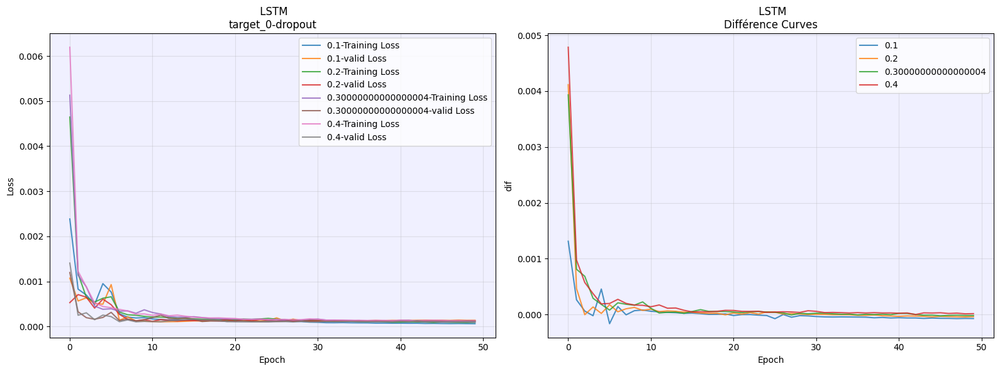

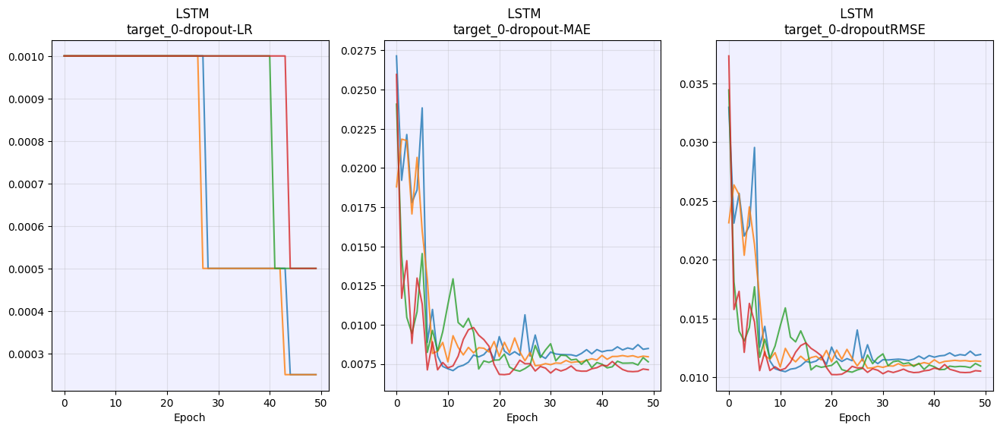

Epoch 01 | LR: 1.0e-04 | Train Loss: 0.0015 | Val Loss: 0.0006 | MAE: 0.0198 | RMSE: 0.0256
Epoch 03 | LR: 1.0e-04 | Train Loss: 0.0011 | Val Loss: 0.0006 | MAE: 0.0200 | RMSE: 0.0247
Epoch 05 | LR: 1.0e-04 | Train Loss: 0.0010 | Val Loss: 0.0005 | MAE: 0.0164 | RMSE: 0.0219
Epoch 07 | LR: 1.0e-04 | Train Loss: 0.0006 | Val Loss: 0.0002 | MAE: 0.0113 | RMSE: 0.0147
Epoch 09 | LR: 1.0e-04 | Train Loss: 0.0004 | Val Loss: 0.0002 | MAE: 0.0089 | RMSE: 0.0122
Epoch 11 | LR: 1.0e-04 | Train Loss: 0.0004 | Val Loss: 0.0002 | MAE: 0.0093 | RMSE: 0.0126
Epoch 13 | LR: 1.0e-04 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0085 | RMSE: 0.0119
Epoch 15 | LR: 1.0e-04 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0082 | RMSE: 0.0116
Epoch 17 | LR: 1.0e-04 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0084 | RMSE: 0.0119
Epoch 19 | LR: 1.0e-04 | Train Loss: 0.0003 | Val Loss: 0.0001 | MAE: 0.0082 | RMSE: 0.0115
Epoch 21 | LR: 1.0e-04 | Train Loss: 0.0003 | Val Loss: 0.0001 | MAE: 0.0080 | R

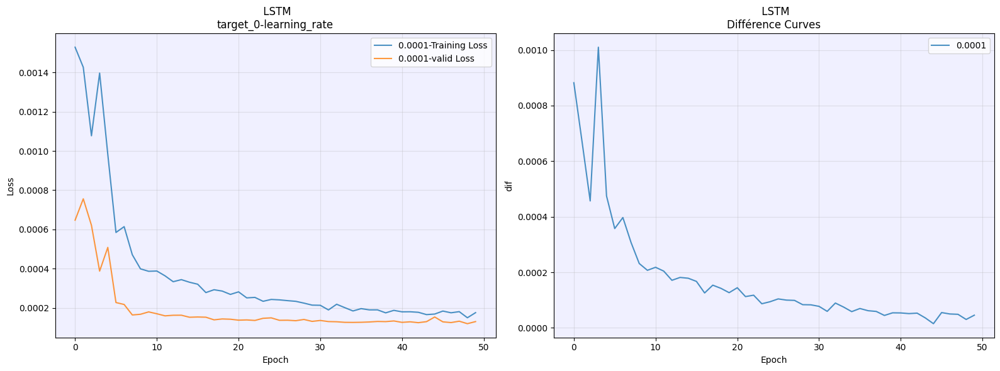

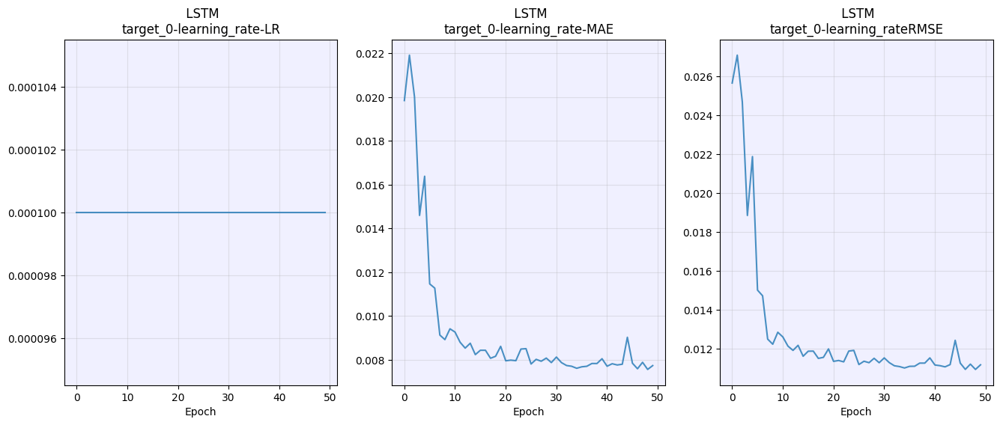

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0055 | Val Loss: 0.0006 | MAE: 0.0195 | RMSE: 0.0243
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0015 | Val Loss: 0.0007 | MAE: 0.0200 | RMSE: 0.0254
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0001 | MAE: 0.0091 | RMSE: 0.0123
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0100 | RMSE: 0.0134
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0107 | RMSE: 0.0141
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0001 | MAE: 0.0085 | RMSE: 0.0119
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0001 | MAE: 0.0086 | RMSE: 0.0120
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0001 | MAE: 0.0076 | RMSE: 0.0109
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0001 | MAE: 0.0074 | RMSE: 0.0108
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0001 | MAE: 0.0092 | RMSE: 0.0125
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0001 | MAE: 0.0087 | R

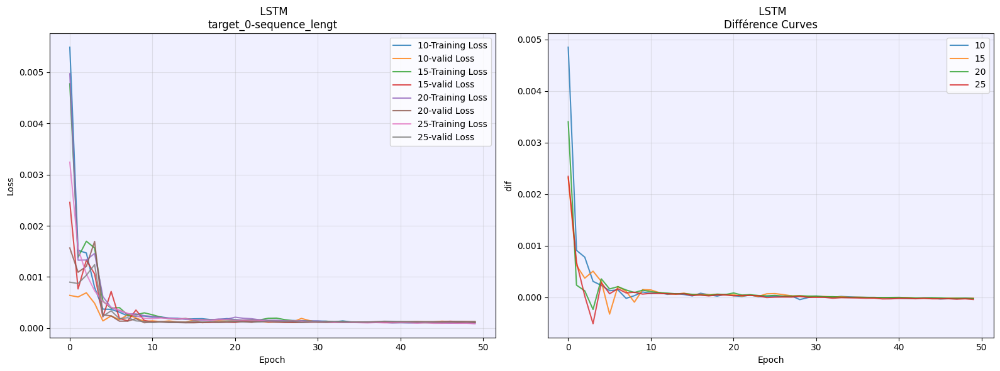

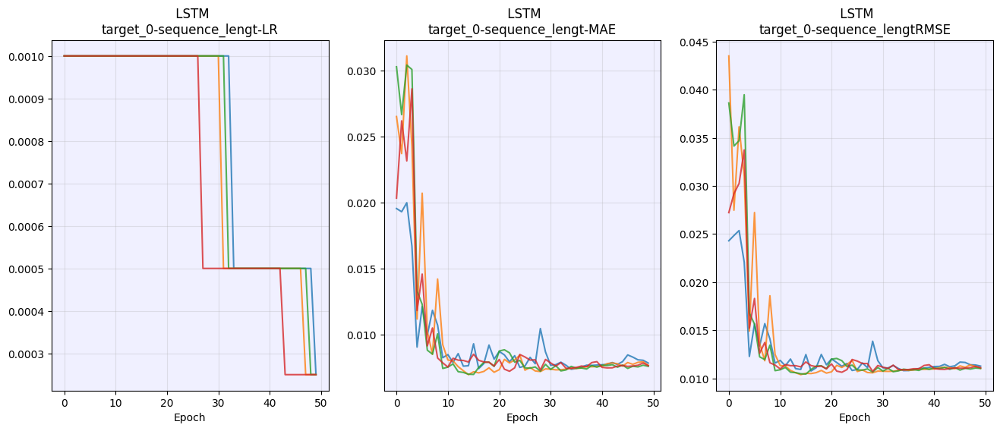

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0380 | Val Loss: 0.0066 | MAE: 0.0682 | RMSE: 0.0804
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0040 | Val Loss: 0.0023 | MAE: 0.0368 | RMSE: 0.0473
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0023 | Val Loss: 0.0009 | MAE: 0.0225 | RMSE: 0.0288
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0020 | Val Loss: 0.0025 | MAE: 0.0424 | RMSE: 0.0507
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0014 | Val Loss: 0.0004 | MAE: 0.0158 | RMSE: 0.0201
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0009 | Val Loss: 0.0004 | MAE: 0.0157 | RMSE: 0.0206
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0004 | MAE: 0.0151 | RMSE: 0.0193
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0004 | MAE: 0.0153 | RMSE: 0.0192
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0003 | MAE: 0.0128 | RMSE: 0.0168
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0003 | MAE: 0.0123 | RMSE: 0.0161
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0003 | MAE: 0.0123 | R

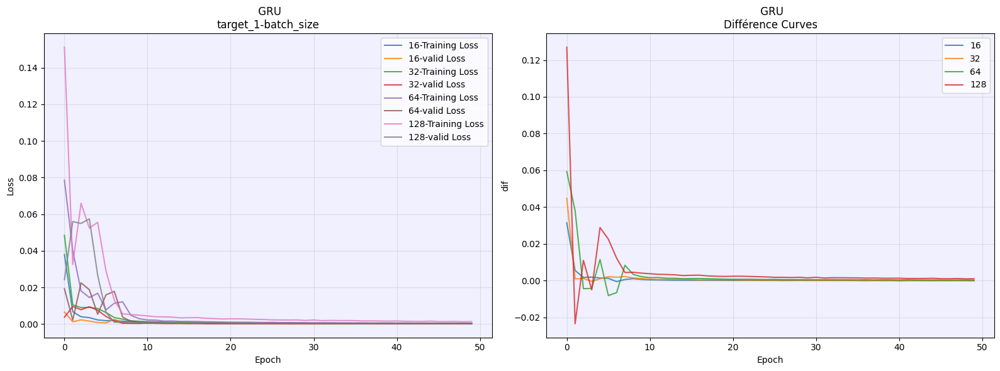

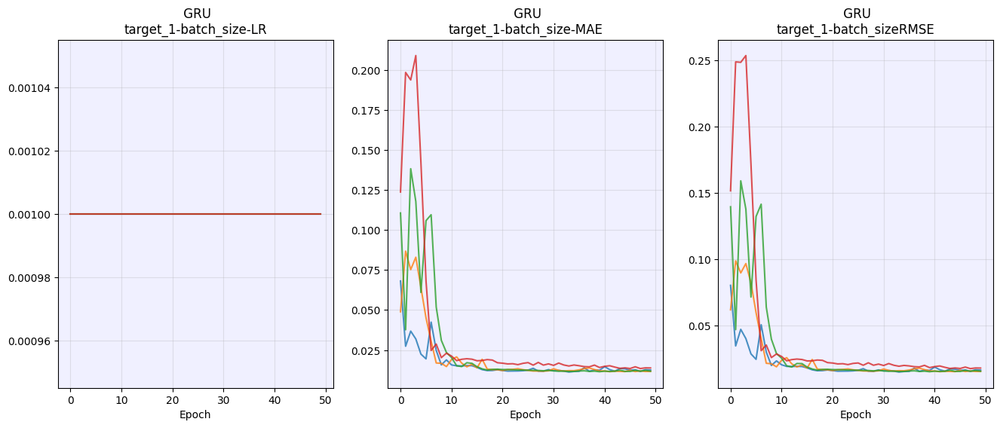

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.1320 | Val Loss: 0.2116 | MAE: 0.3977 | RMSE: 0.4633
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.1364 | Val Loss: 0.1782 | MAE: 0.3500 | RMSE: 0.4234
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0244 | Val Loss: 0.0068 | MAE: 0.0635 | RMSE: 0.0805
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0087 | Val Loss: 0.0061 | MAE: 0.0646 | RMSE: 0.0795
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0041 | Val Loss: 0.0039 | MAE: 0.0504 | RMSE: 0.0630
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0030 | Val Loss: 0.0015 | MAE: 0.0305 | RMSE: 0.0388
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0021 | Val Loss: 0.0008 | MAE: 0.0228 | RMSE: 0.0290
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0014 | Val Loss: 0.0007 | MAE: 0.0219 | RMSE: 0.0278
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0011 | Val Loss: 0.0006 | MAE: 0.0196 | RMSE: 0.0251
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0010 | Val Loss: 0.0007 | MAE: 0.0207 | RMSE: 0.0264
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0008 | Val Loss: 0.0004 | MAE: 0.0164 | R

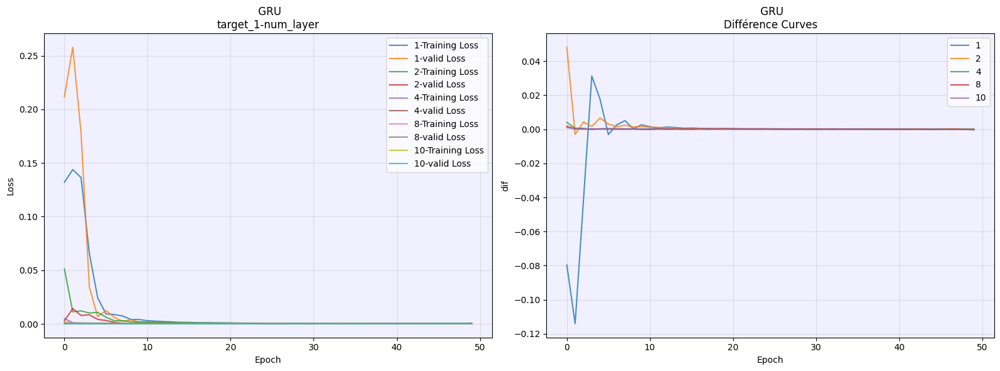

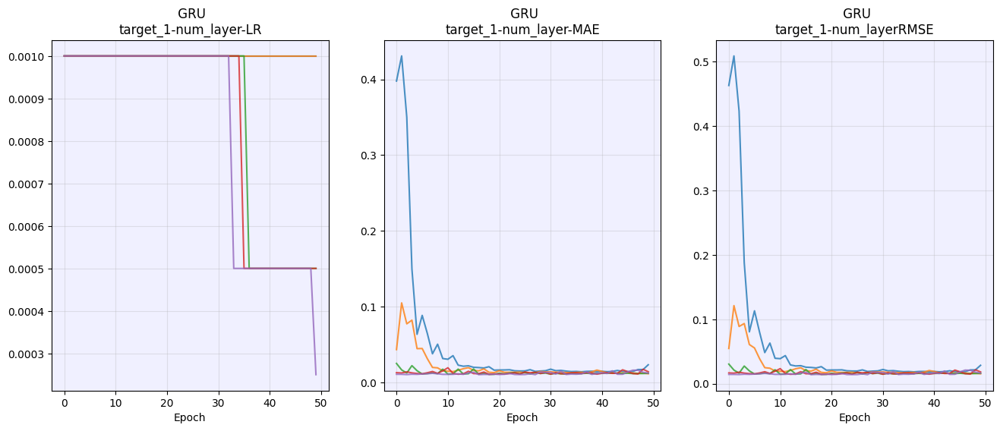

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0259 | Val Loss: 0.0081 | MAE: 0.0765 | RMSE: 0.0885
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0048 | Val Loss: 0.0009 | MAE: 0.0238 | RMSE: 0.0302
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0043 | Val Loss: 0.0017 | MAE: 0.0286 | RMSE: 0.0377
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0019 | Val Loss: 0.0005 | MAE: 0.0176 | RMSE: 0.0223
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0015 | Val Loss: 0.0004 | MAE: 0.0165 | RMSE: 0.0211
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0013 | Val Loss: 0.0004 | MAE: 0.0149 | RMSE: 0.0193
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0010 | Val Loss: 0.0003 | MAE: 0.0136 | RMSE: 0.0177
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0009 | Val Loss: 0.0006 | MAE: 0.0202 | RMSE: 0.0246
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0009 | Val Loss: 0.0003 | MAE: 0.0139 | RMSE: 0.0182
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0003 | MAE: 0.0127 | RMSE: 0.0167
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0003 | MAE: 0.0124 | R

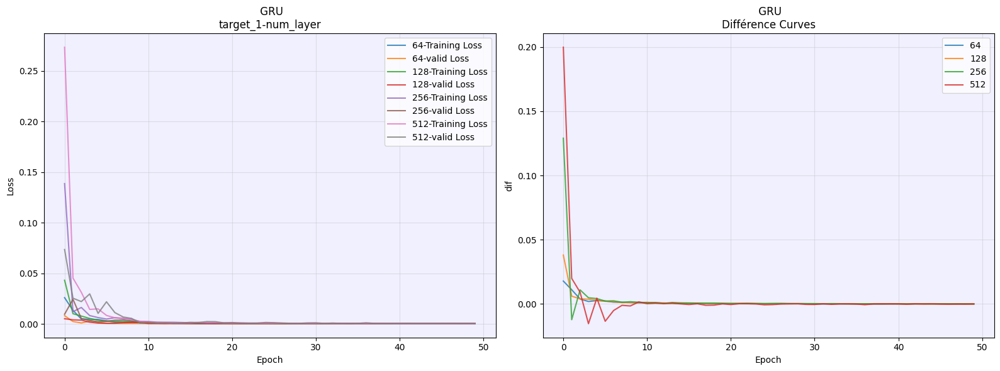

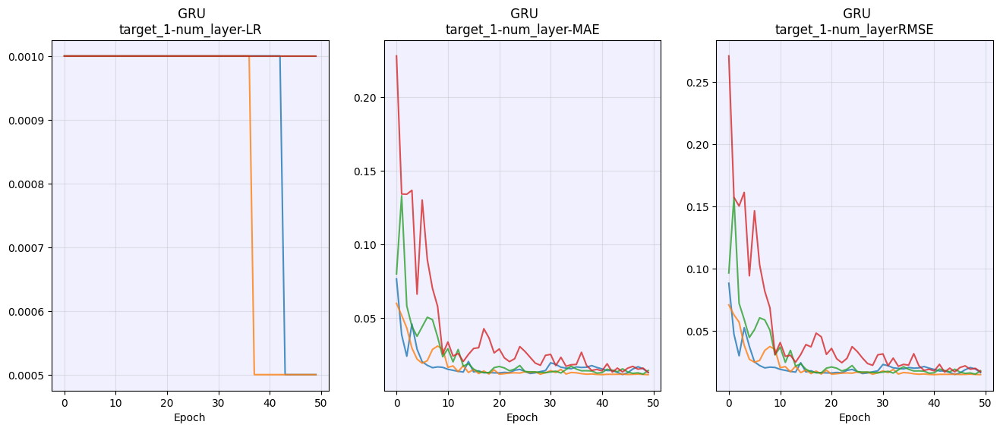

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0450 | Val Loss: 0.0026 | MAE: 0.0431 | RMSE: 0.0522
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0035 | Val Loss: 0.0071 | MAE: 0.0712 | RMSE: 0.0850
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0046 | Val Loss: 0.0056 | MAE: 0.0623 | RMSE: 0.0759
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0030 | Val Loss: 0.0032 | MAE: 0.0470 | RMSE: 0.0581
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0031 | Val Loss: 0.0032 | MAE: 0.0474 | RMSE: 0.0558
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0023 | Val Loss: 0.0021 | MAE: 0.0321 | RMSE: 0.0429
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0010 | Val Loss: 0.0006 | MAE: 0.0177 | RMSE: 0.0227
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0008 | Val Loss: 0.0004 | MAE: 0.0170 | RMSE: 0.0219
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0003 | MAE: 0.0146 | RMSE: 0.0188
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0004 | MAE: 0.0153 | RMSE: 0.0196
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0126 | R

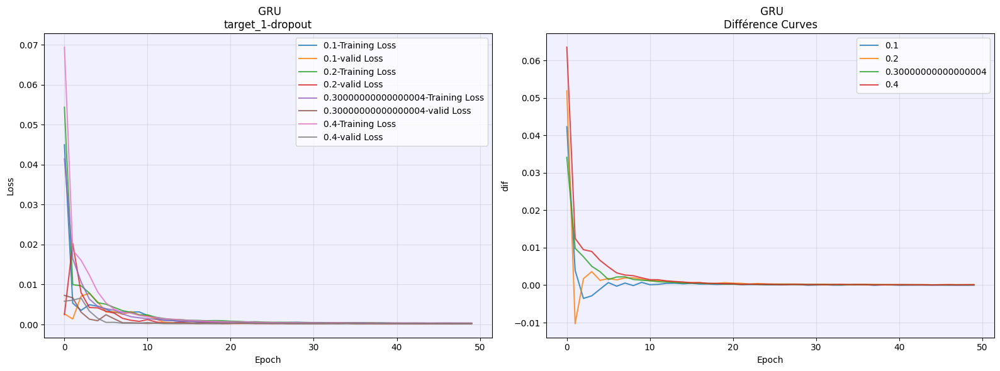

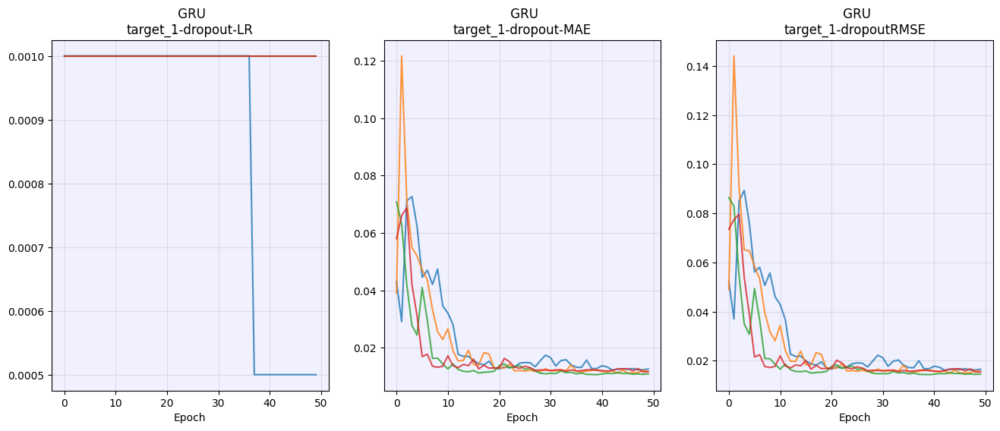

Epoch 01 | LR: 1.0e-04 | Train Loss: 0.0151 | Val Loss: 0.0062 | MAE: 0.0589 | RMSE: 0.0760
Epoch 03 | LR: 1.0e-04 | Train Loss: 0.0113 | Val Loss: 0.0221 | MAE: 0.1320 | RMSE: 0.1486
Epoch 05 | LR: 1.0e-04 | Train Loss: 0.0103 | Val Loss: 0.0019 | MAE: 0.0347 | RMSE: 0.0436
Epoch 07 | LR: 1.0e-04 | Train Loss: 0.0045 | Val Loss: 0.0012 | MAE: 0.0276 | RMSE: 0.0349
Epoch 09 | LR: 1.0e-04 | Train Loss: 0.0037 | Val Loss: 0.0008 | MAE: 0.0233 | RMSE: 0.0297
Epoch 11 | LR: 1.0e-04 | Train Loss: 0.0034 | Val Loss: 0.0008 | MAE: 0.0230 | RMSE: 0.0292
Epoch 13 | LR: 1.0e-04 | Train Loss: 0.0031 | Val Loss: 0.0007 | MAE: 0.0221 | RMSE: 0.0280
Epoch 15 | LR: 1.0e-04 | Train Loss: 0.0026 | Val Loss: 0.0006 | MAE: 0.0205 | RMSE: 0.0262
Epoch 17 | LR: 1.0e-04 | Train Loss: 0.0027 | Val Loss: 0.0007 | MAE: 0.0223 | RMSE: 0.0277
Epoch 19 | LR: 1.0e-04 | Train Loss: 0.0023 | Val Loss: 0.0006 | MAE: 0.0191 | RMSE: 0.0249
Epoch 21 | LR: 1.0e-04 | Train Loss: 0.0023 | Val Loss: 0.0008 | MAE: 0.0229 | R

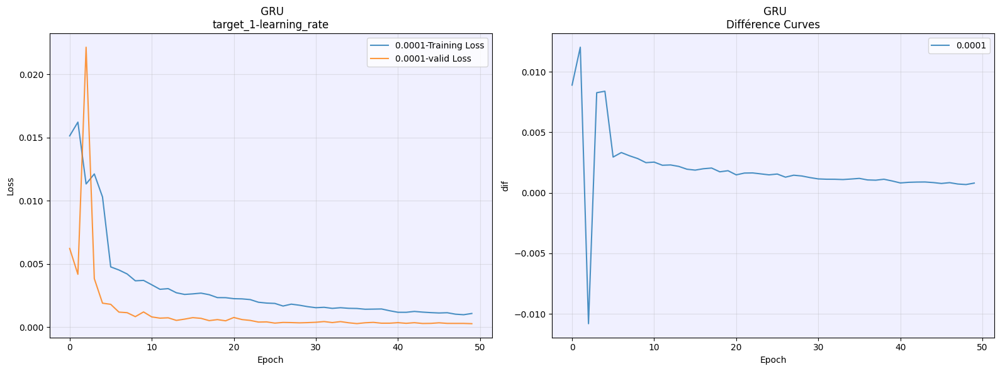

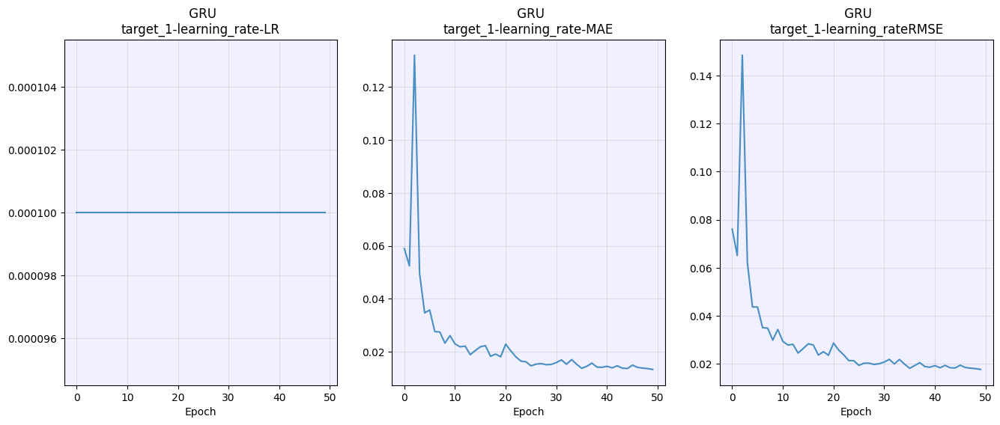

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0548 | Val Loss: 0.0080 | MAE: 0.0715 | RMSE: 0.0887
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0071 | Val Loss: 0.0169 | MAE: 0.1086 | RMSE: 0.1317
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0092 | Val Loss: 0.0087 | MAE: 0.0782 | RMSE: 0.0914
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0069 | Val Loss: 0.0057 | MAE: 0.0500 | RMSE: 0.0693
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0025 | Val Loss: 0.0007 | MAE: 0.0189 | RMSE: 0.0243
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0016 | Val Loss: 0.0005 | MAE: 0.0175 | RMSE: 0.0220
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0014 | Val Loss: 0.0007 | MAE: 0.0194 | RMSE: 0.0248
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0013 | Val Loss: 0.0006 | MAE: 0.0202 | RMSE: 0.0255
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0010 | Val Loss: 0.0005 | MAE: 0.0187 | RMSE: 0.0233
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0010 | Val Loss: 0.0003 | MAE: 0.0140 | RMSE: 0.0182
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0004 | MAE: 0.0144 | R

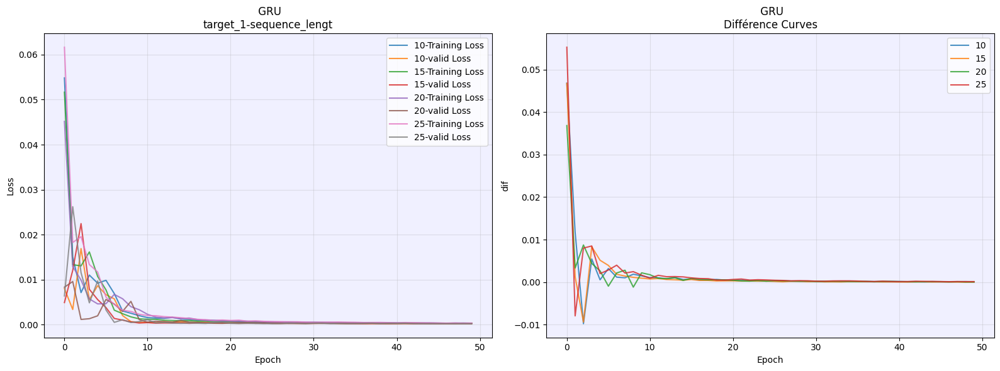

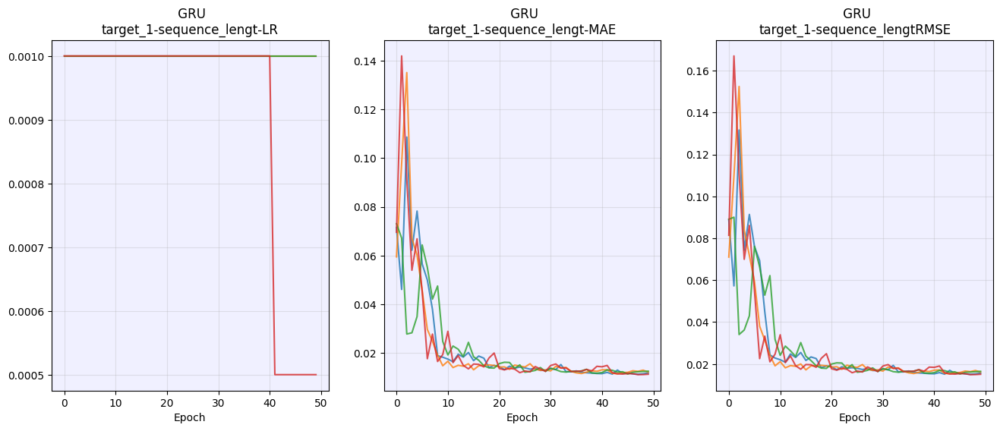

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0021 | Val Loss: 0.0005 | MAE: 0.0181 | RMSE: 0.0229
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0144 | RMSE: 0.0184
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0004 | MAE: 0.0152 | RMSE: 0.0193
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0003 | MAE: 0.0124 | RMSE: 0.0163
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0129 | RMSE: 0.0170
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0123 | RMSE: 0.0164
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0128 | RMSE: 0.0168
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0123 | RMSE: 0.0163
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0137 | RMSE: 0.0179
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0133 | RMSE: 0.0174
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0132 | R

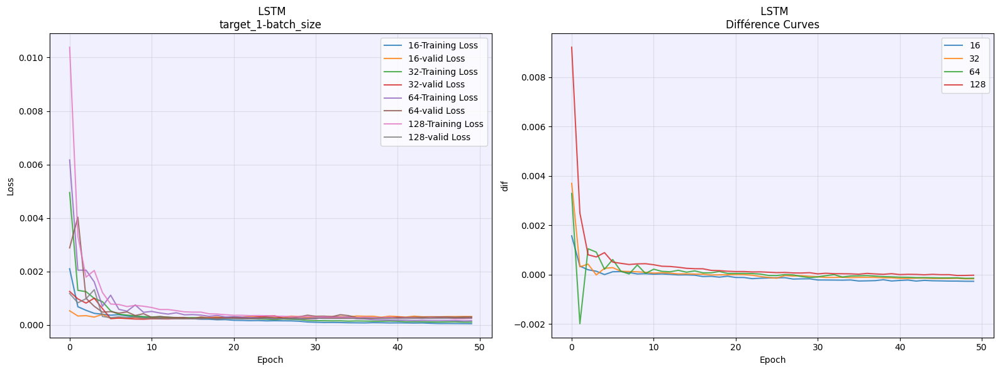

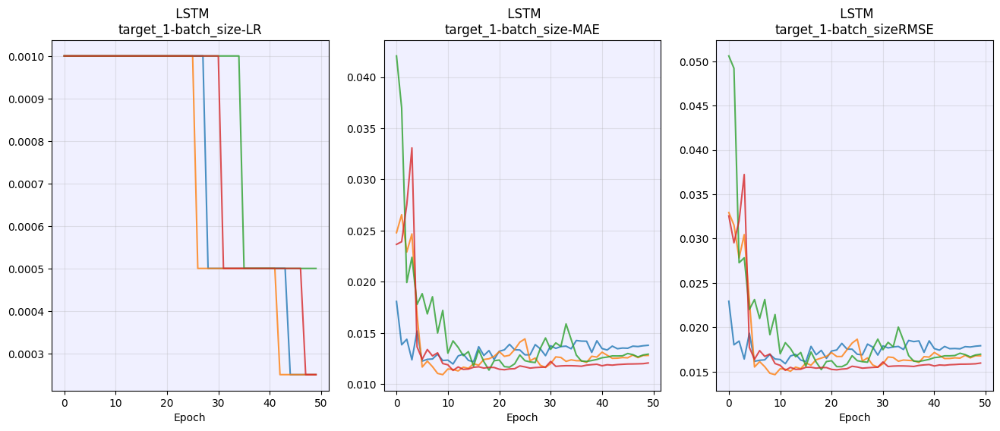

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0578 | Val Loss: 0.0276 | MAE: 0.1395 | RMSE: 0.1676
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0282 | Val Loss: 0.0194 | MAE: 0.1095 | RMSE: 0.1402
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0125 | Val Loss: 0.0076 | MAE: 0.0630 | RMSE: 0.0870
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0043 | Val Loss: 0.0026 | MAE: 0.0417 | RMSE: 0.0513
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0020 | Val Loss: 0.0010 | MAE: 0.0258 | RMSE: 0.0326
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0015 | Val Loss: 0.0009 | MAE: 0.0235 | RMSE: 0.0302
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0011 | Val Loss: 0.0008 | MAE: 0.0225 | RMSE: 0.0291
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0009 | Val Loss: 0.0008 | MAE: 0.0215 | RMSE: 0.0277
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0007 | MAE: 0.0212 | RMSE: 0.0273
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0006 | MAE: 0.0183 | RMSE: 0.0237
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0006 | MAE: 0.0192 | R

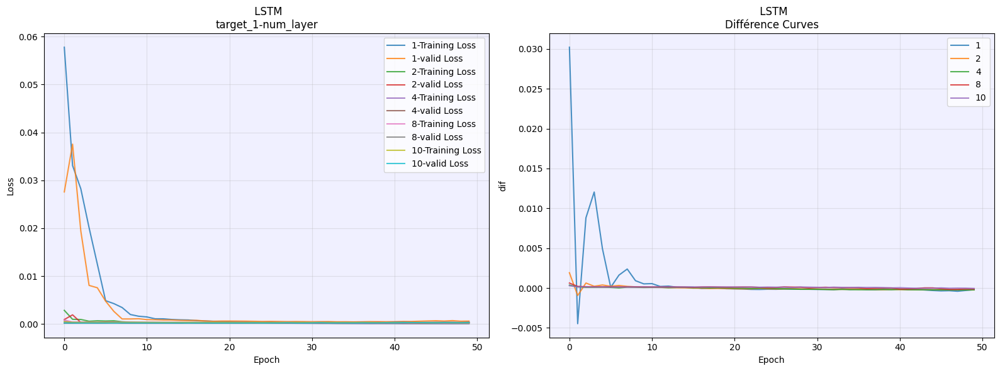

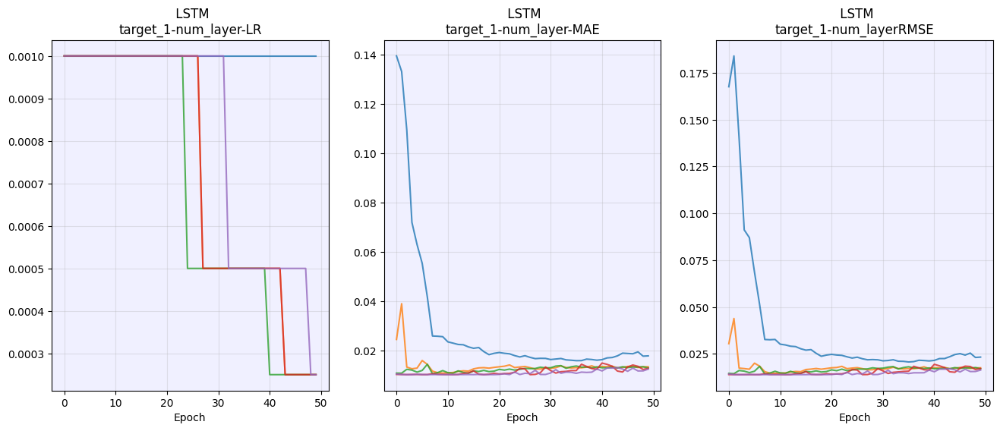

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0016 | Val Loss: 0.0007 | MAE: 0.0187 | RMSE: 0.0251
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0003 | MAE: 0.0136 | RMSE: 0.0180
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0002 | MAE: 0.0111 | RMSE: 0.0149
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0002 | MAE: 0.0108 | RMSE: 0.0145
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0111 | RMSE: 0.0149
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0119 | RMSE: 0.0158
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0112 | RMSE: 0.0150
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0121 | RMSE: 0.0159
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0117 | RMSE: 0.0155
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0120 | RMSE: 0.0160
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0123 | R

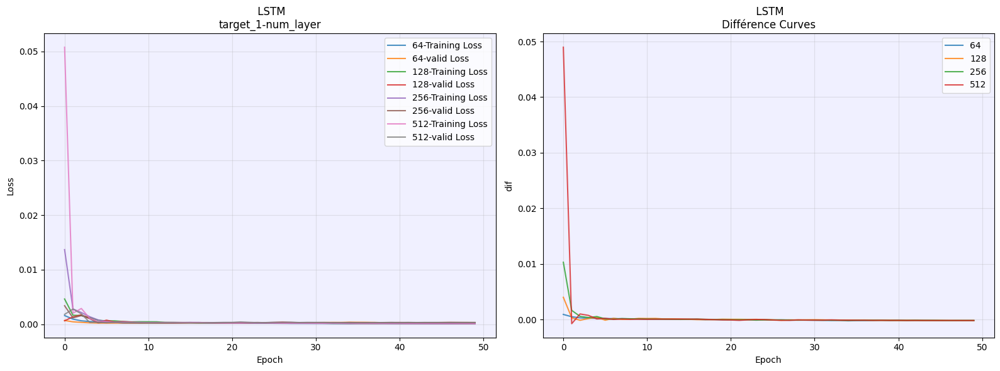

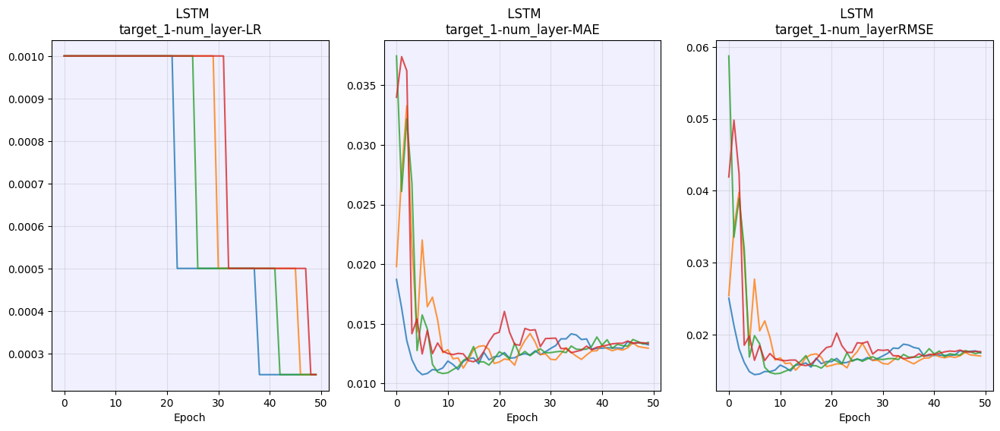

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0027 | Val Loss: 0.0008 | MAE: 0.0198 | RMSE: 0.0270
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0004 | MAE: 0.0150 | RMSE: 0.0194
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0007 | MAE: 0.0221 | RMSE: 0.0265
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0004 | MAE: 0.0150 | RMSE: 0.0194
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0129 | RMSE: 0.0169
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0113 | RMSE: 0.0151
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0117 | RMSE: 0.0156
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0127 | RMSE: 0.0166
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0129 | RMSE: 0.0169
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0133 | RMSE: 0.0174
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0139 | R

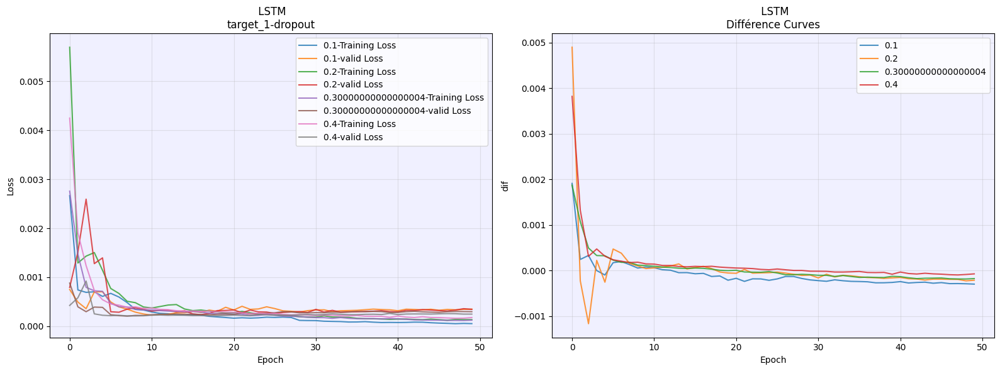

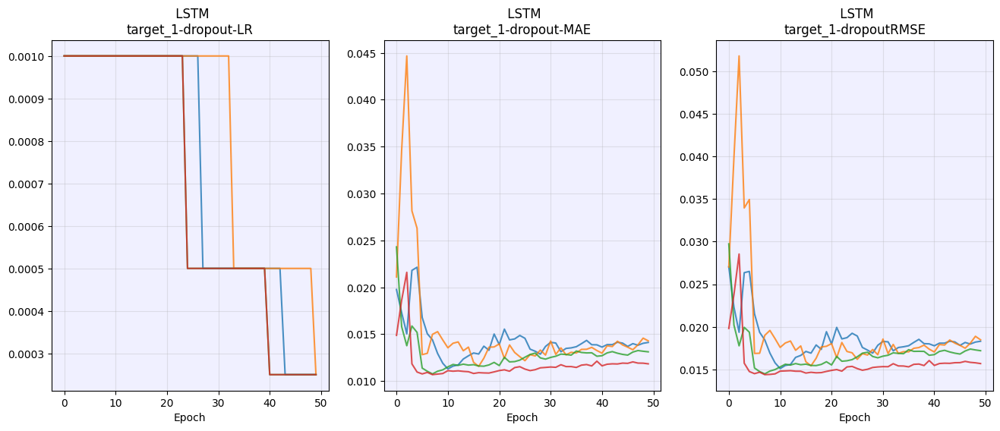

Epoch 01 | LR: 1.0e-04 | Train Loss: 0.0034 | Val Loss: 0.0024 | MAE: 0.0384 | RMSE: 0.0491
Epoch 03 | LR: 1.0e-04 | Train Loss: 0.0017 | Val Loss: 0.0007 | MAE: 0.0205 | RMSE: 0.0260
Epoch 05 | LR: 1.0e-04 | Train Loss: 0.0010 | Val Loss: 0.0007 | MAE: 0.0210 | RMSE: 0.0267
Epoch 07 | LR: 1.0e-04 | Train Loss: 0.0008 | Val Loss: 0.0004 | MAE: 0.0164 | RMSE: 0.0209
Epoch 09 | LR: 1.0e-04 | Train Loss: 0.0006 | Val Loss: 0.0004 | MAE: 0.0147 | RMSE: 0.0192
Epoch 11 | LR: 1.0e-04 | Train Loss: 0.0006 | Val Loss: 0.0003 | MAE: 0.0142 | RMSE: 0.0185
Epoch 13 | LR: 1.0e-04 | Train Loss: 0.0005 | Val Loss: 0.0004 | MAE: 0.0147 | RMSE: 0.0190
Epoch 15 | LR: 1.0e-04 | Train Loss: 0.0005 | Val Loss: 0.0004 | MAE: 0.0149 | RMSE: 0.0195
Epoch 17 | LR: 1.0e-04 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0140 | RMSE: 0.0183
Epoch 19 | LR: 1.0e-04 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0131 | RMSE: 0.0172
Epoch 21 | LR: 1.0e-04 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0136 | R

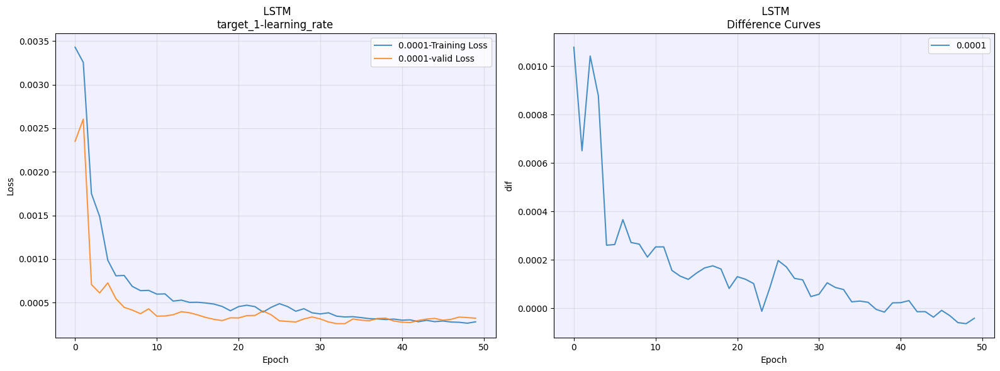

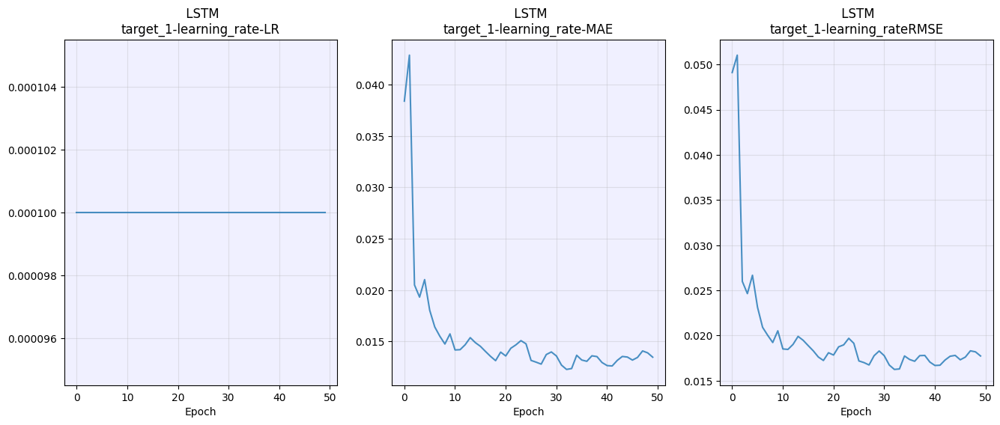

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0035 | Val Loss: 0.0006 | MAE: 0.0192 | RMSE: 0.0250
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0010 | Val Loss: 0.0004 | MAE: 0.0151 | RMSE: 0.0202
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0008 | Val Loss: 0.0004 | MAE: 0.0143 | RMSE: 0.0193
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0121 | RMSE: 0.0161
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0110 | RMSE: 0.0148
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0114 | RMSE: 0.0153
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0123 | RMSE: 0.0163
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0124 | RMSE: 0.0164
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0130 | RMSE: 0.0171
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0120 | RMSE: 0.0159
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0126 | R

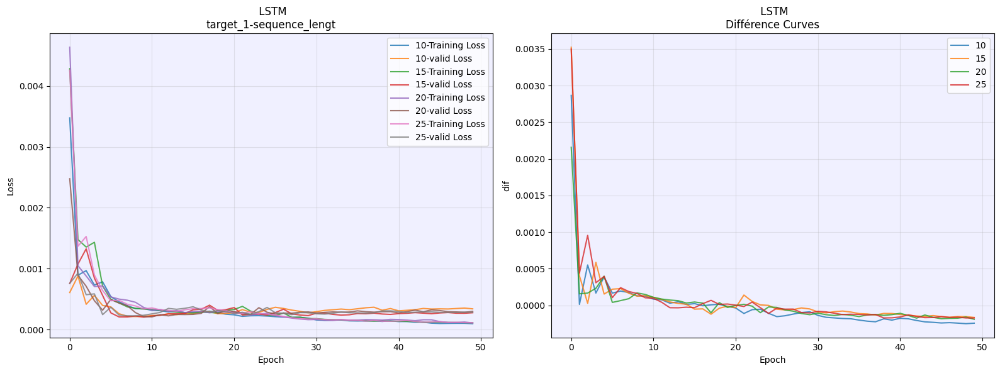

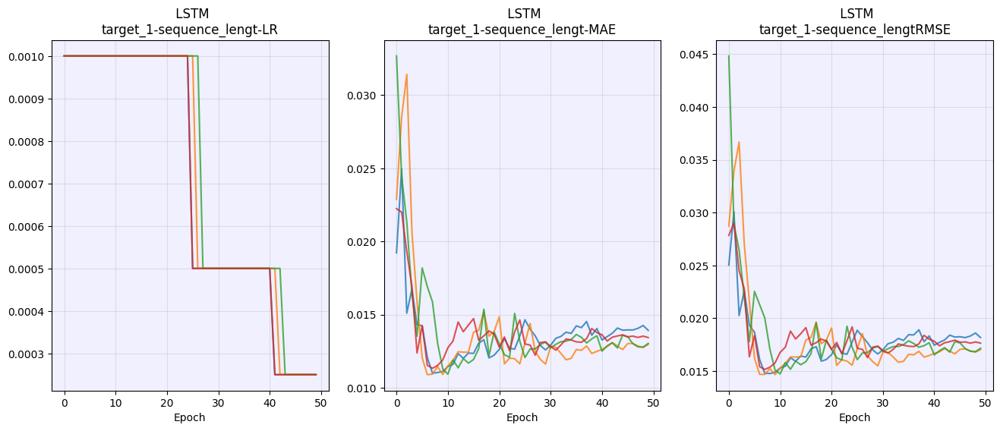

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0243 | Val Loss: 0.0027 | MAE: 0.0419 | RMSE: 0.0528
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0036 | Val Loss: 0.0007 | MAE: 0.0206 | RMSE: 0.0252
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0018 | Val Loss: 0.0003 | MAE: 0.0144 | RMSE: 0.0182
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0010 | Val Loss: 0.0004 | MAE: 0.0161 | RMSE: 0.0200
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0005 | MAE: 0.0182 | RMSE: 0.0216
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0131 | RMSE: 0.0163
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0004 | MAE: 0.0164 | RMSE: 0.0200
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0008 | MAE: 0.0246 | RMSE: 0.0278
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0137 | RMSE: 0.0169
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0117 | RMSE: 0.0146
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0108 | R

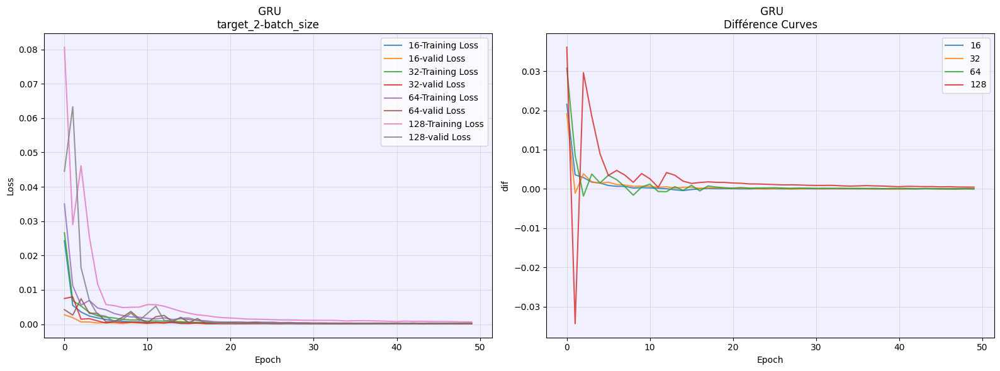

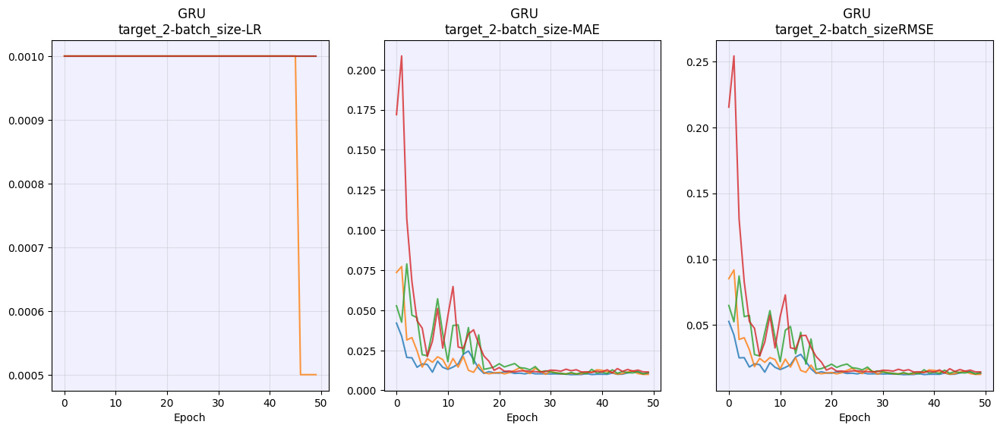

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.1368 | Val Loss: 0.0929 | MAE: 0.2449 | RMSE: 0.3088
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0511 | Val Loss: 0.0241 | MAE: 0.1300 | RMSE: 0.1541
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0177 | Val Loss: 0.0111 | MAE: 0.0909 | RMSE: 0.1070
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0075 | Val Loss: 0.0059 | MAE: 0.0650 | RMSE: 0.0760
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0057 | Val Loss: 0.0039 | MAE: 0.0524 | RMSE: 0.0616
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0022 | Val Loss: 0.0025 | MAE: 0.0429 | RMSE: 0.0506
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0010 | Val Loss: 0.0007 | MAE: 0.0207 | RMSE: 0.0253
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0003 | MAE: 0.0137 | RMSE: 0.0173
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0128 | RMSE: 0.0162
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0119 | RMSE: 0.0149
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0118 | R

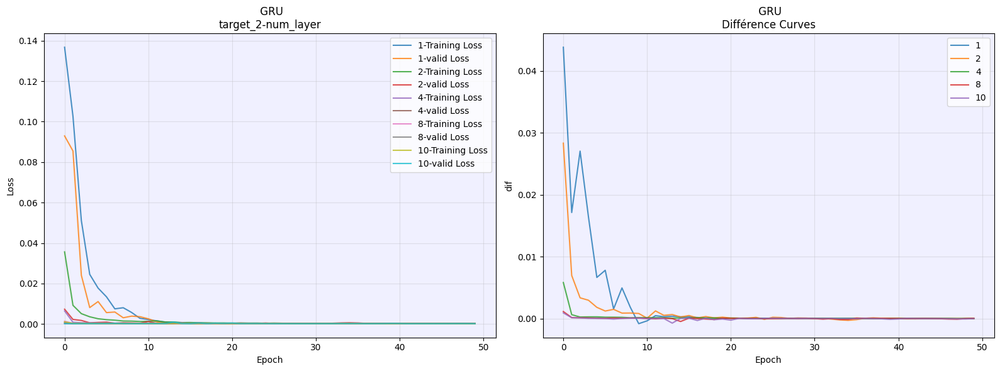

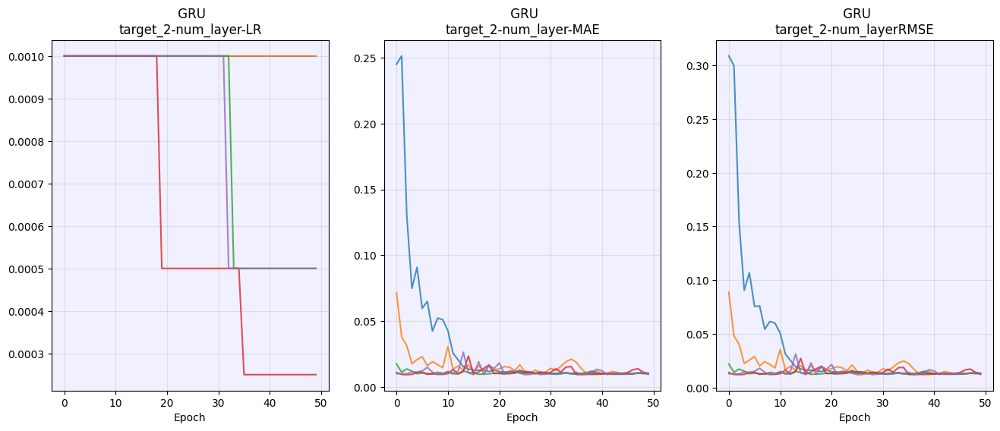

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0129 | Val Loss: 0.0028 | MAE: 0.0469 | RMSE: 0.0543
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0033 | Val Loss: 0.0009 | MAE: 0.0247 | RMSE: 0.0306
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0018 | Val Loss: 0.0005 | MAE: 0.0172 | RMSE: 0.0213
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0011 | Val Loss: 0.0003 | MAE: 0.0139 | RMSE: 0.0175
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0002 | MAE: 0.0118 | RMSE: 0.0148
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0002 | MAE: 0.0109 | RMSE: 0.0138
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0141 | RMSE: 0.0174
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0002 | MAE: 0.0109 | RMSE: 0.0137
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0105 | RMSE: 0.0133
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0103 | RMSE: 0.0130
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0103 | R

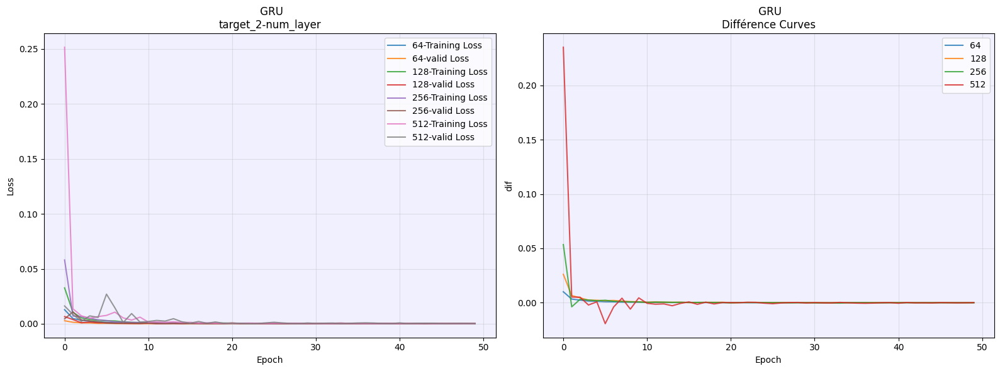

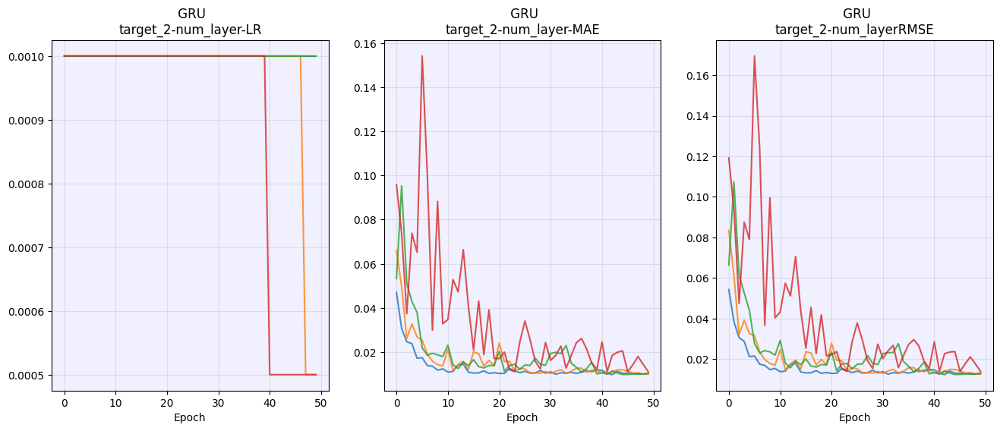

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0306 | Val Loss: 0.0039 | MAE: 0.0461 | RMSE: 0.0575
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0040 | Val Loss: 0.0043 | MAE: 0.0563 | RMSE: 0.0640
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0031 | Val Loss: 0.0021 | MAE: 0.0375 | RMSE: 0.0464
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0025 | Val Loss: 0.0009 | MAE: 0.0245 | RMSE: 0.0308
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0019 | Val Loss: 0.0005 | MAE: 0.0167 | RMSE: 0.0210
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0011 | Val Loss: 0.0006 | MAE: 0.0203 | RMSE: 0.0251
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0009 | Val Loss: 0.0004 | MAE: 0.0171 | RMSE: 0.0211
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0004 | MAE: 0.0146 | RMSE: 0.0185
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0003 | MAE: 0.0125 | RMSE: 0.0157
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0135 | RMSE: 0.0168
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0137 | R

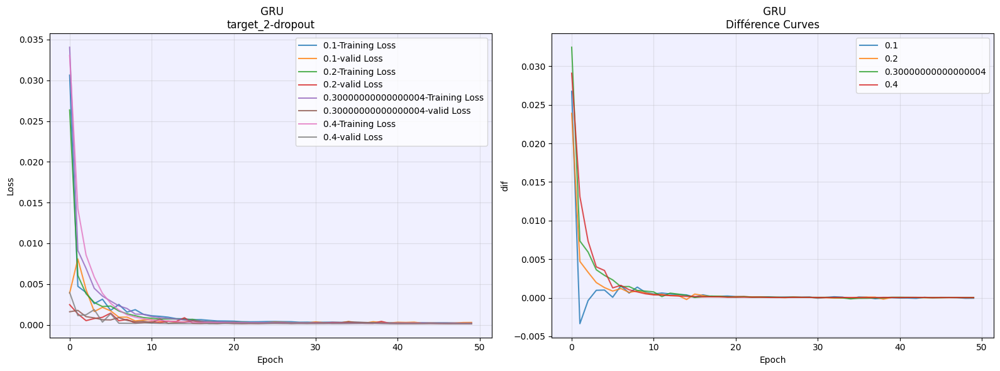

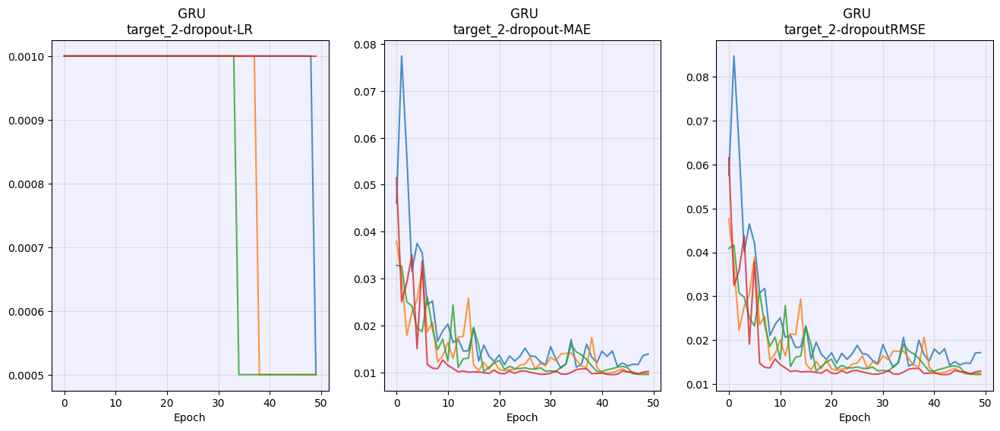

Epoch 01 | LR: 1.0e-04 | Train Loss: 0.0155 | Val Loss: 0.0096 | MAE: 0.0830 | RMSE: 0.0985
Epoch 03 | LR: 1.0e-04 | Train Loss: 0.0135 | Val Loss: 0.0195 | MAE: 0.1191 | RMSE: 0.1432
Epoch 05 | LR: 1.0e-04 | Train Loss: 0.0070 | Val Loss: 0.0014 | MAE: 0.0300 | RMSE: 0.0381
Epoch 07 | LR: 1.0e-04 | Train Loss: 0.0039 | Val Loss: 0.0018 | MAE: 0.0357 | RMSE: 0.0423
Epoch 09 | LR: 1.0e-04 | Train Loss: 0.0035 | Val Loss: 0.0008 | MAE: 0.0233 | RMSE: 0.0286
Epoch 11 | LR: 1.0e-04 | Train Loss: 0.0030 | Val Loss: 0.0010 | MAE: 0.0264 | RMSE: 0.0324
Epoch 13 | LR: 1.0e-04 | Train Loss: 0.0025 | Val Loss: 0.0007 | MAE: 0.0210 | RMSE: 0.0265
Epoch 15 | LR: 1.0e-04 | Train Loss: 0.0026 | Val Loss: 0.0005 | MAE: 0.0175 | RMSE: 0.0219
Epoch 17 | LR: 1.0e-04 | Train Loss: 0.0024 | Val Loss: 0.0005 | MAE: 0.0178 | RMSE: 0.0221
Epoch 19 | LR: 1.0e-04 | Train Loss: 0.0023 | Val Loss: 0.0004 | MAE: 0.0168 | RMSE: 0.0210
Epoch 21 | LR: 1.0e-04 | Train Loss: 0.0020 | Val Loss: 0.0004 | MAE: 0.0166 | R

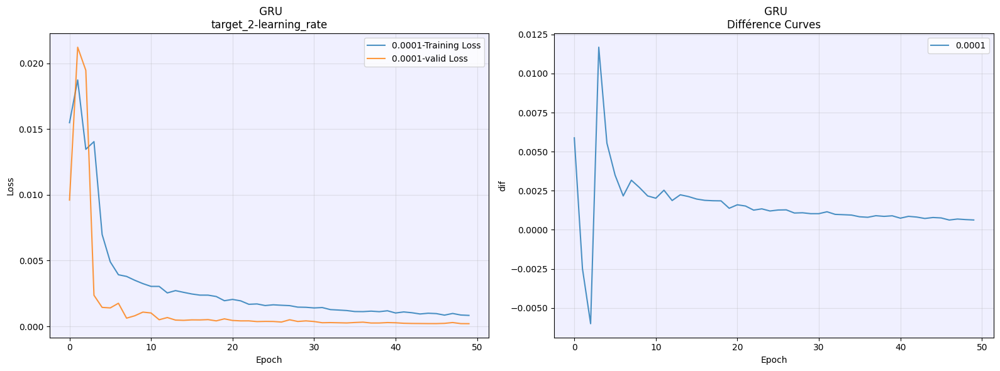

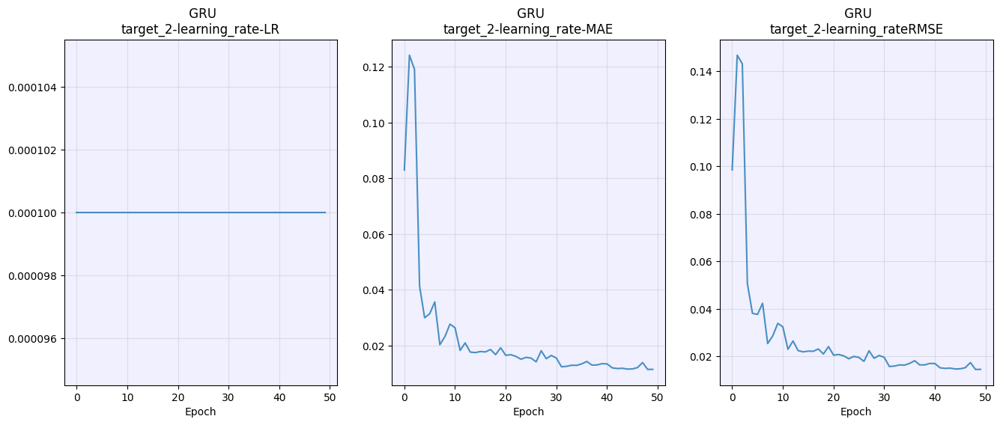

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0288 | Val Loss: 0.0028 | MAE: 0.0427 | RMSE: 0.0527
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0047 | Val Loss: 0.0017 | MAE: 0.0303 | RMSE: 0.0376
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0032 | Val Loss: 0.0008 | MAE: 0.0224 | RMSE: 0.0275
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0015 | Val Loss: 0.0005 | MAE: 0.0164 | RMSE: 0.0205
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0013 | Val Loss: 0.0006 | MAE: 0.0208 | RMSE: 0.0256
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0011 | Val Loss: 0.0004 | MAE: 0.0153 | RMSE: 0.0191
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0013 | Val Loss: 0.0006 | MAE: 0.0207 | RMSE: 0.0248
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0009 | Val Loss: 0.0006 | MAE: 0.0197 | RMSE: 0.0236
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0003 | MAE: 0.0119 | RMSE: 0.0150
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0003 | MAE: 0.0137 | RMSE: 0.0170
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0003 | MAE: 0.0140 | R

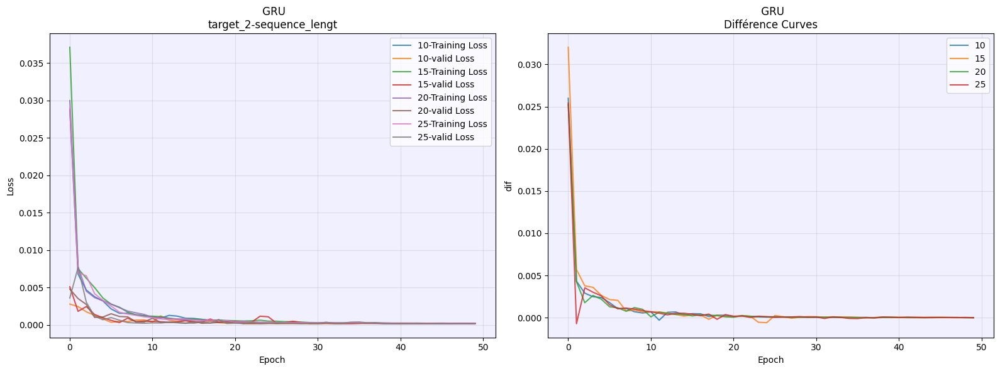

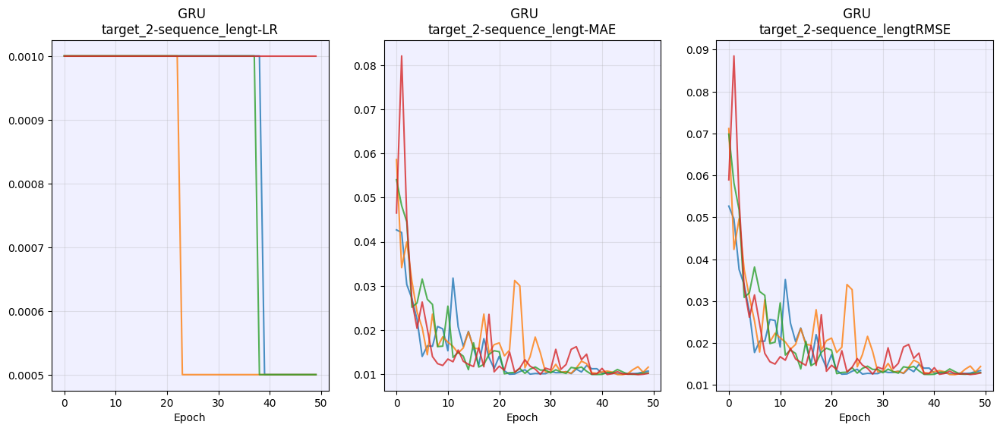

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0016 | Val Loss: 0.0002 | MAE: 0.0116 | RMSE: 0.0147
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0111 | RMSE: 0.0140
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0101 | RMSE: 0.0128
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0110 | RMSE: 0.0138
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0111 | RMSE: 0.0140
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0118 | RMSE: 0.0148
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0128 | RMSE: 0.0160
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0113 | RMSE: 0.0143
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0114 | RMSE: 0.0143
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0111 | RMSE: 0.0140
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0001 | Val Loss: 0.0002 | MAE: 0.0106 | R

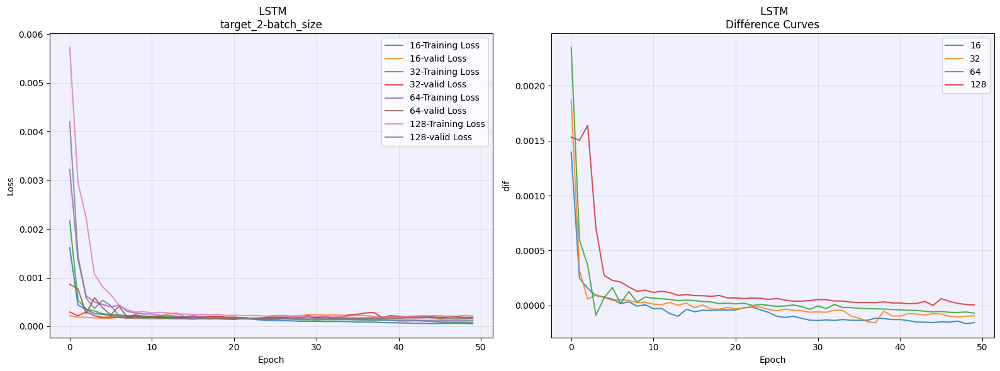

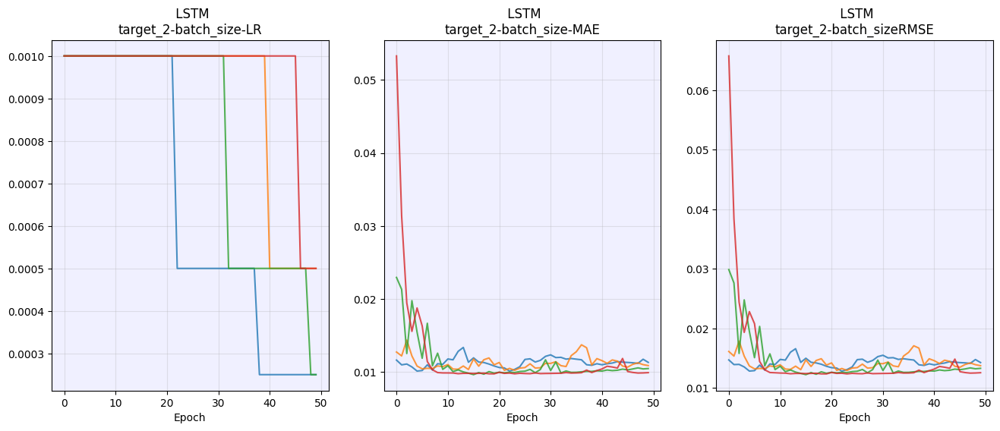

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0324 | Val Loss: 0.0320 | MAE: 0.1465 | RMSE: 0.1823
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0082 | Val Loss: 0.0027 | MAE: 0.0403 | RMSE: 0.0536
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0024 | Val Loss: 0.0010 | MAE: 0.0241 | RMSE: 0.0305
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0013 | Val Loss: 0.0008 | MAE: 0.0217 | RMSE: 0.0270
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0009 | Val Loss: 0.0006 | MAE: 0.0199 | RMSE: 0.0246
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0004 | MAE: 0.0150 | RMSE: 0.0189
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0140 | RMSE: 0.0185
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0003 | MAE: 0.0140 | RMSE: 0.0188
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0004 | MAE: 0.0150 | RMSE: 0.0199
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0005 | MAE: 0.0169 | RMSE: 0.0220
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0005 | MAE: 0.0172 | R

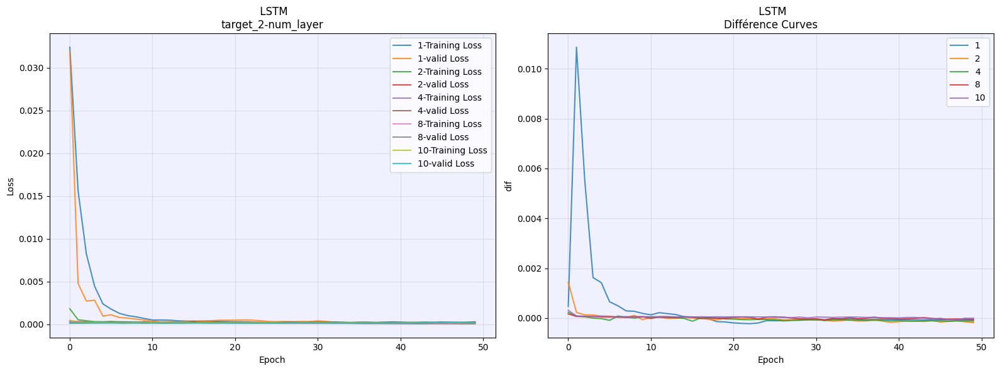

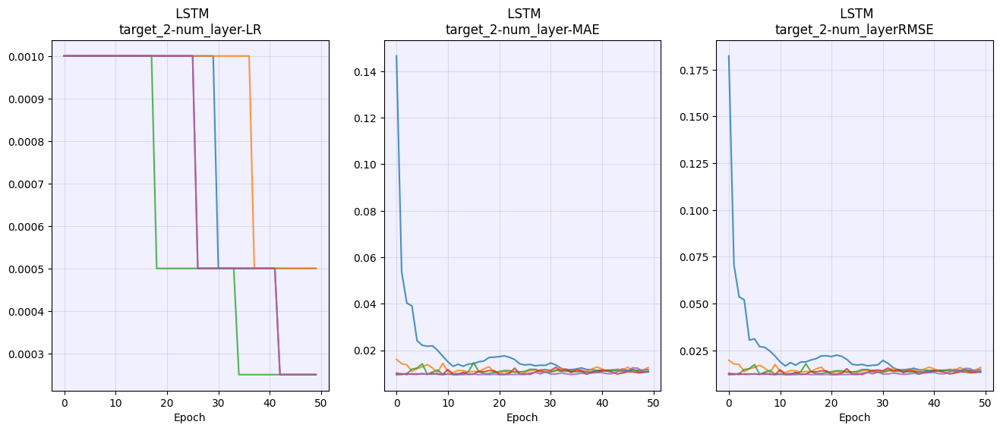

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0016 | Val Loss: 0.0003 | MAE: 0.0147 | RMSE: 0.0184
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0130 | RMSE: 0.0163
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0004 | MAE: 0.0160 | RMSE: 0.0192
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0118 | RMSE: 0.0148
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0142 | RMSE: 0.0176
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0102 | RMSE: 0.0129
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0121 | RMSE: 0.0151
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0004 | MAE: 0.0173 | RMSE: 0.0204
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0109 | RMSE: 0.0137
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0110 | RMSE: 0.0138
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0111 | R

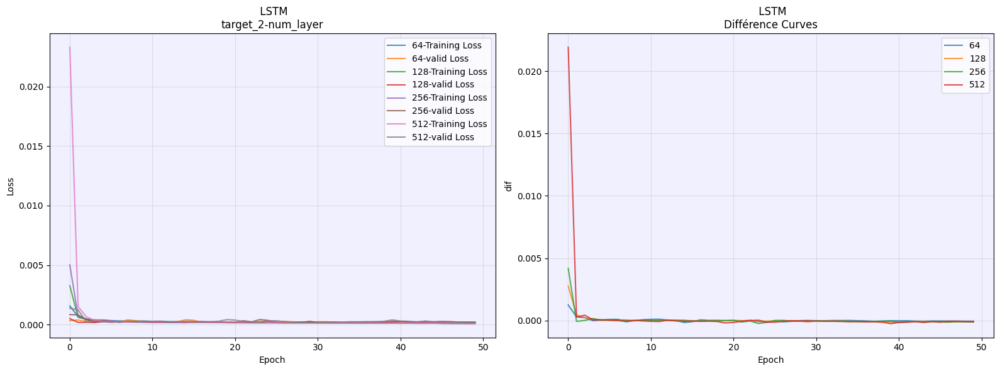

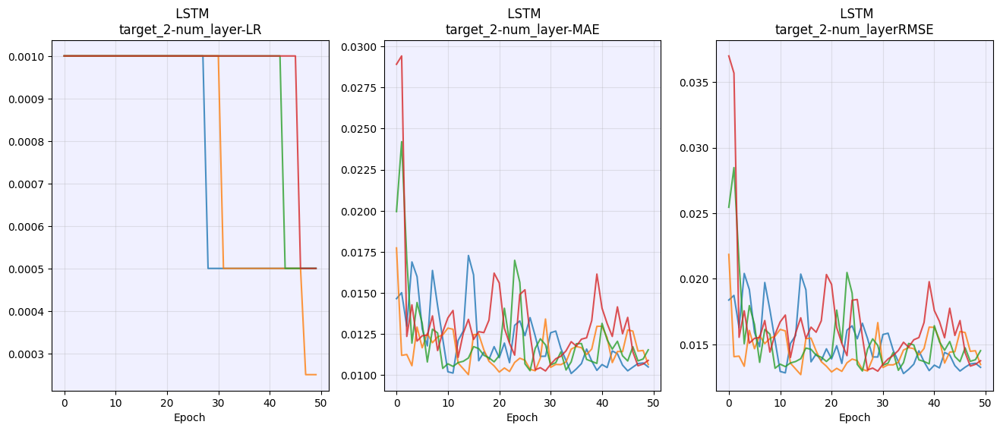

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0015 | Val Loss: 0.0002 | MAE: 0.0119 | RMSE: 0.0151
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0131 | RMSE: 0.0164
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0117 | RMSE: 0.0147
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0114 | RMSE: 0.0144
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0118 | RMSE: 0.0150
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0138 | RMSE: 0.0173
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0114 | RMSE: 0.0143
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0111 | RMSE: 0.0141
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0119 | RMSE: 0.0149
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0001 | Val Loss: 0.0002 | MAE: 0.0114 | RMSE: 0.0143
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0001 | Val Loss: 0.0002 | MAE: 0.0116 | R

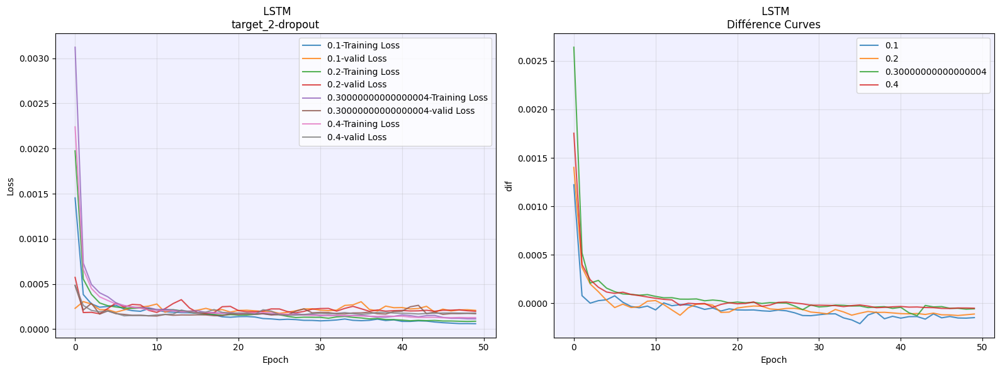

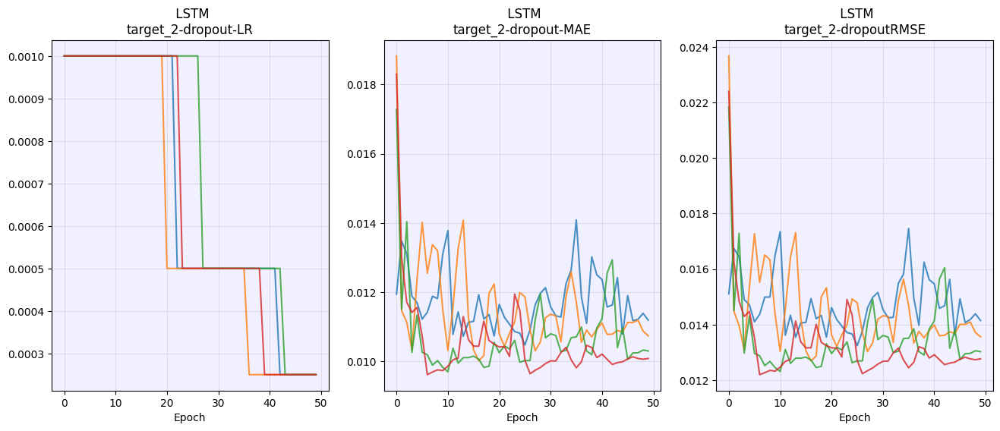

Epoch 01 | LR: 1.0e-04 | Train Loss: 0.0022 | Val Loss: 0.0009 | MAE: 0.0238 | RMSE: 0.0291
Epoch 03 | LR: 1.0e-04 | Train Loss: 0.0010 | Val Loss: 0.0003 | MAE: 0.0139 | RMSE: 0.0177
Epoch 05 | LR: 1.0e-04 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0130 | RMSE: 0.0165
Epoch 07 | LR: 1.0e-04 | Train Loss: 0.0005 | Val Loss: 0.0005 | MAE: 0.0176 | RMSE: 0.0222
Epoch 09 | LR: 1.0e-04 | Train Loss: 0.0004 | Val Loss: 0.0002 | MAE: 0.0117 | RMSE: 0.0147
Epoch 11 | LR: 1.0e-04 | Train Loss: 0.0004 | Val Loss: 0.0002 | MAE: 0.0123 | RMSE: 0.0154
Epoch 13 | LR: 1.0e-04 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0146 | RMSE: 0.0184
Epoch 15 | LR: 1.0e-04 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0115 | RMSE: 0.0146
Epoch 17 | LR: 1.0e-04 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0119 | RMSE: 0.0149
Epoch 19 | LR: 1.0e-04 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0117 | RMSE: 0.0147
Epoch 21 | LR: 1.0e-04 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0122 | R

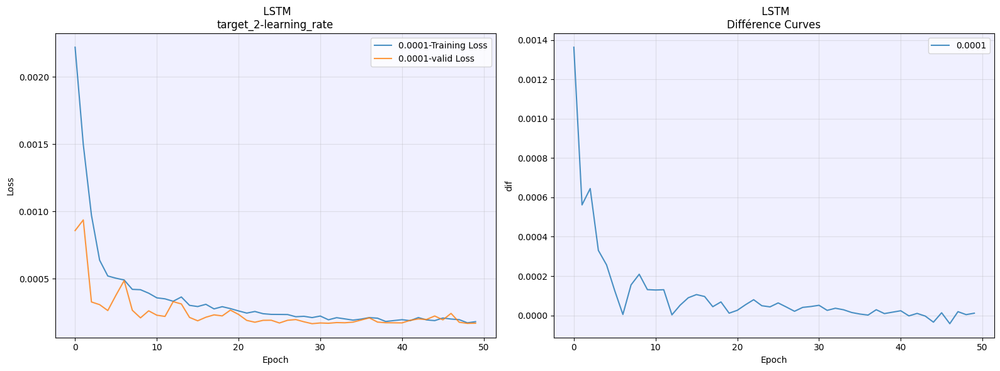

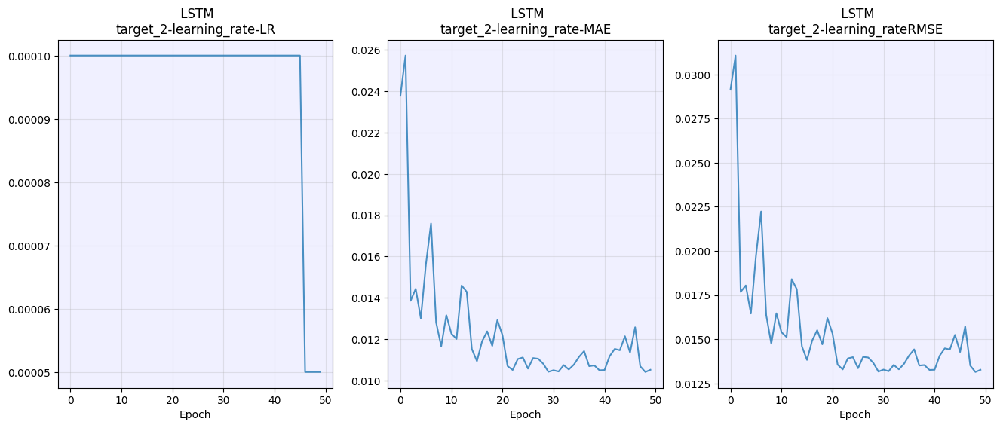

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0024 | Val Loss: 0.0005 | MAE: 0.0183 | RMSE: 0.0223
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0003 | MAE: 0.0128 | RMSE: 0.0161
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0125 | RMSE: 0.0160
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0113 | RMSE: 0.0142
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0111 | RMSE: 0.0140
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0105 | RMSE: 0.0132
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0106 | RMSE: 0.0133
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0001 | MAE: 0.0099 | RMSE: 0.0125
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0102 | RMSE: 0.0129
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0106 | RMSE: 0.0135
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0103 | R

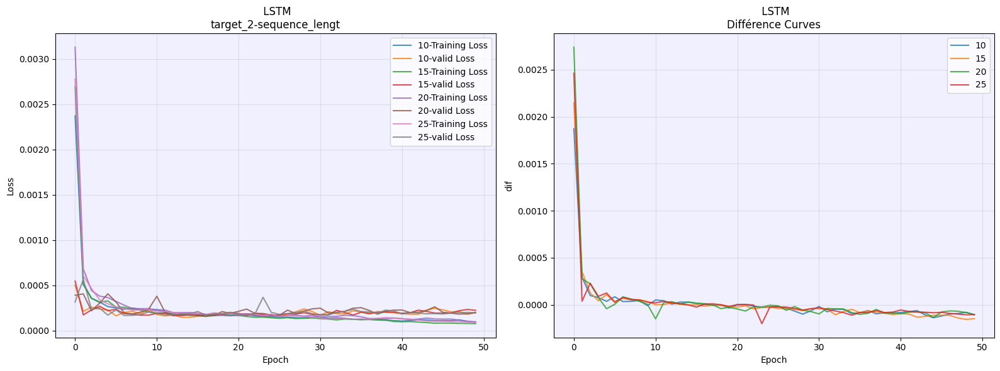

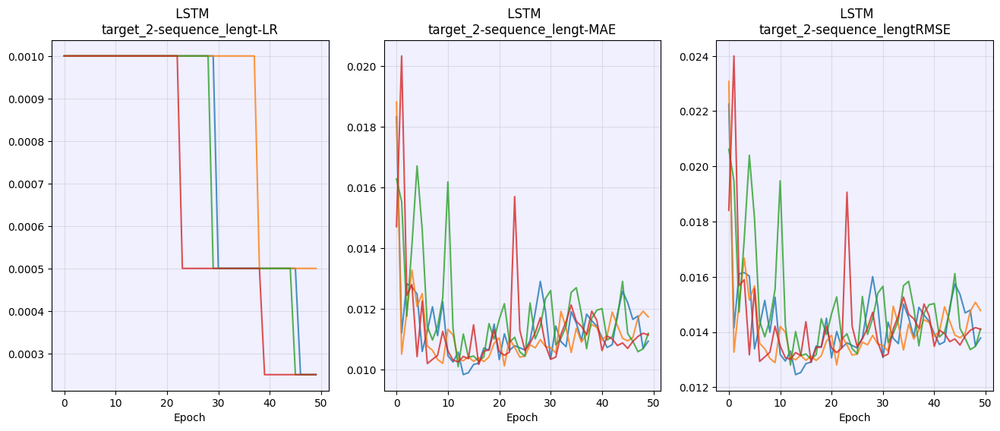

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0169 | Val Loss: 0.0008 | MAE: 0.0222 | RMSE: 0.0278
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0031 | Val Loss: 0.0006 | MAE: 0.0183 | RMSE: 0.0230
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0014 | Val Loss: 0.0005 | MAE: 0.0181 | RMSE: 0.0220
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0009 | Val Loss: 0.0002 | MAE: 0.0122 | RMSE: 0.0154
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0002 | MAE: 0.0115 | RMSE: 0.0146
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0002 | MAE: 0.0119 | RMSE: 0.0152
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0118 | RMSE: 0.0151
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0108 | RMSE: 0.0138
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0107 | RMSE: 0.0135
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0110 | RMSE: 0.0139
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0110 | R

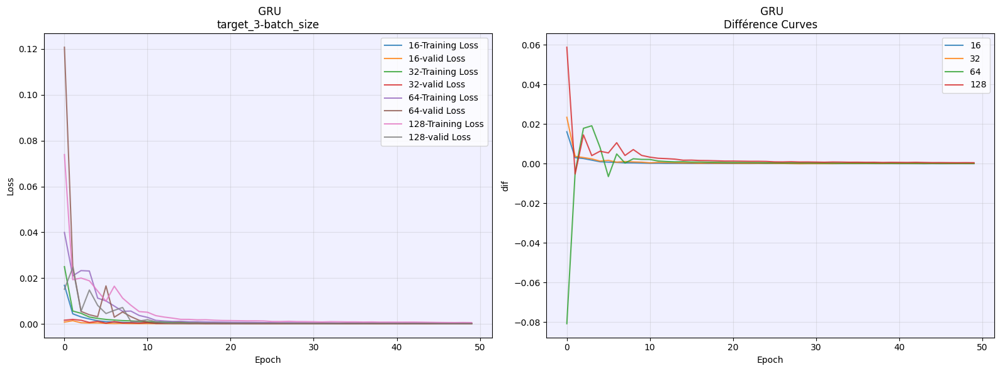

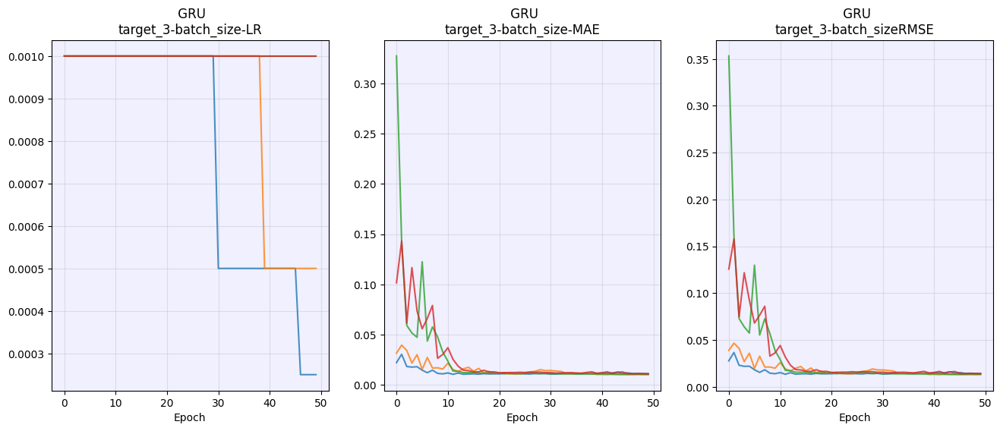

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.1681 | Val Loss: 0.2107 | MAE: 0.4145 | RMSE: 0.4752
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0826 | Val Loss: 0.0917 | MAE: 0.2676 | RMSE: 0.3079
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0221 | Val Loss: 0.0103 | MAE: 0.0884 | RMSE: 0.1041
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0098 | Val Loss: 0.0086 | MAE: 0.0749 | RMSE: 0.0938
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0062 | Val Loss: 0.0056 | MAE: 0.0615 | RMSE: 0.0748
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0078 | Val Loss: 0.0040 | MAE: 0.0507 | RMSE: 0.0620
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0017 | Val Loss: 0.0008 | MAE: 0.0209 | RMSE: 0.0270
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0008 | Val Loss: 0.0004 | MAE: 0.0158 | RMSE: 0.0200
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0003 | MAE: 0.0138 | RMSE: 0.0174
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0002 | MAE: 0.0124 | RMSE: 0.0156
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0118 | R

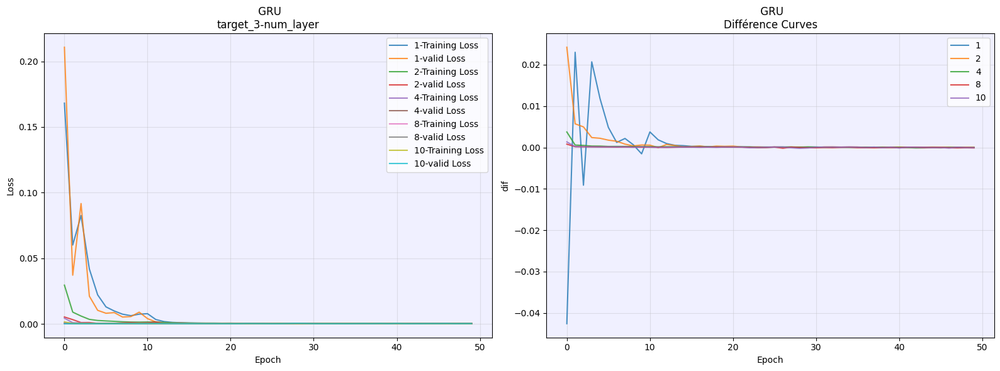

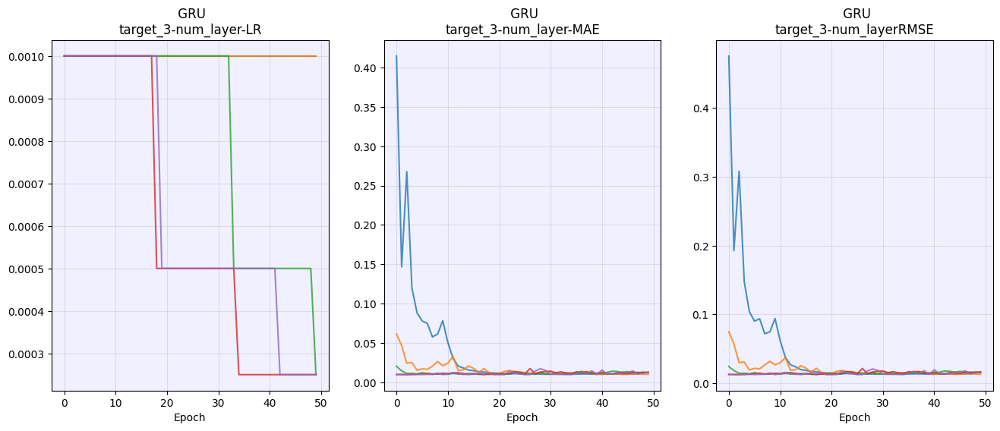

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0184 | Val Loss: 0.0032 | MAE: 0.0478 | RMSE: 0.0581
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0044 | Val Loss: 0.0020 | MAE: 0.0358 | RMSE: 0.0451
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0024 | Val Loss: 0.0015 | MAE: 0.0334 | RMSE: 0.0401
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0017 | Val Loss: 0.0008 | MAE: 0.0227 | RMSE: 0.0281
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0012 | Val Loss: 0.0008 | MAE: 0.0239 | RMSE: 0.0290
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0012 | Val Loss: 0.0004 | MAE: 0.0158 | RMSE: 0.0199
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0008 | Val Loss: 0.0012 | MAE: 0.0322 | RMSE: 0.0356
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0009 | MAE: 0.0264 | RMSE: 0.0297
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0004 | MAE: 0.0160 | RMSE: 0.0200
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0003 | MAE: 0.0151 | RMSE: 0.0186
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0007 | MAE: 0.0240 | R

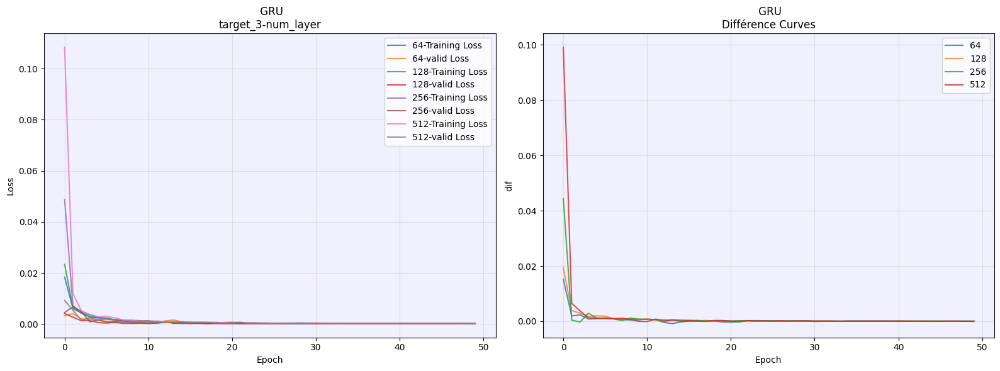

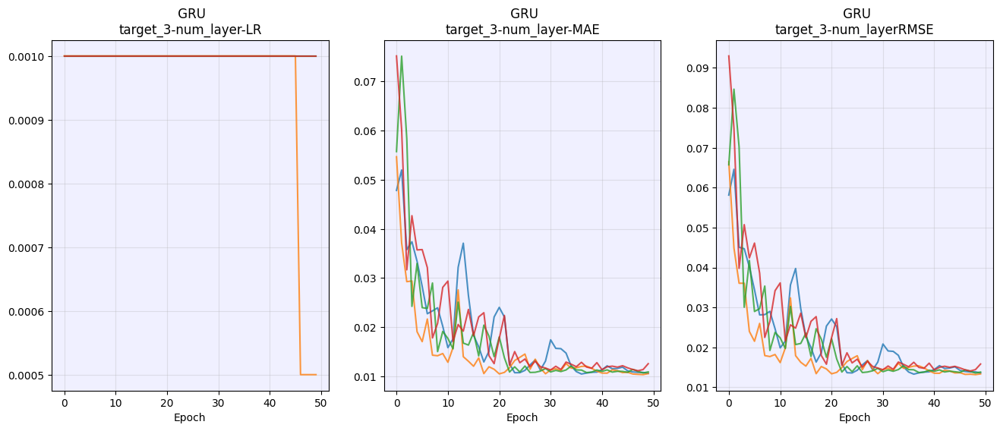

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0268 | Val Loss: 0.0022 | MAE: 0.0373 | RMSE: 0.0471
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0033 | Val Loss: 0.0016 | MAE: 0.0315 | RMSE: 0.0387
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0028 | Val Loss: 0.0029 | MAE: 0.0441 | RMSE: 0.0557
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0022 | Val Loss: 0.0013 | MAE: 0.0294 | RMSE: 0.0360
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0015 | Val Loss: 0.0011 | MAE: 0.0274 | RMSE: 0.0336
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0012 | Val Loss: 0.0007 | MAE: 0.0214 | RMSE: 0.0264
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0008 | Val Loss: 0.0003 | MAE: 0.0145 | RMSE: 0.0183
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0005 | MAE: 0.0160 | RMSE: 0.0198
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0005 | MAE: 0.0164 | RMSE: 0.0203
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0143 | RMSE: 0.0180
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0005 | MAE: 0.0172 | R

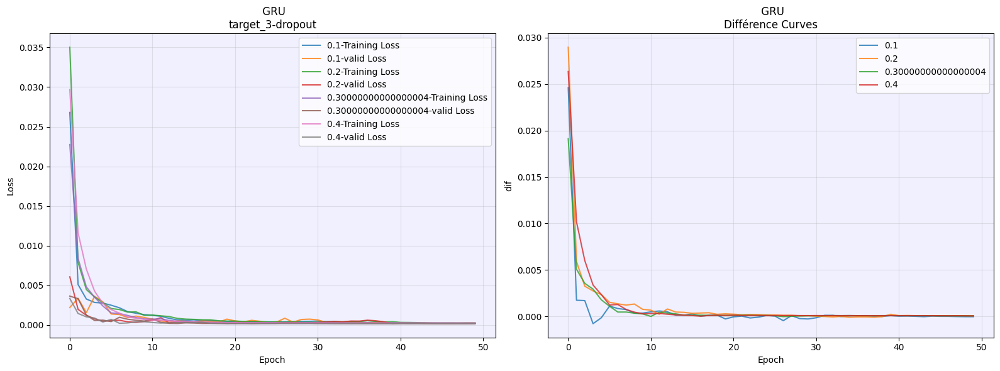

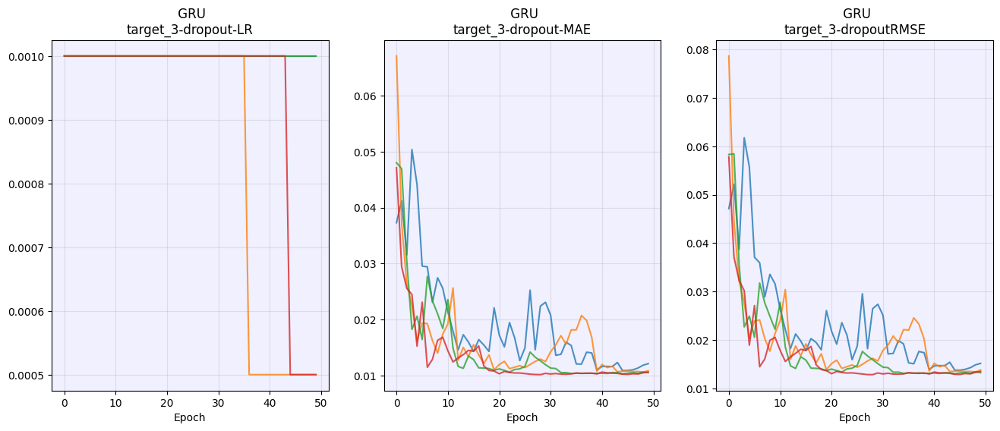

Epoch 01 | LR: 1.0e-04 | Train Loss: 0.0169 | Val Loss: 0.0167 | MAE: 0.1062 | RMSE: 0.1246
Epoch 03 | LR: 1.0e-04 | Train Loss: 0.0087 | Val Loss: 0.0045 | MAE: 0.0538 | RMSE: 0.0663
Epoch 05 | LR: 1.0e-04 | Train Loss: 0.0072 | Val Loss: 0.0056 | MAE: 0.0668 | RMSE: 0.0765
Epoch 07 | LR: 1.0e-04 | Train Loss: 0.0047 | Val Loss: 0.0015 | MAE: 0.0302 | RMSE: 0.0373
Epoch 09 | LR: 1.0e-04 | Train Loss: 0.0034 | Val Loss: 0.0008 | MAE: 0.0212 | RMSE: 0.0265
Epoch 11 | LR: 1.0e-04 | Train Loss: 0.0029 | Val Loss: 0.0007 | MAE: 0.0214 | RMSE: 0.0267
Epoch 13 | LR: 1.0e-04 | Train Loss: 0.0026 | Val Loss: 0.0008 | MAE: 0.0202 | RMSE: 0.0252
Epoch 15 | LR: 1.0e-04 | Train Loss: 0.0023 | Val Loss: 0.0006 | MAE: 0.0201 | RMSE: 0.0248
Epoch 17 | LR: 1.0e-04 | Train Loss: 0.0023 | Val Loss: 0.0005 | MAE: 0.0179 | RMSE: 0.0223
Epoch 19 | LR: 1.0e-04 | Train Loss: 0.0020 | Val Loss: 0.0004 | MAE: 0.0168 | RMSE: 0.0207
Epoch 21 | LR: 1.0e-04 | Train Loss: 0.0019 | Val Loss: 0.0004 | MAE: 0.0171 | R

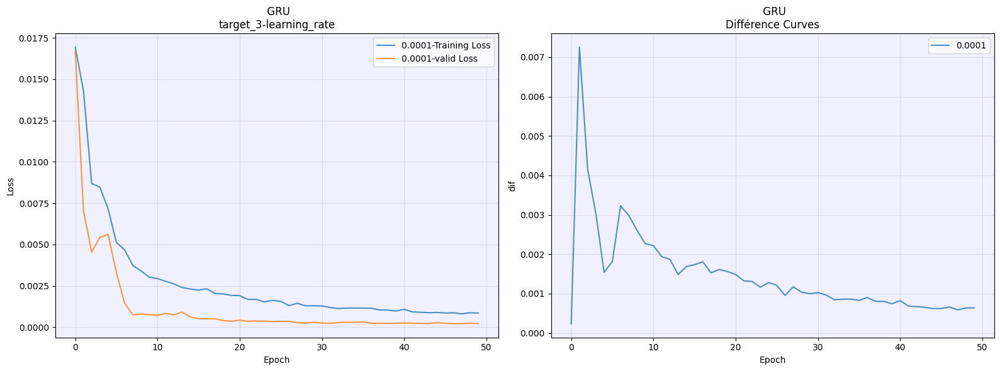

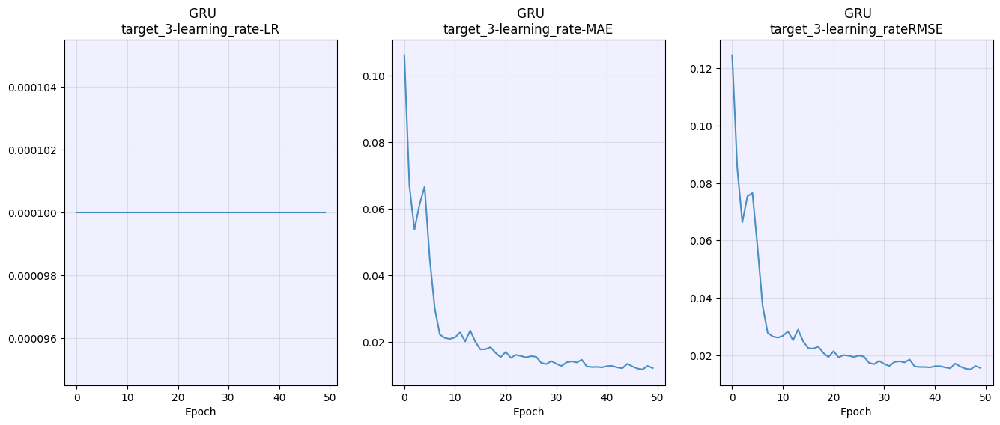

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0163 | Val Loss: 0.0080 | MAE: 0.0747 | RMSE: 0.0885
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0037 | Val Loss: 0.0016 | MAE: 0.0335 | RMSE: 0.0413
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0023 | Val Loss: 0.0008 | MAE: 0.0231 | RMSE: 0.0284
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0013 | Val Loss: 0.0005 | MAE: 0.0188 | RMSE: 0.0233
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0009 | Val Loss: 0.0004 | MAE: 0.0163 | RMSE: 0.0202
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0003 | MAE: 0.0135 | RMSE: 0.0170
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0151 | RMSE: 0.0186
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0130 | RMSE: 0.0165
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0002 | MAE: 0.0116 | RMSE: 0.0147
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0124 | RMSE: 0.0157
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0004 | MAE: 0.0163 | R

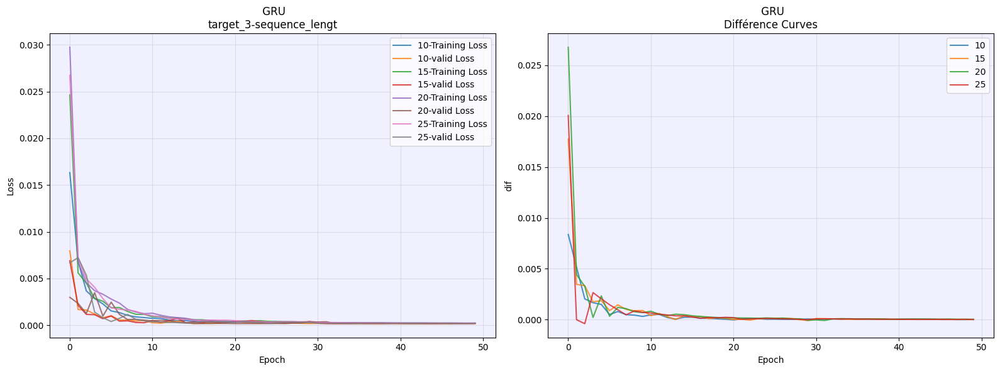

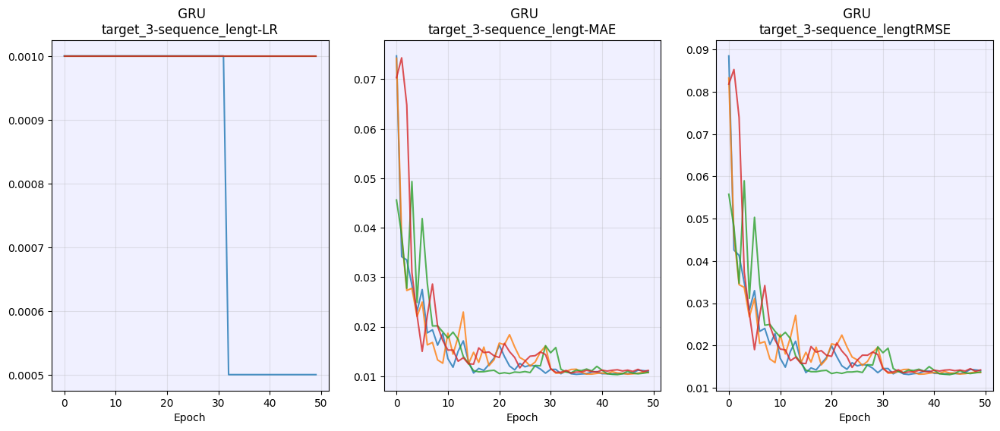

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0012 | Val Loss: 0.0003 | MAE: 0.0143 | RMSE: 0.0178
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0108 | RMSE: 0.0136
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0104 | RMSE: 0.0133
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0110 | RMSE: 0.0139
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0108 | RMSE: 0.0138
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0113 | RMSE: 0.0143
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0115 | RMSE: 0.0147
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0117 | RMSE: 0.0148
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0120 | RMSE: 0.0153
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0128 | RMSE: 0.0162
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0121 | R

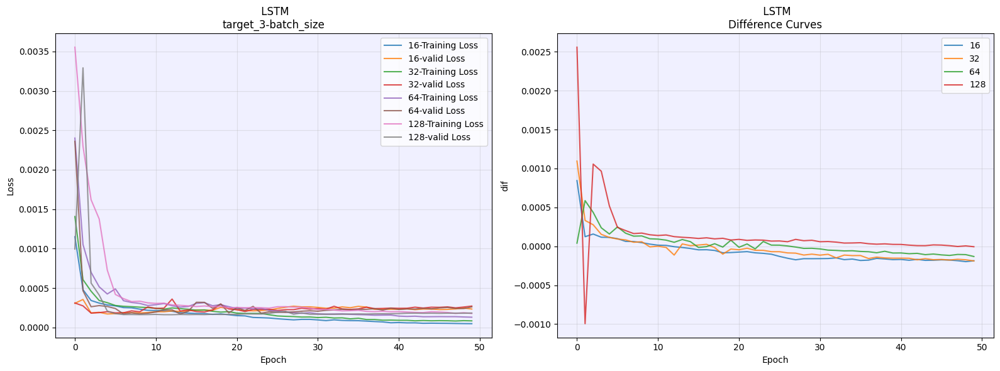

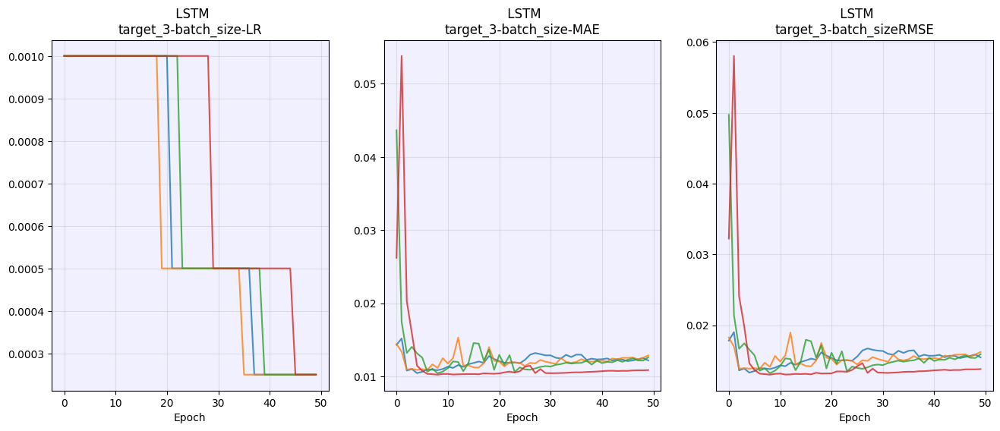

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0322 | Val Loss: 0.0289 | MAE: 0.1399 | RMSE: 0.1679
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0066 | Val Loss: 0.0097 | MAE: 0.0818 | RMSE: 0.1017
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0045 | Val Loss: 0.0045 | MAE: 0.0451 | RMSE: 0.0553
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0013 | Val Loss: 0.0013 | MAE: 0.0203 | RMSE: 0.0274
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0008 | Val Loss: 0.0008 | MAE: 0.0160 | RMSE: 0.0213
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0006 | MAE: 0.0149 | RMSE: 0.0193
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0004 | MAE: 0.0138 | RMSE: 0.0179
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0005 | MAE: 0.0135 | RMSE: 0.0179
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0005 | MAE: 0.0133 | RMSE: 0.0178
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0005 | MAE: 0.0130 | RMSE: 0.0174
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0006 | MAE: 0.0131 | R

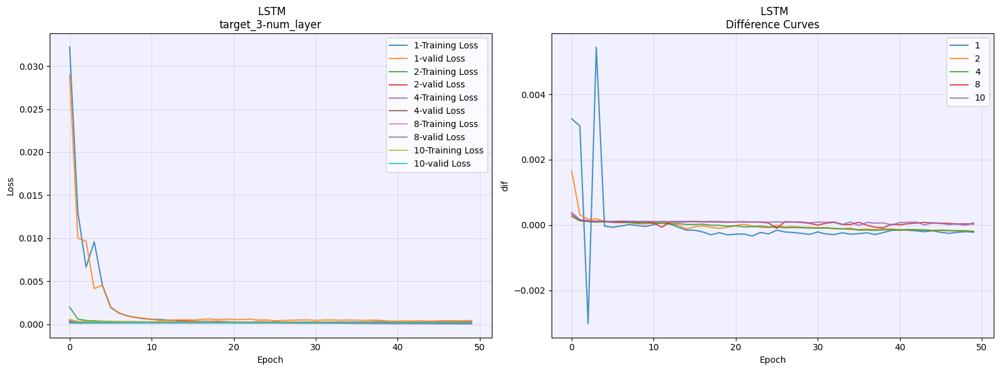

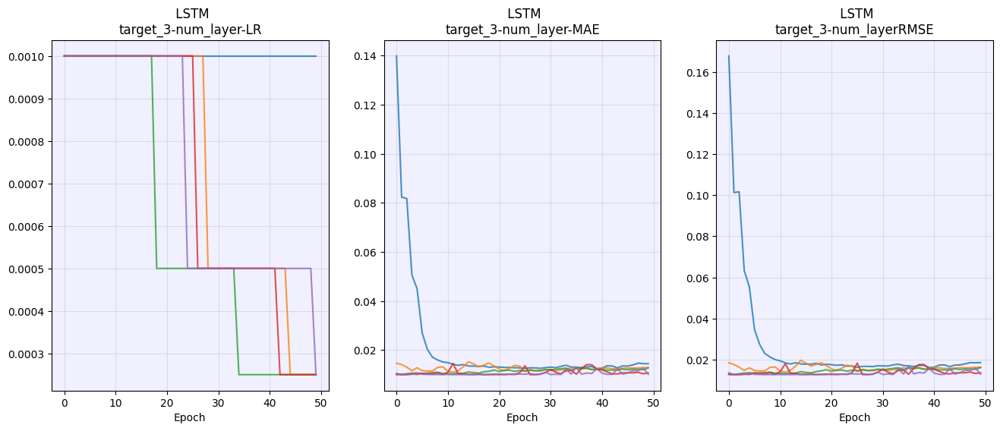

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0016 | Val Loss: 0.0008 | MAE: 0.0244 | RMSE: 0.0289
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0002 | MAE: 0.0108 | RMSE: 0.0138
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0104 | RMSE: 0.0132
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0104 | RMSE: 0.0132
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0105 | RMSE: 0.0134
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0107 | RMSE: 0.0136
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0107 | RMSE: 0.0136
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0109 | RMSE: 0.0139
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0111 | RMSE: 0.0141
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0110 | RMSE: 0.0141
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0111 | R

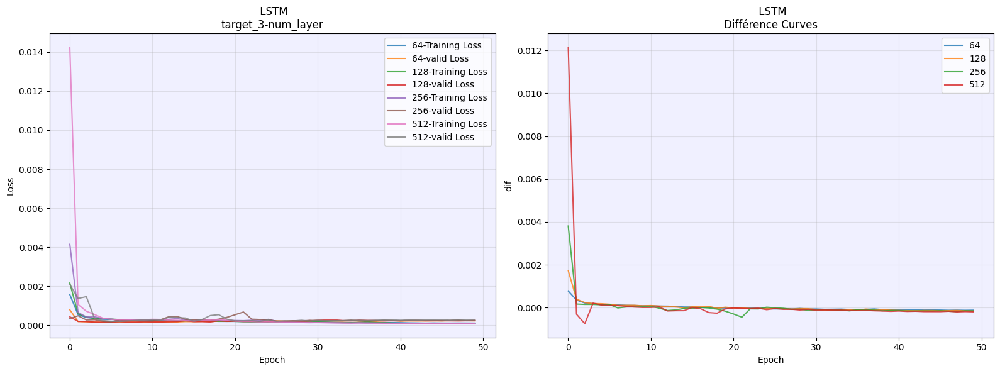

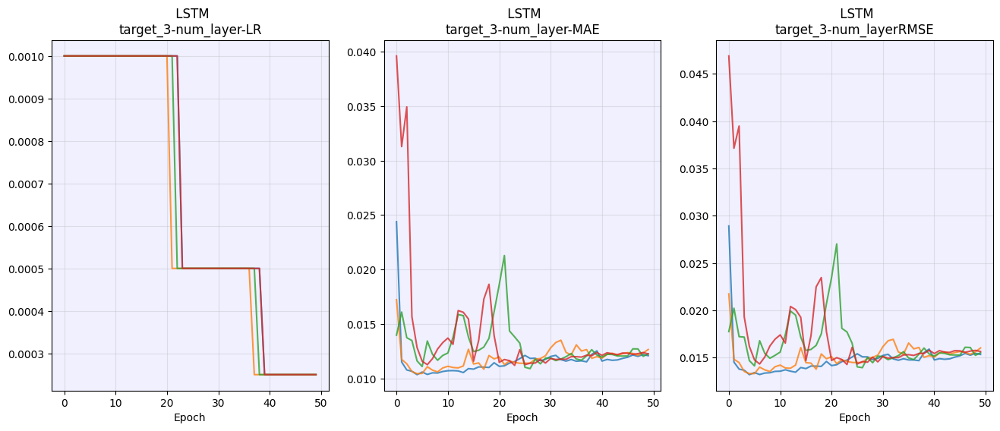

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0026 | Val Loss: 0.0007 | MAE: 0.0211 | RMSE: 0.0257
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0002 | MAE: 0.0123 | RMSE: 0.0156
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0129 | RMSE: 0.0162
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0004 | MAE: 0.0154 | RMSE: 0.0193
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0135 | RMSE: 0.0168
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0113 | RMSE: 0.0144
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0120 | RMSE: 0.0152
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0115 | RMSE: 0.0146
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0120 | RMSE: 0.0152
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0121 | RMSE: 0.0154
Epoch 21 | LR: 5.0e-04 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0119 | R

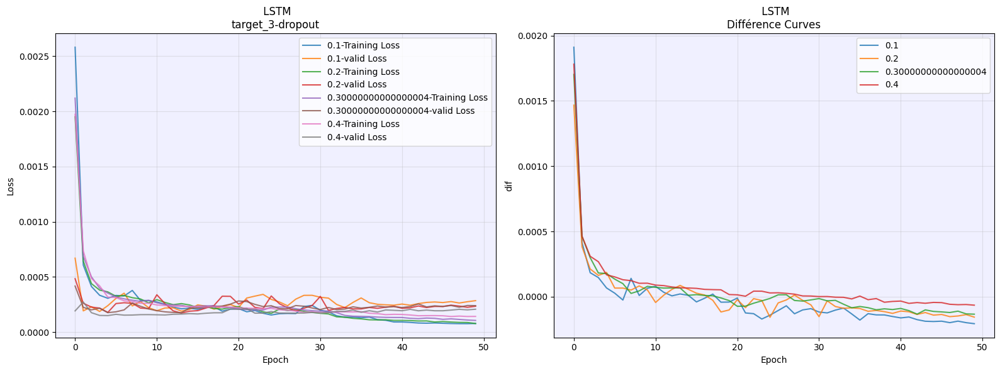

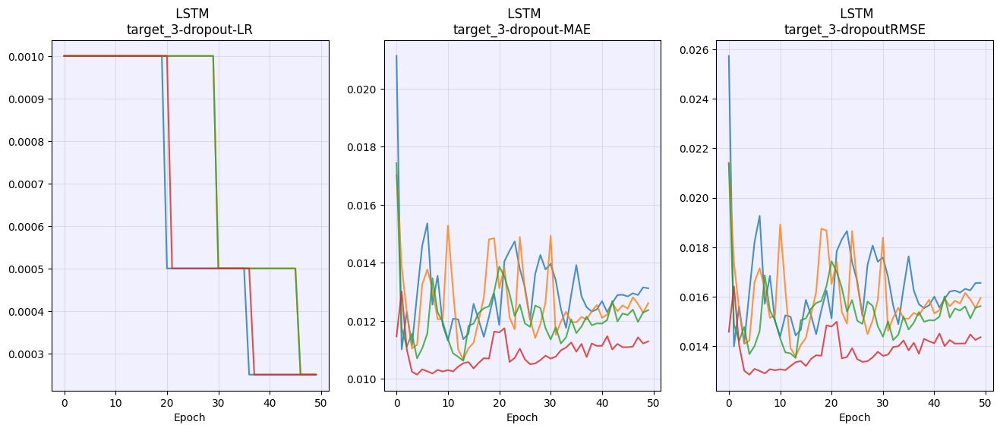

Epoch 01 | LR: 1.0e-04 | Train Loss: 0.0040 | Val Loss: 0.0011 | MAE: 0.0274 | RMSE: 0.0335
Epoch 03 | LR: 1.0e-04 | Train Loss: 0.0013 | Val Loss: 0.0005 | MAE: 0.0173 | RMSE: 0.0222
Epoch 05 | LR: 1.0e-04 | Train Loss: 0.0010 | Val Loss: 0.0010 | MAE: 0.0247 | RMSE: 0.0307
Epoch 07 | LR: 1.0e-04 | Train Loss: 0.0007 | Val Loss: 0.0010 | MAE: 0.0260 | RMSE: 0.0304
Epoch 09 | LR: 1.0e-04 | Train Loss: 0.0006 | Val Loss: 0.0004 | MAE: 0.0152 | RMSE: 0.0194
Epoch 11 | LR: 1.0e-04 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0141 | RMSE: 0.0178
Epoch 13 | LR: 1.0e-04 | Train Loss: 0.0005 | Val Loss: 0.0007 | MAE: 0.0206 | RMSE: 0.0257
Epoch 15 | LR: 1.0e-04 | Train Loss: 0.0004 | Val Loss: 0.0004 | MAE: 0.0155 | RMSE: 0.0193
Epoch 17 | LR: 1.0e-04 | Train Loss: 0.0004 | Val Loss: 0.0003 | MAE: 0.0128 | RMSE: 0.0162
Epoch 19 | LR: 1.0e-04 | Train Loss: 0.0004 | Val Loss: 0.0003 | MAE: 0.0126 | RMSE: 0.0159
Epoch 21 | LR: 1.0e-04 | Train Loss: 0.0003 | Val Loss: 0.0004 | MAE: 0.0166 | R

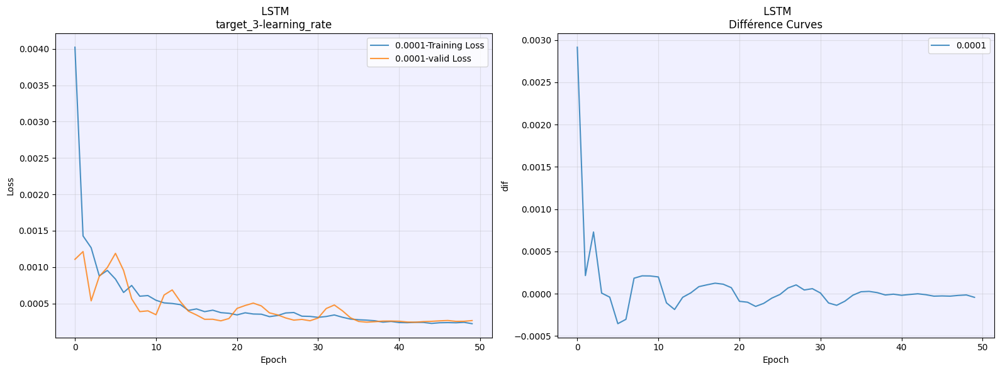

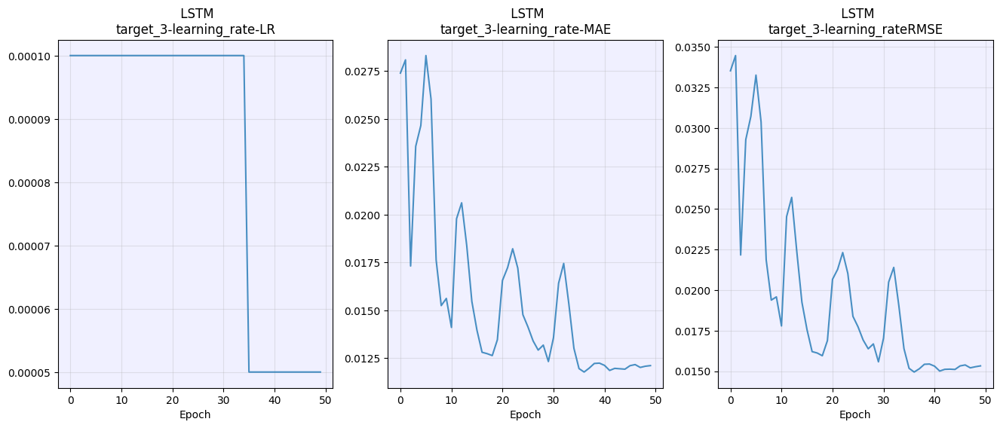

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0013 | Val Loss: 0.0003 | MAE: 0.0134 | RMSE: 0.0170
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0002 | MAE: 0.0118 | RMSE: 0.0149
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0111 | RMSE: 0.0141
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0111 | RMSE: 0.0142
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0133 | RMSE: 0.0167
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0120 | RMSE: 0.0152
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0112 | RMSE: 0.0142
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0125 | RMSE: 0.0159
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0118 | RMSE: 0.0149
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0112 | RMSE: 0.0141
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0120 | R

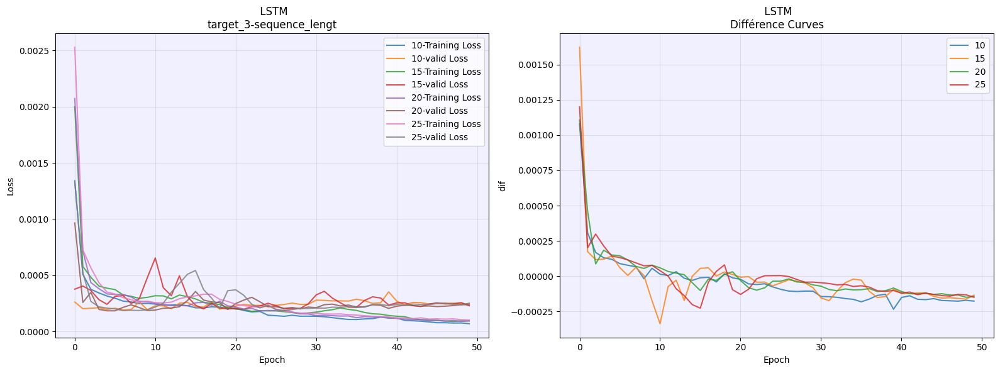

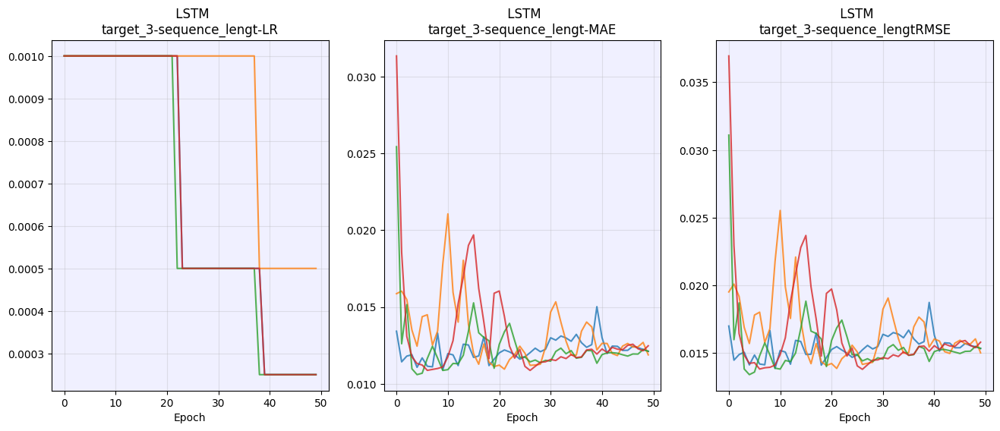

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0469 | Val Loss: 0.0083 | MAE: 0.0781 | RMSE: 0.0919
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0047 | Val Loss: 0.0008 | MAE: 0.0227 | RMSE: 0.0284
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0027 | Val Loss: 0.0017 | MAE: 0.0337 | RMSE: 0.0405
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0017 | Val Loss: 0.0006 | MAE: 0.0210 | RMSE: 0.0262
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0013 | Val Loss: 0.0003 | MAE: 0.0144 | RMSE: 0.0185
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0009 | Val Loss: 0.0007 | MAE: 0.0230 | RMSE: 0.0279
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0008 | Val Loss: 0.0013 | MAE: 0.0296 | RMSE: 0.0357
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0003 | MAE: 0.0148 | RMSE: 0.0186
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0138 | RMSE: 0.0177
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0005 | MAE: 0.0172 | RMSE: 0.0217
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0004 | MAE: 0.0152 | R

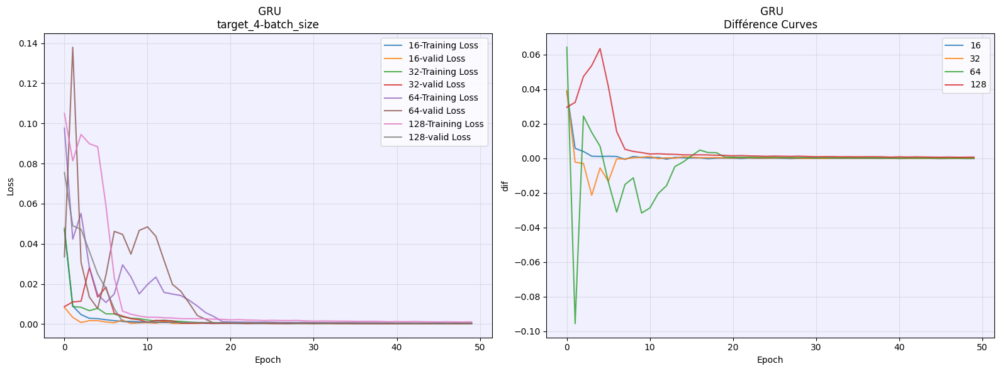

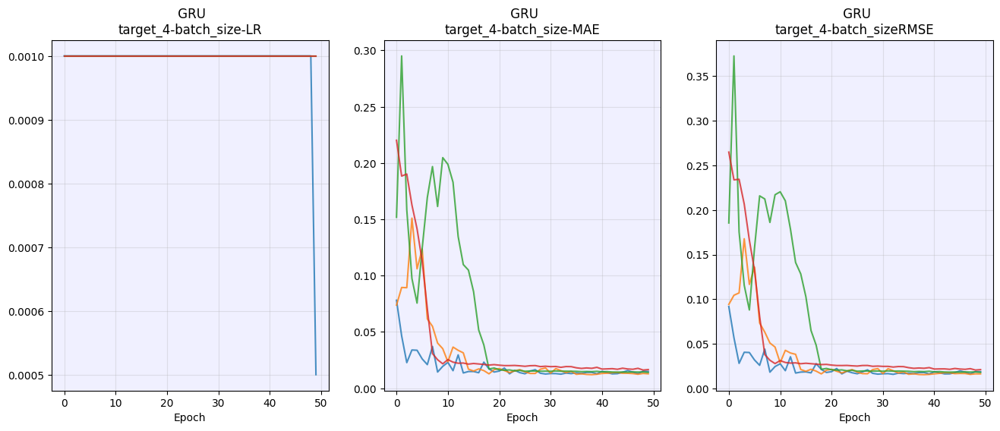

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.1608 | Val Loss: 0.5217 | MAE: 0.6173 | RMSE: 0.7256
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.1844 | Val Loss: 0.3105 | MAE: 0.4899 | RMSE: 0.5590
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.1011 | Val Loss: 0.1324 | MAE: 0.3165 | RMSE: 0.3655
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0474 | Val Loss: 0.0290 | MAE: 0.1524 | RMSE: 0.1710
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0170 | Val Loss: 0.0273 | MAE: 0.1397 | RMSE: 0.1663
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0120 | Val Loss: 0.0047 | MAE: 0.0544 | RMSE: 0.0693
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0025 | Val Loss: 0.0014 | MAE: 0.0277 | RMSE: 0.0366
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0020 | Val Loss: 0.0016 | MAE: 0.0312 | RMSE: 0.0394
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0014 | Val Loss: 0.0011 | MAE: 0.0247 | RMSE: 0.0321
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0013 | Val Loss: 0.0013 | MAE: 0.0282 | RMSE: 0.0361
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0011 | Val Loss: 0.0009 | MAE: 0.0219 | R

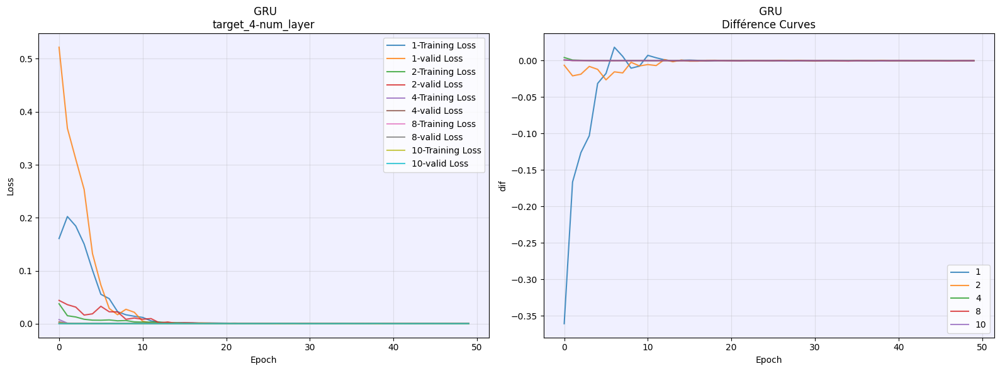

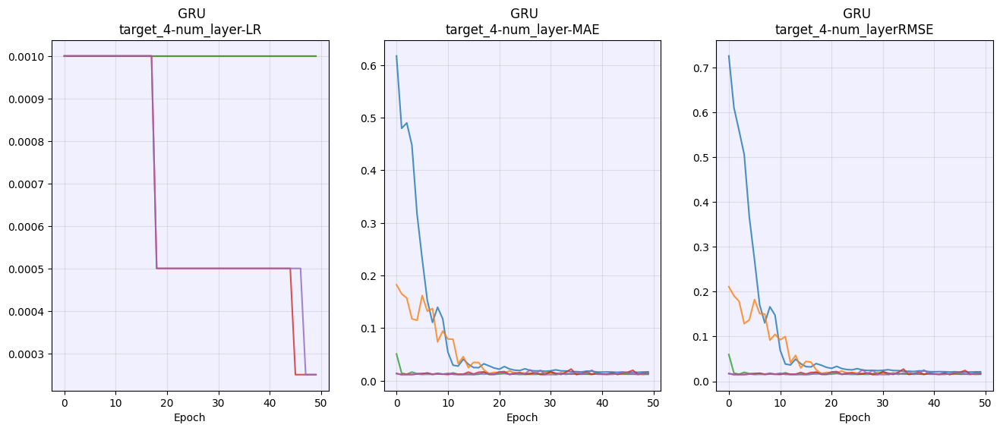

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0289 | Val Loss: 0.0094 | MAE: 0.0776 | RMSE: 0.0972
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0080 | Val Loss: 0.0062 | MAE: 0.0652 | RMSE: 0.0798
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0045 | Val Loss: 0.0041 | MAE: 0.0525 | RMSE: 0.0649
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0031 | Val Loss: 0.0010 | MAE: 0.0257 | RMSE: 0.0314
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0018 | Val Loss: 0.0006 | MAE: 0.0179 | RMSE: 0.0236
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0015 | Val Loss: 0.0007 | MAE: 0.0214 | RMSE: 0.0264
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0014 | Val Loss: 0.0017 | MAE: 0.0339 | RMSE: 0.0414
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0011 | Val Loss: 0.0004 | MAE: 0.0162 | RMSE: 0.0212
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0011 | Val Loss: 0.0017 | MAE: 0.0354 | RMSE: 0.0412
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0008 | Val Loss: 0.0008 | MAE: 0.0232 | RMSE: 0.0289
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0007 | MAE: 0.0220 | R

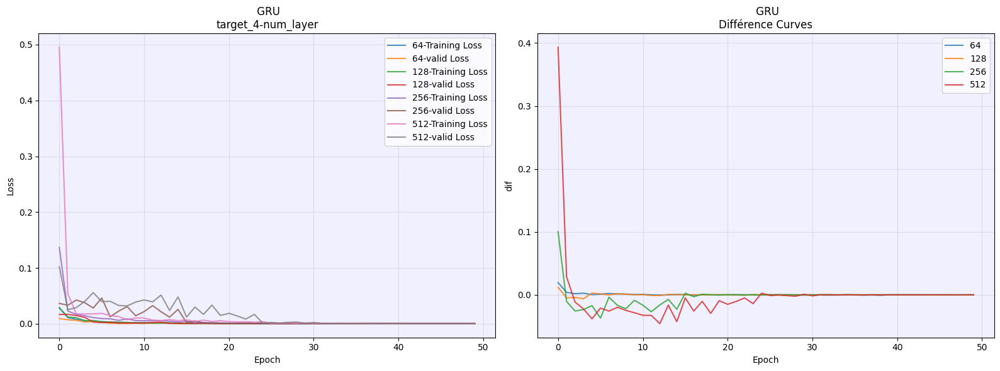

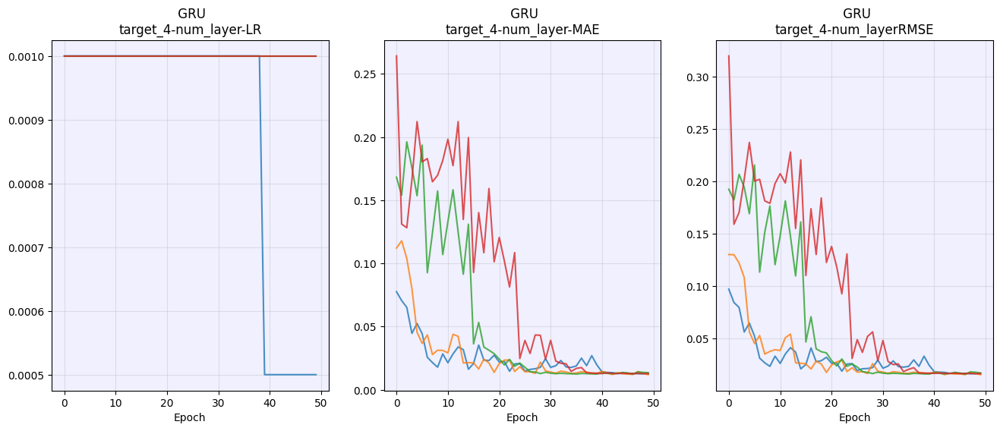

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0362 | Val Loss: 0.0063 | MAE: 0.0637 | RMSE: 0.0802
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0127 | Val Loss: 0.0213 | MAE: 0.1343 | RMSE: 0.1463
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0038 | Val Loss: 0.0111 | MAE: 0.0856 | RMSE: 0.1069
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0041 | Val Loss: 0.0058 | MAE: 0.0620 | RMSE: 0.0769
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0016 | Val Loss: 0.0007 | MAE: 0.0214 | RMSE: 0.0268
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0018 | Val Loss: 0.0031 | MAE: 0.0438 | RMSE: 0.0551
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0021 | Val Loss: 0.0054 | MAE: 0.0653 | RMSE: 0.0742
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0025 | Val Loss: 0.0055 | MAE: 0.0621 | RMSE: 0.0748
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0021 | Val Loss: 0.0054 | MAE: 0.0614 | RMSE: 0.0737
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0012 | Val Loss: 0.0027 | MAE: 0.0392 | RMSE: 0.0517
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0008 | Val Loss: 0.0004 | MAE: 0.0157 | R

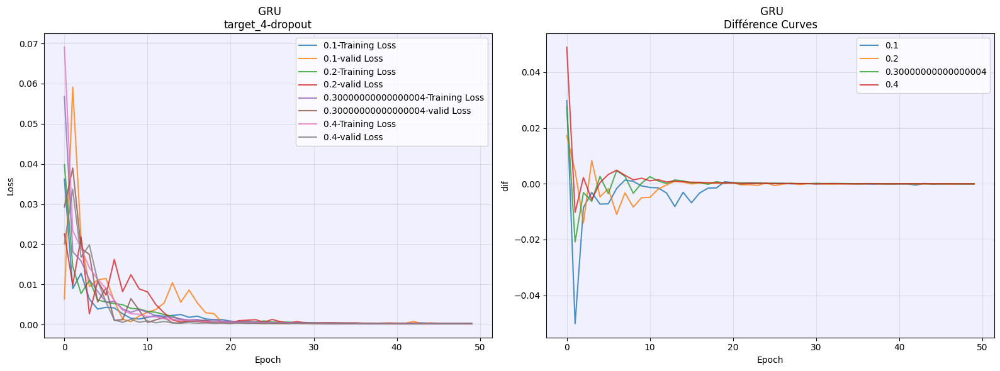

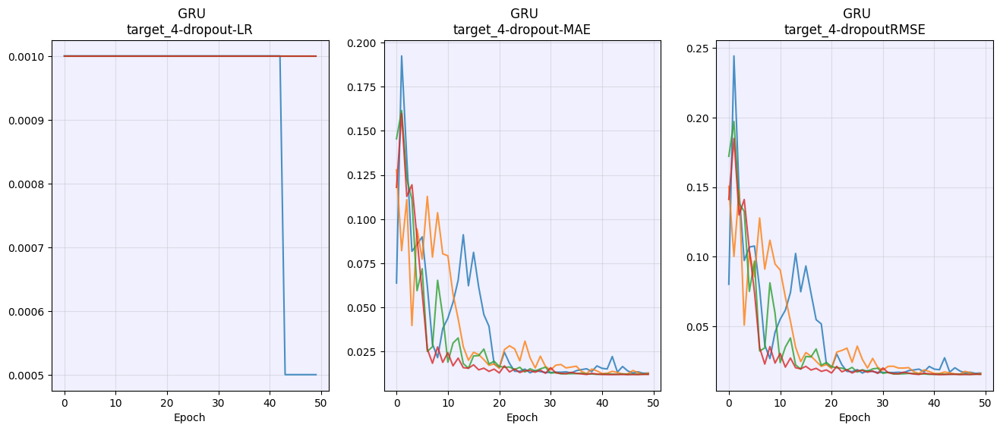

Epoch 01 | LR: 1.0e-04 | Train Loss: 0.0212 | Val Loss: 0.0191 | MAE: 0.1163 | RMSE: 0.1388
Epoch 03 | LR: 1.0e-04 | Train Loss: 0.0180 | Val Loss: 0.0193 | MAE: 0.1101 | RMSE: 0.1400
Epoch 05 | LR: 1.0e-04 | Train Loss: 0.0200 | Val Loss: 0.0069 | MAE: 0.0673 | RMSE: 0.0822
Epoch 07 | LR: 1.0e-04 | Train Loss: 0.0086 | Val Loss: 0.0052 | MAE: 0.0578 | RMSE: 0.0725
Epoch 09 | LR: 1.0e-04 | Train Loss: 0.0055 | Val Loss: 0.0020 | MAE: 0.0357 | RMSE: 0.0449
Epoch 11 | LR: 1.0e-04 | Train Loss: 0.0049 | Val Loss: 0.0016 | MAE: 0.0307 | RMSE: 0.0395
Epoch 13 | LR: 1.0e-04 | Train Loss: 0.0043 | Val Loss: 0.0017 | MAE: 0.0321 | RMSE: 0.0411
Epoch 15 | LR: 1.0e-04 | Train Loss: 0.0035 | Val Loss: 0.0014 | MAE: 0.0301 | RMSE: 0.0379
Epoch 17 | LR: 1.0e-04 | Train Loss: 0.0036 | Val Loss: 0.0010 | MAE: 0.0253 | RMSE: 0.0321
Epoch 19 | LR: 1.0e-04 | Train Loss: 0.0031 | Val Loss: 0.0011 | MAE: 0.0248 | RMSE: 0.0323
Epoch 21 | LR: 1.0e-04 | Train Loss: 0.0027 | Val Loss: 0.0010 | MAE: 0.0240 | R

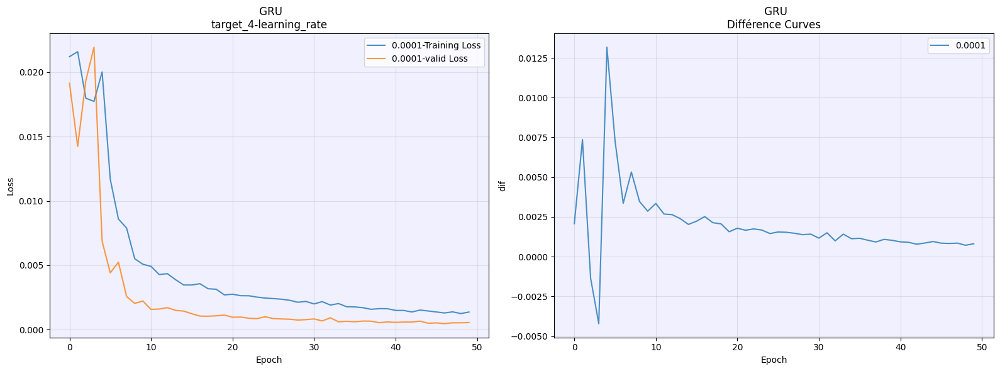

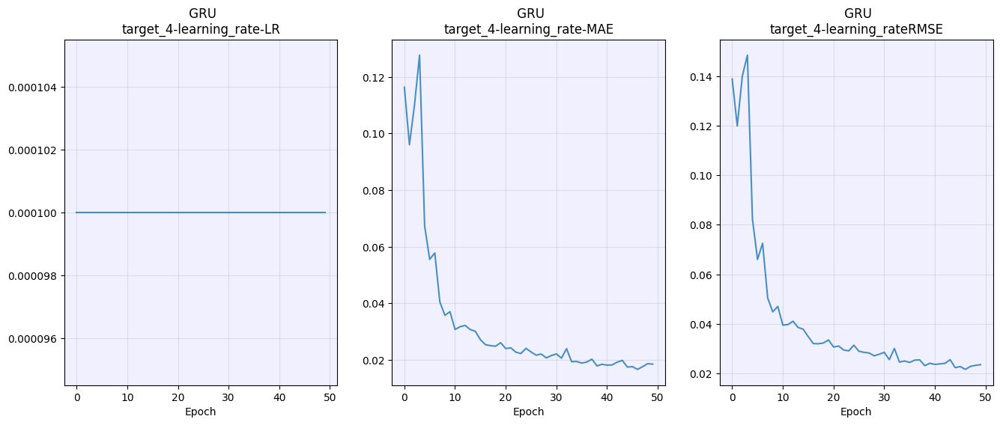

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0485 | Val Loss: 0.0071 | MAE: 0.0689 | RMSE: 0.0845
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0107 | Val Loss: 0.0053 | MAE: 0.0609 | RMSE: 0.0719
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0052 | Val Loss: 0.0040 | MAE: 0.0517 | RMSE: 0.0627
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0039 | Val Loss: 0.0038 | MAE: 0.0483 | RMSE: 0.0608
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0032 | Val Loss: 0.0037 | MAE: 0.0467 | RMSE: 0.0617
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0024 | Val Loss: 0.0011 | MAE: 0.0273 | RMSE: 0.0335
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0015 | Val Loss: 0.0024 | MAE: 0.0420 | RMSE: 0.0490
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0024 | Val Loss: 0.0009 | MAE: 0.0227 | RMSE: 0.0302
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0013 | Val Loss: 0.0023 | MAE: 0.0391 | RMSE: 0.0480
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0011 | Val Loss: 0.0008 | MAE: 0.0225 | RMSE: 0.0283
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0004 | MAE: 0.0149 | R

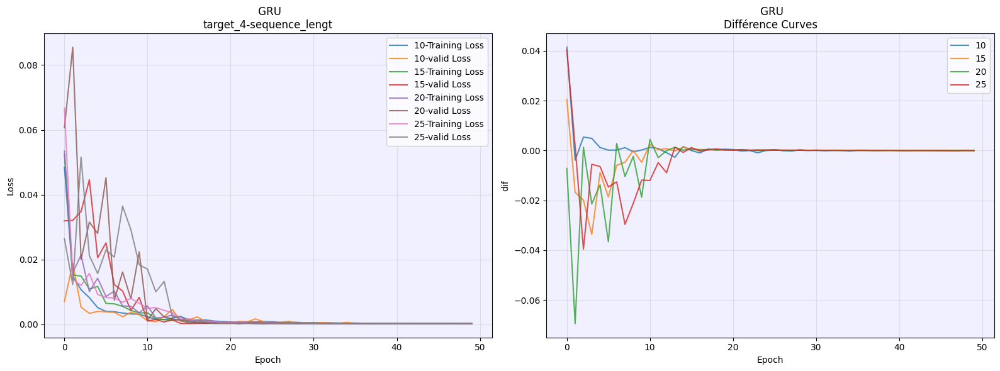

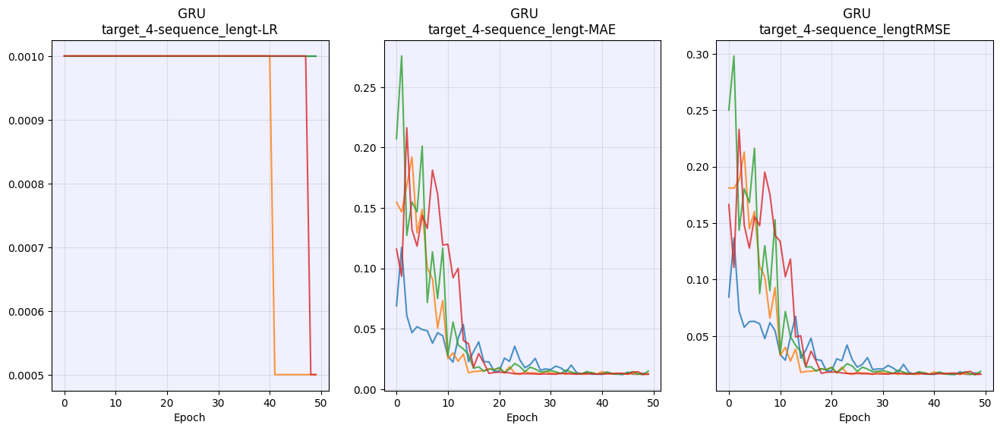

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0024 | Val Loss: 0.0008 | MAE: 0.0223 | RMSE: 0.0283
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0145 | RMSE: 0.0188
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0142 | RMSE: 0.0185
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0144 | RMSE: 0.0186
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0002 | MAE: 0.0126 | RMSE: 0.0164
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0139 | RMSE: 0.0177
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0004 | MAE: 0.0150 | RMSE: 0.0195
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0125 | RMSE: 0.0163
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0129 | RMSE: 0.0168
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0144 | RMSE: 0.0188
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0004 | MAE: 0.0157 | R

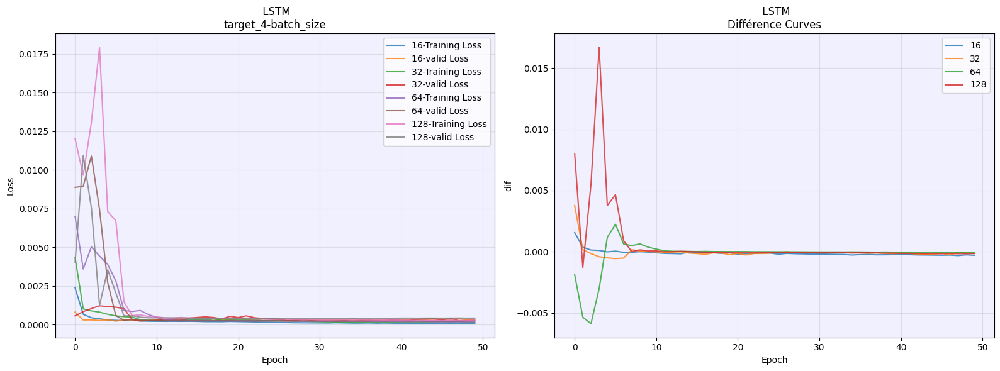

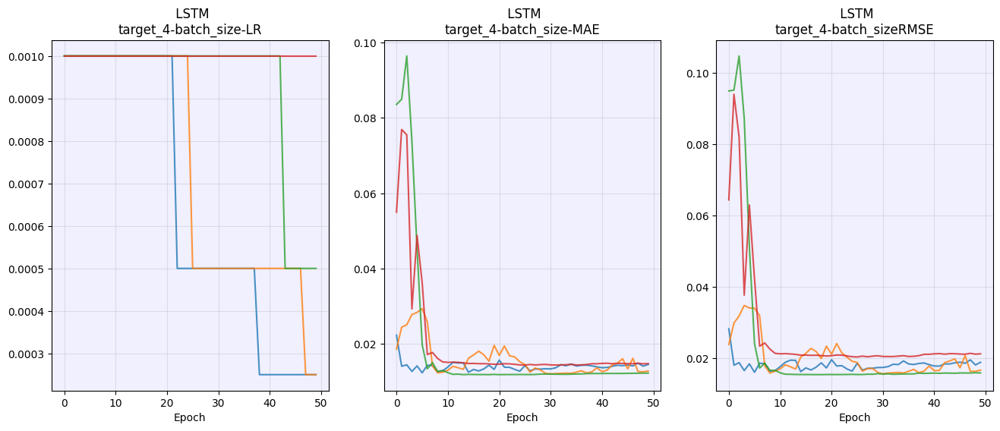

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0415 | Val Loss: 0.0213 | MAE: 0.1075 | RMSE: 0.1470
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0230 | Val Loss: 0.0102 | MAE: 0.0764 | RMSE: 0.1017
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0098 | Val Loss: 0.0046 | MAE: 0.0501 | RMSE: 0.0668
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0051 | Val Loss: 0.0027 | MAE: 0.0426 | RMSE: 0.0508
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0013 | Val Loss: 0.0015 | MAE: 0.0272 | RMSE: 0.0374
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0008 | Val Loss: 0.0012 | MAE: 0.0236 | RMSE: 0.0332
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0010 | MAE: 0.0221 | RMSE: 0.0302
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0009 | MAE: 0.0206 | RMSE: 0.0285
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0008 | MAE: 0.0202 | RMSE: 0.0281
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0008 | MAE: 0.0193 | RMSE: 0.0266
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0007 | MAE: 0.0186 | R

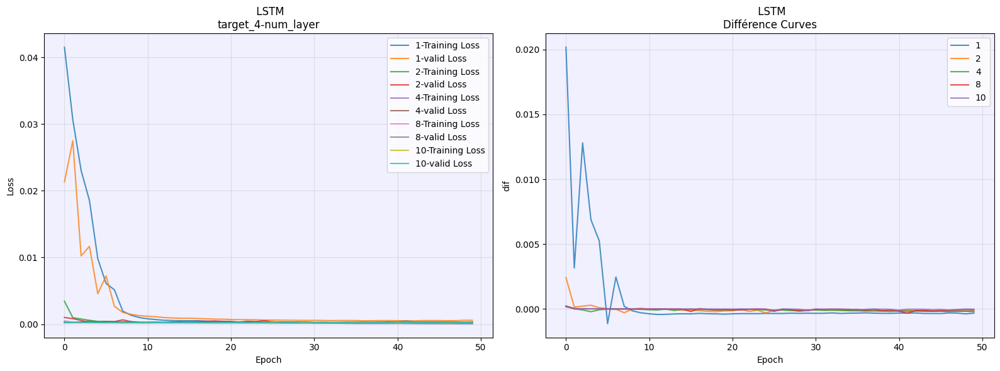

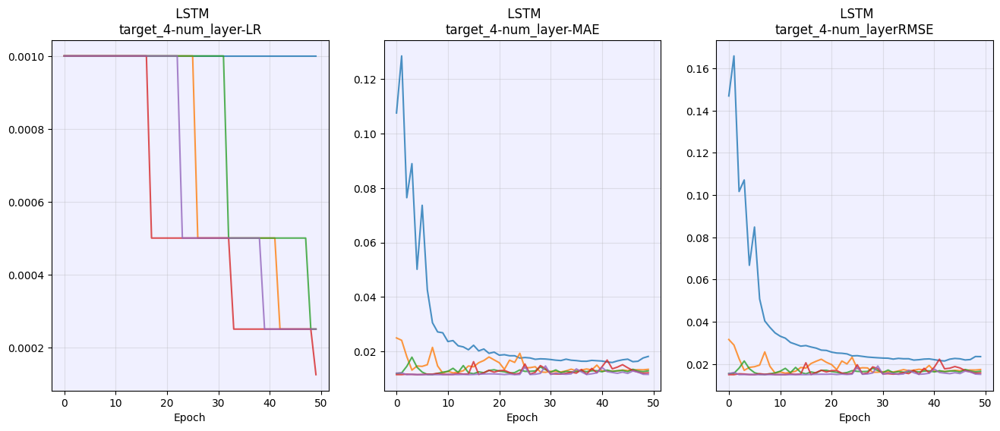

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0037 | Val Loss: 0.0009 | MAE: 0.0221 | RMSE: 0.0285
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0012 | Val Loss: 0.0007 | MAE: 0.0211 | RMSE: 0.0256
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0006 | Val Loss: 0.0013 | MAE: 0.0311 | RMSE: 0.0355
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0008 | MAE: 0.0239 | RMSE: 0.0278
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0007 | MAE: 0.0213 | RMSE: 0.0264
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0004 | MAE: 0.0172 | RMSE: 0.0215
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0007 | MAE: 0.0219 | RMSE: 0.0261
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0006 | MAE: 0.0192 | RMSE: 0.0240
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0005 | MAE: 0.0176 | RMSE: 0.0220
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0004 | MAE: 0.0157 | RMSE: 0.0196
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0004 | MAE: 0.0159 | R

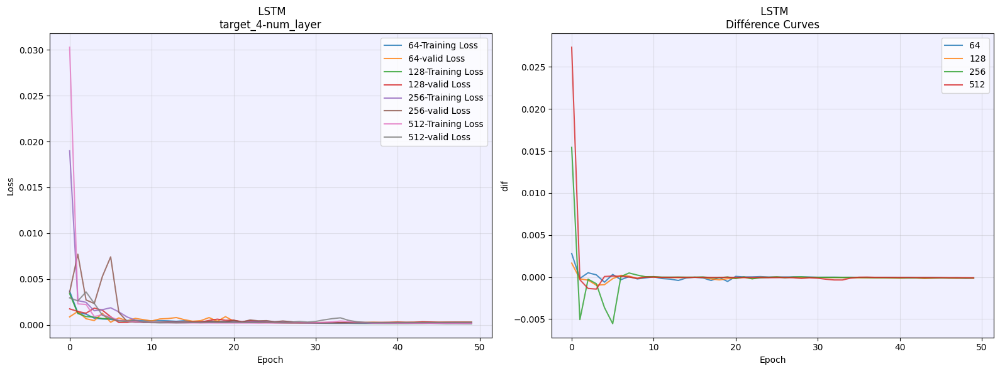

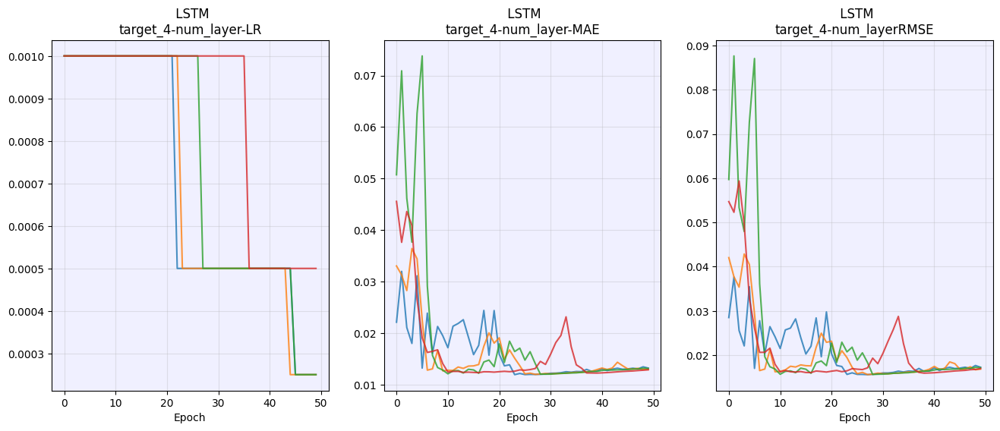

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0047 | Val Loss: 0.0013 | MAE: 0.0318 | RMSE: 0.0379
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0009 | Val Loss: 0.0019 | MAE: 0.0340 | RMSE: 0.0428
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0008 | Val Loss: 0.0017 | MAE: 0.0336 | RMSE: 0.0404
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0008 | MAE: 0.0259 | RMSE: 0.0306
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0007 | MAE: 0.0210 | RMSE: 0.0261
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0005 | Val Loss: 0.0003 | MAE: 0.0140 | RMSE: 0.0182
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0118 | RMSE: 0.0153
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0002 | Val Loss: 0.0003 | MAE: 0.0128 | RMSE: 0.0165
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0004 | MAE: 0.0151 | RMSE: 0.0189
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0005 | MAE: 0.0173 | RMSE: 0.0219
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0006 | MAE: 0.0205 | R

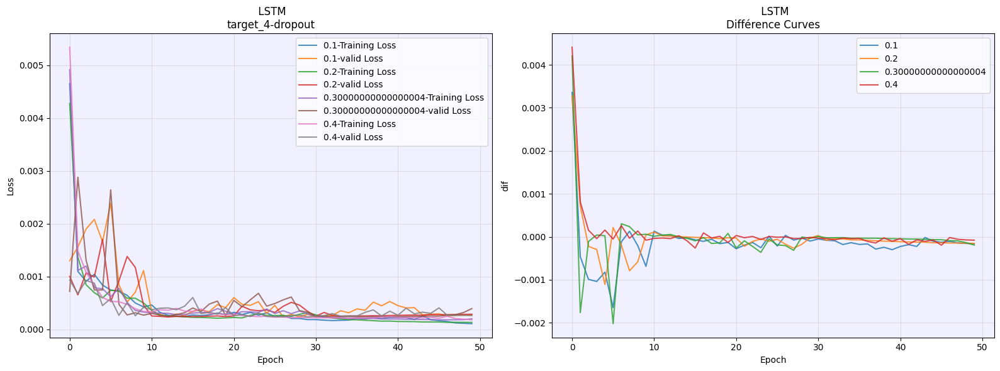

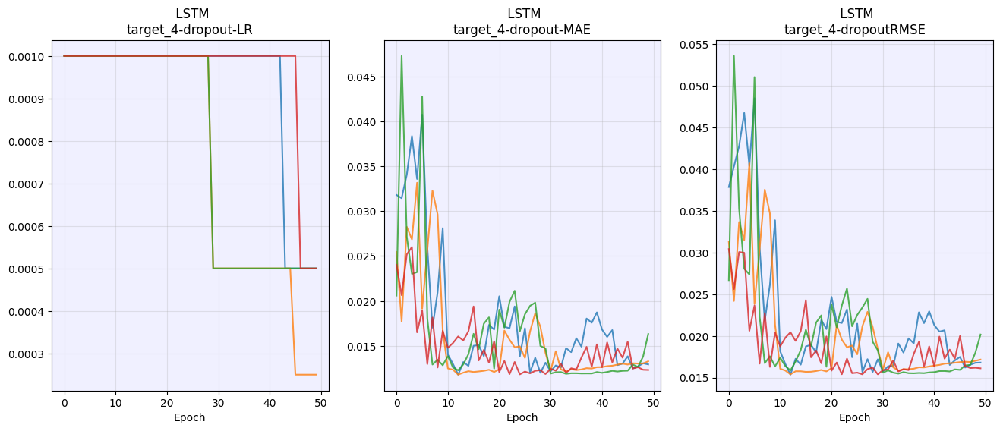

Epoch 01 | LR: 1.0e-04 | Train Loss: 0.0014 | Val Loss: 0.0008 | MAE: 0.0237 | RMSE: 0.0303
Epoch 03 | LR: 1.0e-04 | Train Loss: 0.0013 | Val Loss: 0.0015 | MAE: 0.0308 | RMSE: 0.0388
Epoch 05 | LR: 1.0e-04 | Train Loss: 0.0011 | Val Loss: 0.0005 | MAE: 0.0192 | RMSE: 0.0234
Epoch 07 | LR: 1.0e-04 | Train Loss: 0.0008 | Val Loss: 0.0007 | MAE: 0.0214 | RMSE: 0.0262
Epoch 09 | LR: 1.0e-04 | Train Loss: 0.0006 | Val Loss: 0.0004 | MAE: 0.0161 | RMSE: 0.0202
Epoch 11 | LR: 1.0e-04 | Train Loss: 0.0004 | Val Loss: 0.0003 | MAE: 0.0127 | RMSE: 0.0164
Epoch 13 | LR: 1.0e-04 | Train Loss: 0.0004 | Val Loss: 0.0003 | MAE: 0.0125 | RMSE: 0.0162
Epoch 15 | LR: 1.0e-04 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0125 | RMSE: 0.0162
Epoch 17 | LR: 1.0e-04 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0125 | RMSE: 0.0163
Epoch 19 | LR: 1.0e-04 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0124 | RMSE: 0.0162
Epoch 21 | LR: 1.0e-04 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0127 | R

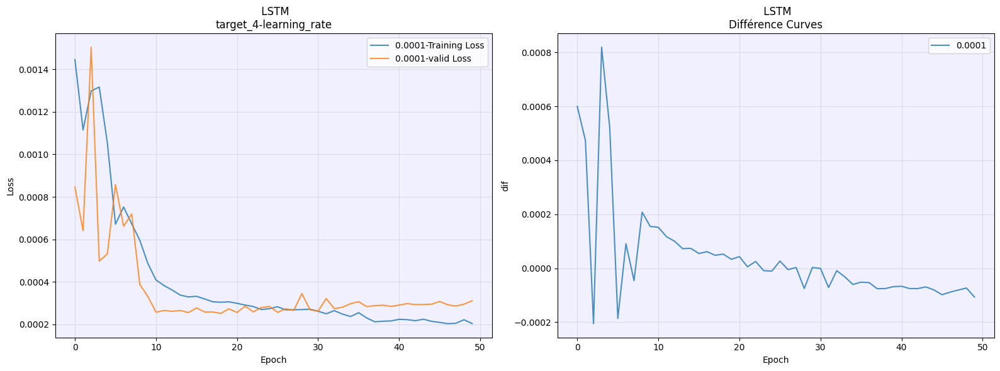

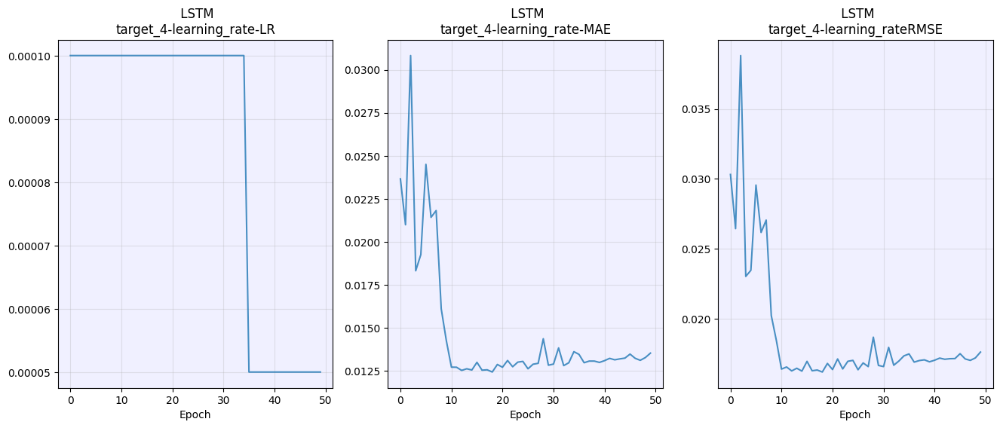

Epoch 01 | LR: 1.0e-03 | Train Loss: 0.0039 | Val Loss: 0.0006 | MAE: 0.0198 | RMSE: 0.0251
Epoch 03 | LR: 1.0e-03 | Train Loss: 0.0009 | Val Loss: 0.0008 | MAE: 0.0228 | RMSE: 0.0285
Epoch 05 | LR: 1.0e-03 | Train Loss: 0.0010 | Val Loss: 0.0005 | MAE: 0.0195 | RMSE: 0.0243
Epoch 07 | LR: 1.0e-03 | Train Loss: 0.0007 | Val Loss: 0.0017 | MAE: 0.0335 | RMSE: 0.0412
Epoch 09 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0009 | MAE: 0.0267 | RMSE: 0.0306
Epoch 11 | LR: 1.0e-03 | Train Loss: 0.0004 | Val Loss: 0.0003 | MAE: 0.0145 | RMSE: 0.0185
Epoch 13 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0125 | RMSE: 0.0160
Epoch 15 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0002 | MAE: 0.0122 | RMSE: 0.0158
Epoch 17 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0003 | MAE: 0.0132 | RMSE: 0.0170
Epoch 19 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0004 | MAE: 0.0150 | RMSE: 0.0189
Epoch 21 | LR: 1.0e-03 | Train Loss: 0.0003 | Val Loss: 0.0004 | MAE: 0.0158 | R

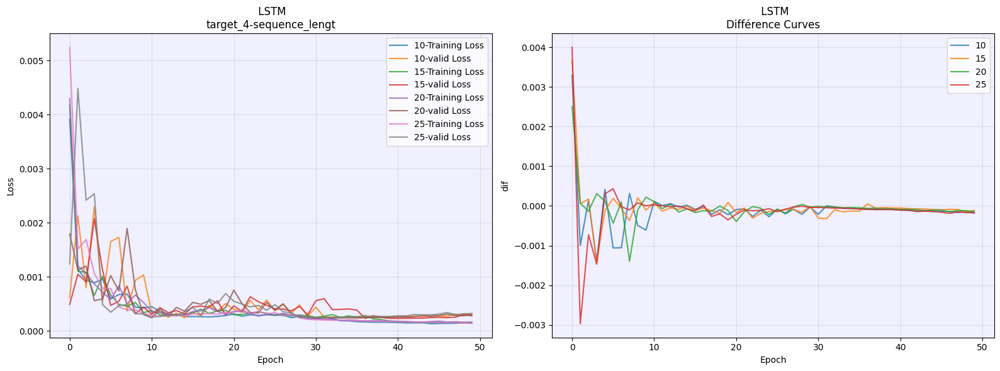

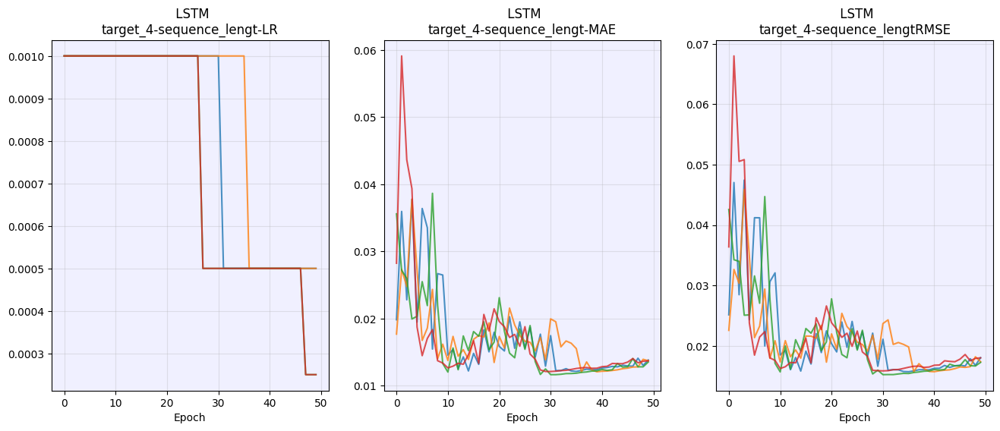

In [99]:
for idx in range(5):
    tgt=target_cols[idx]
    y = target_values[tgt]
    name,pric1,pric2 =getnameprice(idx)
    my_train_models_for_target(name,y,pric1,pric2, model_type='GRU')
    my_train_models_for_target(name,y,pric1,pric2)